INFO:2025-02-10 12:06:30,132:jax._src.xla_bridge:927: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2025-02-10 12:06:30.132 INFO: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
INFO:2025-02-10 12:06:30,135:jax._src.xla_bridge:927: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
2025-02-10 12:06:30.135 INFO: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


Initialising...
Running with noise value: 0.00025


2025-02-10 12:06:32.146 INFO: Initialized base in 1862 ms.
Building atmosphere: 100%|██████████| 6/6 [00:04<00:00,  1.24it/s]
2025-02-10 12:06:38.516 INFO: Initialized atmosphere in 6353 ms.
Running mapper (m2/f093): 100%|██████████| 1/1 [00:05<00:00,  5.96s/it]


mapdata_truth shape: (1, 1, 1000, 1000)
mapdata_truth mean: -8.726028151723567e-05


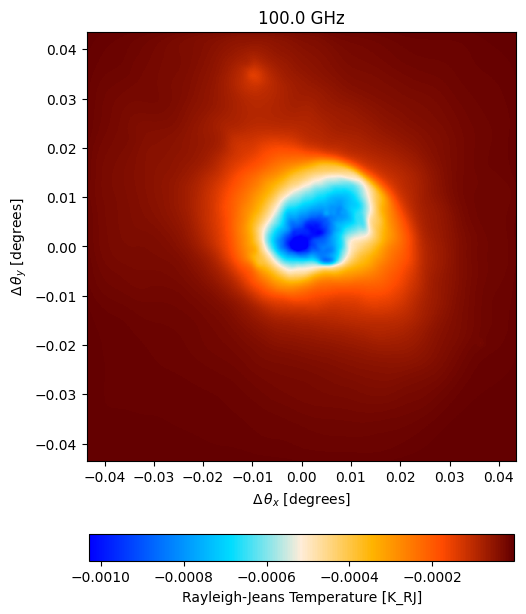

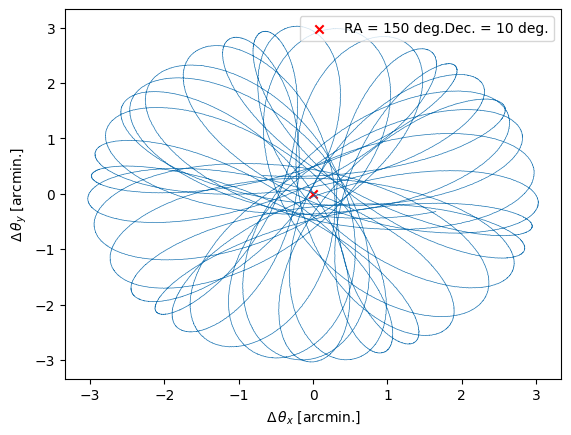

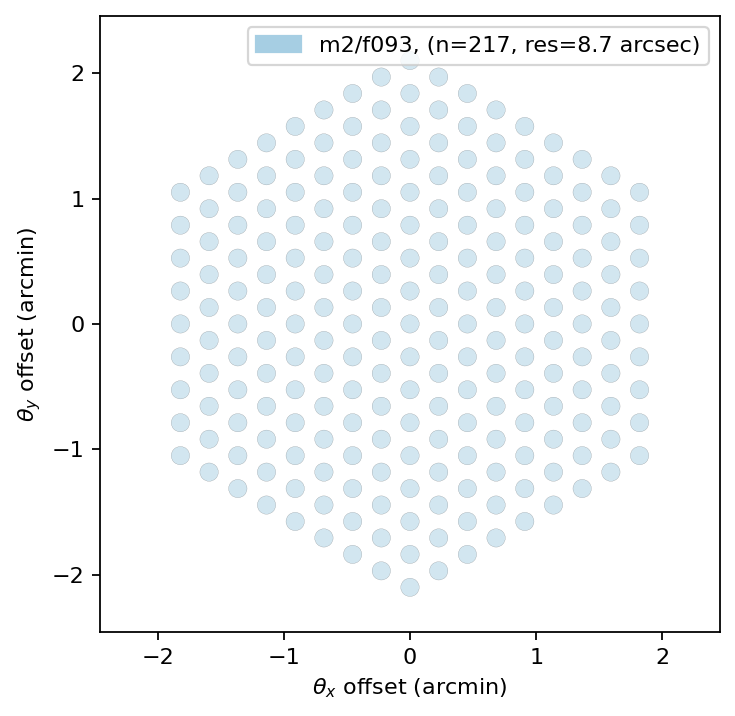

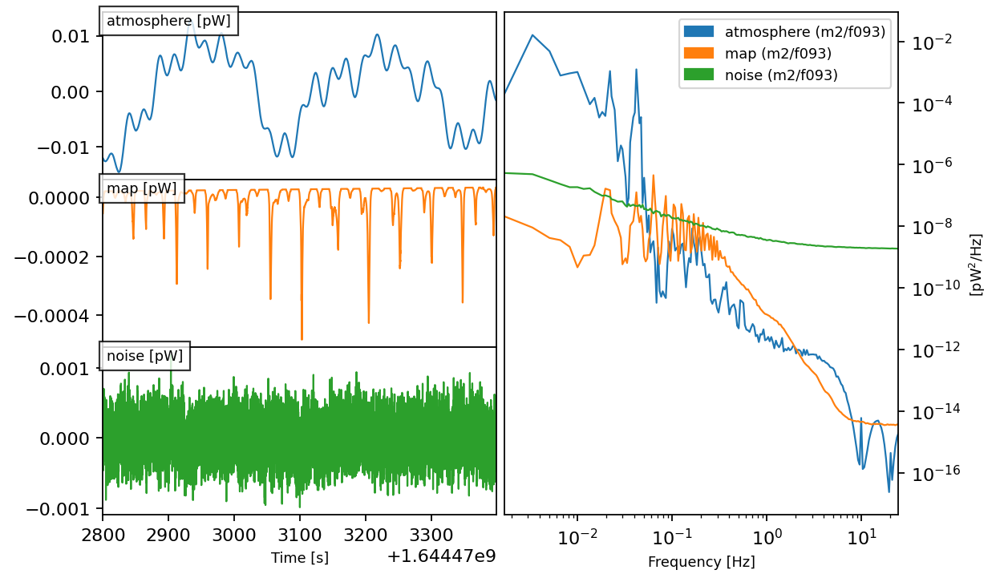

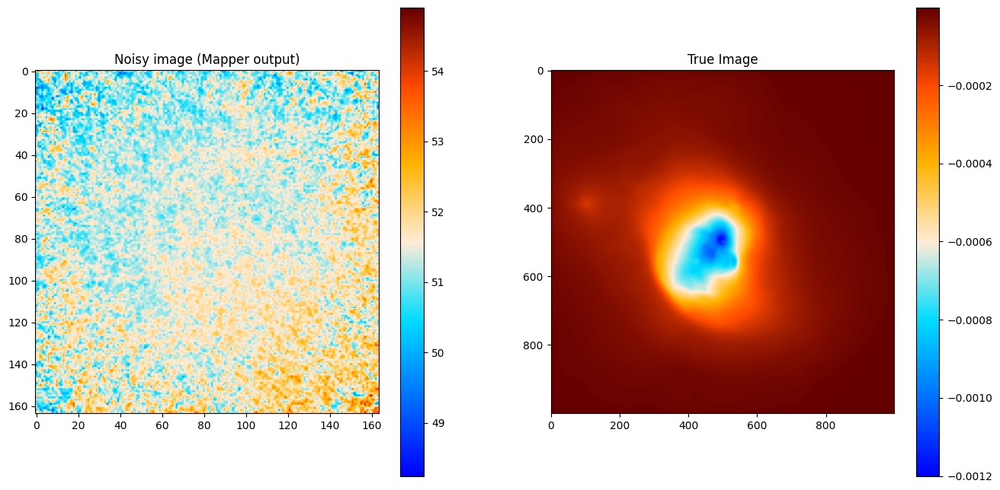

Running mapper (m2/f093): 100%|██████████| 1/1 [00:06<00:00,  6.76s/it]


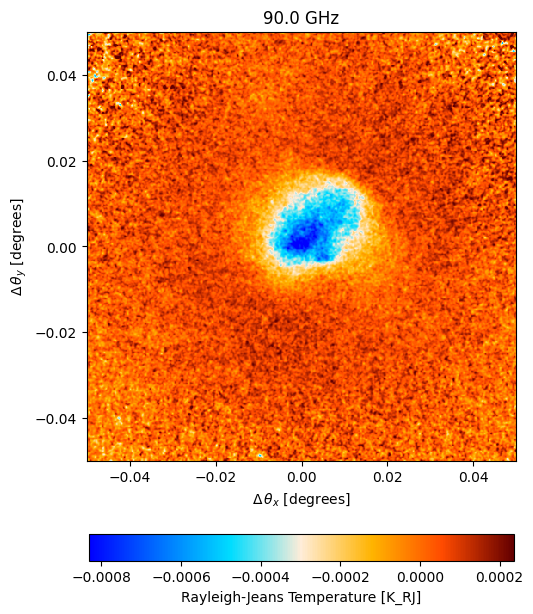

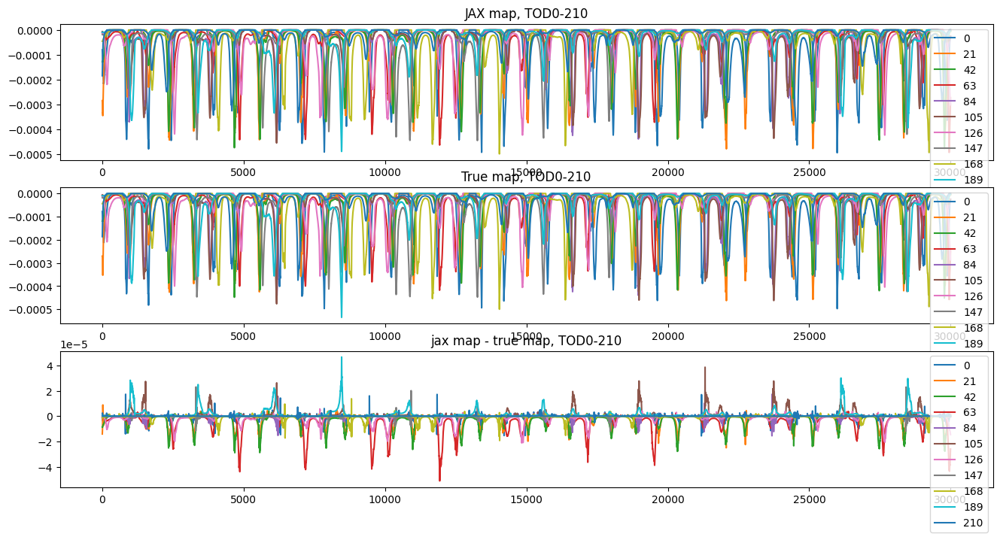

Noise stddev: 0.00025116378014696607


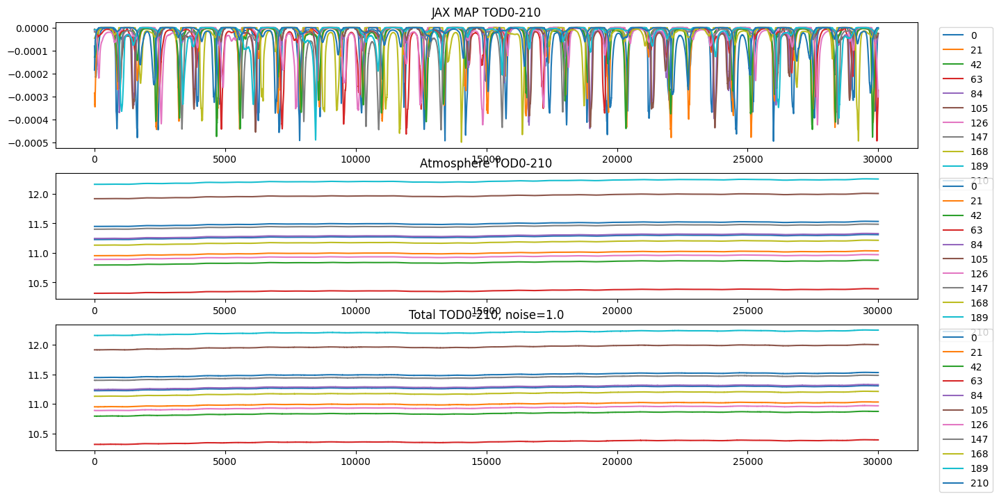

In [1]:
from nifty_maria.FitHandler import FitHandler

fit = FitHandler(config='mustang', fit_atmos=True, fit_map=True, plotsdir=None)

fit.simulate()

fit.reco_maria()

fit.sample_jax_tods(use_truth_slope=False)

In [2]:
n_split = -1
print(f"Will run with n_splits: {n_split}")
    
# Initialise, use samples after 0th iter:
fit.init_gps(n_split=n_split)

Will run with n_splits: -1
Initialised gp_tod: Model(
	<function CorrelatedFieldMaker.finalize.<locals>.correlated_field at 0x1542141cb560>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(30000,), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x15428532a660>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x15428532a660>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x15428532a660>, primals=ShapeWithDtype(shape=(30000,), dtype=<class 'jax.numpy.float64'>)),
		 'combcf z

In [3]:
# Show prior sample (only in 0th iter)
# prior_s = fit.draw_prior_sample()
import jax
import nifty8.re as jft

fit.key, sub = jax.random.split(fit.key)
xi = jft.random_like(sub, fit.signal_response_tod.domain)
res = fit.signal_response_tod(xi)

Running full fit!


OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:-1.2052e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7917e+05 Δ⛰:3.5864e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1140e+05 Δ⛰:3.2232e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1140e+05 Δ⛰:8.6072e-07 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1140e+05 Δ⛰:9.1386e-09 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1140e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1140e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.7785e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.1021e+05 Δ⛰:5.2887e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1024e+05 Δ⛰:2.7735e+01 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1024e+05 Δ⛰:4.3376e-07 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1024e+05 Δ⛰:7.3179e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1024e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1024e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.8742e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0454e+05 Δ⛰:1.1712e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0995e+05 Δ⛰:5.4110e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.099

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0014956506101277808, 0.0015, 0.0001
	loglogvarslope: -2.44989081525589, -2.45, 0.1
	zeromode std (LogNormal): 7.89924618745538e-06, 1e-05, 9.9e-06
map:
	fluctuations: 5.599107855658861e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.4999990393186033, -2.5, 0.1
	zeromode std (LogNormal): 9.950201000310623e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+2.4129e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0581e+05 Δ⛰:2.9187e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1006e+05 Δ⛰:4.2546e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1006e+05 Δ⛰:4.5071e-06 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1006e+05 Δ⛰:5.1281e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1006e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1006e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.4154e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9705e+05 Δ⛰:2.9125e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1030e+05 Δ⛰:1.3242e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1030e+05 Δ⛰:1.4411e-05 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1030e+05 Δ⛰:3.8592e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1030e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1030e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.0062e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0786e+05 Δ⛰:8.0848e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0872e+05 Δ⛰:8.5454e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0872e+05 Δ⛰:8.3894e-06 ➽:1.020

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015004406940986063, 0.0015, 0.0001
	loglogvarslope: -2.448889216364466, -2.45, 0.1
	zeromode std (LogNormal): 4.826801283559111e-06, 1e-05, 9.9e-06
map:
	fluctuations: 5.599108427355828e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.4999912332565746, -2.5, 0.1
	zeromode std (LogNormal): 9.950353946158825e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.9124e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0263e+05 Δ⛰:6.9387e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0881e+05 Δ⛰:6.1850e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0881e+05 Δ⛰:5.4787e-05 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0881e+05 Δ⛰:1.3155e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0881e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0881e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.8304e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8366e+05 Δ⛰:6.2526e+02 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0932e+05 Δ⛰:2.5662e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0932e+05 Δ⛰:2.0270e-05 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0932e+05 Δ⛰:1.7462e-10 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0932e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0932e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+7.9832e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0976e+05 Δ⛰:8.4930e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0993e+05 Δ⛰:1.7636e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0993e+05 Δ⛰:1.8617e-05 ➽:1.020

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015051767959461733, 0.0015, 0.0001
	loglogvarslope: -2.4461918996709433, -2.45, 0.1
	zeromode std (LogNormal): 2.970404178400501e-06, 1e-05, 9.9e-06
map:
	fluctuations: 5.599109690203099e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.499996571266941, -2.5, 0.1
	zeromode std (LogNormal): 9.949972083562372e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+3.2639e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0956e+05 Δ⛰:3.7735e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0996e+05 Δ⛰:4.0290e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0996e+05 Δ⛰:2.9871e-05 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0996e+05 Δ⛰:5.5996e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0996e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0996e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.0578e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9584e+05 Δ⛰:1.5536e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1113e+05 Δ⛰:1.5296e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1113e+05 Δ⛰:6.1133e-05 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1113e+05 Δ⛰:1.2224e-09 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1113e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1113e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.3029e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0943e+05 Δ⛰:1.8123e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1111e+05 Δ⛰:1.6772e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1111e+05 Δ⛰:1.4912e-05 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015097447976431695, 0.0015, 0.0001
	loglogvarslope: -2.439031732699186, -2.45, 0.1
	zeromode std (LogNormal): 1.8624399429864861e-06, 1e-05, 9.9e-06
map:
	fluctuations: 5.599115582805356e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.4999898882602247, -2.5, 0.1
	zeromode std (LogNormal): 9.95040352606026e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+3.4559e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9006e+05 Δ⛰:3.9459e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1007e+05 Δ⛰:2.0011e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1007e+05 Δ⛰:2.0586e-04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1007e+05 Δ⛰:5.6619e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1007e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1007e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.6495e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9318e+05 Δ⛰:1.6988e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1064e+05 Δ⛰:1.7466e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1064e+05 Δ⛰:5.0933e-05 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1064e+05 Δ⛰:3.4799e-06 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1064e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1064e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.2530e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0547e+05 Δ⛰:1.1308e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0949e+05 Δ⛰:4.0154e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0949e+05 Δ⛰:9.1229e-05 ➽:1.020

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015138692511209707, 0.0015, 0.0001
	loglogvarslope: -2.4207450336470147, -2.45, 0.1
	zeromode std (LogNormal): 1.2233774891831603e-06, 1e-05, 9.9e-06
map:
	fluctuations: 5.59915202637089e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.500149352689577, -2.5, 0.1
	zeromode std (LogNormal): 9.950354788623893e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+5.1657e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.1100e+05 Δ⛰:5.6767e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1101e+05 Δ⛰:1.6938e+01 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1101e+05 Δ⛰:2.6213e-04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1101e+05 Δ⛰:8.1200e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1101e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1101e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.6740e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6338e+05 Δ⛰:7.3078e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1017e+05 Δ⛰:4.6791e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1017e+05 Δ⛰:3.0944e-04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1017e+05 Δ⛰:1.5204e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1017e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1017e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+7.7865e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8478e+05 Δ⛰:8.2713e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0965e+05 Δ⛰:2.4872e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0965e+05 Δ⛰:2.5902e-04 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015170124312500646, 0.0015, 0.0001
	loglogvarslope: -2.3783381485108306, -2.45, 0.1
	zeromode std (LogNormal): 8.887854308249861e-07, 1e-05, 9.9e-06
map:
	fluctuations: 5.599313308787807e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.5007742720556214, -2.5, 0.1
	zeromode std (LogNormal): 9.950372084575874e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+4.0097e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9018e+05 Δ⛰:8.9115e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0939e+05 Δ⛰:1.9212e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0939e+05 Δ⛰:4.0907e-04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0939e+05 Δ⛰:1.1665e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0939e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0939e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+8.6679e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0723e+05 Δ⛰:9.1751e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1039e+05 Δ⛰:3.1578e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1039e+05 Δ⛰:8.9410e-04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1039e+05 Δ⛰:1.9734e-06 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1039e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1039e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.9766e+04 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.1024e+05 Δ⛰:4.7048e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1068e+05 Δ⛰:4.3651e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1068e+05 Δ⛰:8.2686e-04 ➽:1.020

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015186294973321855, 0.0015, 0.0001
	loglogvarslope: -2.298590383911028, -2.45, 0.1
	zeromode std (LogNormal): 7.542570400541653e-07, 1e-05, 9.9e-06
map:
	fluctuations: 5.600038798248601e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.502984348333492, -2.5, 0.1
	zeromode std (LogNormal): 9.950373087094123e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.5363e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0215e+05 Δ⛰:1.5865e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0990e+05 Δ⛰:7.7453e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0990e+05 Δ⛰:1.1504e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0990e+05 Δ⛰:2.6663e-05 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0990e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0990e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.5019e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0897e+05 Δ⛰:4.0109e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0913e+05 Δ⛰:1.6426e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0913e+05 Δ⛰:9.2177e-04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0913e+05 Δ⛰:9.0455e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0913e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0913e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.4206e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0783e+05 Δ⛰:1.6576e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1142e+05 Δ⛰:3.5934e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1142e+05 Δ⛰:6.0123e-04 ➽:1.02

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015190897019771272, 0.0015, 0.0001
	loglogvarslope: -2.1902159094166556, -2.45, 0.1
	zeromode std (LogNormal): 7.198603007632936e-07, 1e-05, 9.9e-06
map:
	fluctuations: 5.601462877190697e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.507634852844825, -2.5, 0.1
	zeromode std (LogNormal): 9.950355053581072e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-2.9991e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.1197e+05 Δ⛰:2.1207e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1198e+05 Δ⛰:1.0260e+01 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1198e+05 Δ⛰:9.3143e-04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1198e+05 Δ⛰:6.6531e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1198e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1198e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.9555e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7674e+05 Δ⛰:2.4323e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1009e+05 Δ⛰:3.3351e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1009e+05 Δ⛰:9.4921e-04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1009e+05 Δ⛰:9.8592e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1009e+05 Δ⛰:1.1642e-10 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1009e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-1.2117e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0950e+05 Δ⛰:3.8833e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1117e+05 Δ⛰:1.6673e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1117e+05 Δ⛰:1.5736e-03 ➽:1.020

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015193216389101513, 0.0015, 0.0001
	loglogvarslope: -2.0754598111106684, -2.45, 0.1
	zeromode std (LogNormal): 7.031282439800637e-07, 1e-05, 9.9e-06
map:
	fluctuations: 5.6024036475447816e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.5110424128186555, -2.5, 0.1
	zeromode std (LogNormal): 9.9503716059583e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+2.7333e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0961e+05 Δ⛰:2.7843e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0983e+05 Δ⛰:2.1783e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0983e+05 Δ⛰:1.5128e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0983e+05 Δ⛰:1.4853e-05 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0983e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0983e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.4956e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9883e+05 Δ⛰:1.5455e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0898e+05 Δ⛰:1.0150e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0898e+05 Δ⛰:7.1320e-04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0898e+05 Δ⛰:1.9092e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0898e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0898e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.9852e+02 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8942e+05 Δ⛰:4.8962e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1068e+05 Δ⛰:2.1260e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1068e+05 Δ⛰:2.1144e-03 ➽:1.020

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015195903596494959, 0.0015, 0.0001
	loglogvarslope: -1.9605429637244207, -2.45, 0.1
	zeromode std (LogNormal): 6.842308092789776e-07, 1e-05, 9.9e-06
map:
	fluctuations: 5.602637891634136e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.511029244343313, -2.5, 0.1
	zeromode std (LogNormal): 9.950371021807844e-10, 1e-08, 1e-07


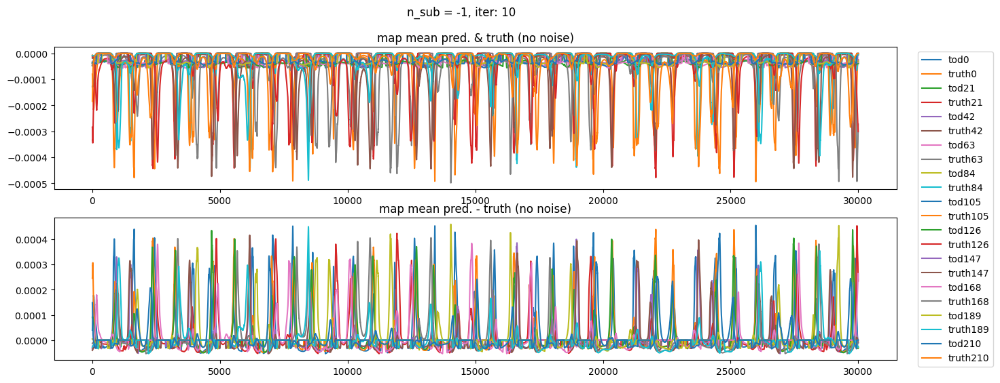

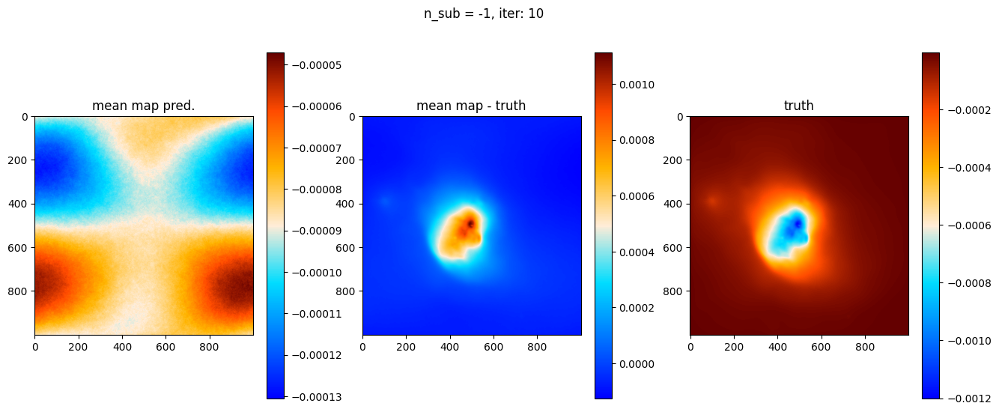

OPTIMIZE_KL: Starting 0011
SL: Iteration 0 ⛰:+1.6794e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5803e+05 Δ⛰:2.1374e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1098e+05 Δ⛰:5.2957e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1098e+05 Δ⛰:9.6934e-04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1098e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1098e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1098e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.6583e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0931e+05 Δ⛰:3.1676e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0973e+05 Δ⛰:4.2553e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0973e+05 Δ⛰:8.1329e-04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0973e+05 Δ⛰:4.3778e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0973e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0973e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-2.6075e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0220e+05 Δ⛰:2.4146e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1056e+05 Δ⛰:8.3590e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.105

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015199152544132222, 0.0015, 0.0001
	loglogvarslope: -1.8456559758754203, -2.45, 0.1
	zeromode std (LogNormal): 6.620644399360032e-07, 1e-05, 9.9e-06
map:
	fluctuations: 5.6025744055437386e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.510534899700059, -2.5, 0.1
	zeromode std (LogNormal): 9.950398589773265e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.5651e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0201e+05 Δ⛰:2.0671e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0977e+05 Δ⛰:7.7622e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0977e+05 Δ⛰:5.1626e-04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0977e+05 Δ⛰:1.8027e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0977e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0977e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.2926e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0920e+05 Δ⛰:1.8018e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0929e+05 Δ⛰:9.7261e+01 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0929e+05 Δ⛰:1.1202e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0929e+05 Δ⛰:3.7136e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0929e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0929e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-2.8737e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0648e+05 Δ⛰:2.1911e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1038e+05 Δ⛰:3.9068e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1038e+05 Δ⛰:8.5151e-04 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015203141791050017, 0.0015, 0.0001
	loglogvarslope: -1.730843581285471, -2.45, 0.1
	zeromode std (LogNormal): 6.358325723274246e-07, 1e-05, 9.9e-06
map:
	fluctuations: 5.6024320811634905e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.510657940152008, -2.5, 0.1
	zeromode std (LogNormal): 9.950333603129858e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.9392e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0843e+05 Δ⛰:2.4477e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0939e+05 Δ⛰:9.6009e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0939e+05 Δ⛰:1.2693e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0939e+05 Δ⛰:7.5263e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0939e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0939e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.5520e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8861e+05 Δ⛰:3.0406e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0985e+05 Δ⛰:2.1238e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0985e+05 Δ⛰:1.9859e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0985e+05 Δ⛰:1.7555e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0985e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0985e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.8105e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0881e+05 Δ⛰:2.8614e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1004e+05 Δ⛰:1.2259e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1004e+05 Δ⛰:7.0315e-04 ➽:1.02

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015208122434056765, 0.0015, 0.0001
	loglogvarslope: -1.6161637537676286, -2.45, 0.1
	zeromode std (LogNormal): 6.045447274601877e-07, 1e-05, 9.9e-06
map:
	fluctuations: 5.60238966957265e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.509646080429221, -2.5, 0.1
	zeromode std (LogNormal): 9.950371125984763e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-1.2615e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9881e+05 Δ⛰:3.7265e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1110e+05 Δ⛰:1.2293e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1110e+05 Δ⛰:1.1373e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1110e+05 Δ⛰:1.7678e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1110e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1110e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+7.9647e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.1004e+05 Δ⛰:8.4747e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1085e+05 Δ⛰:8.0816e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1085e+05 Δ⛰:9.0828e-04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1085e+05 Δ⛰:8.4861e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1085e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1085e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:-6.4443e+04 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8410e+05 Δ⛰:4.1965e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1033e+05 Δ⛰:2.6233e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1033e+05 Δ⛰:2.5079e-03 ➽:1.02

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015214461183010754, 0.0015, 0.0001
	loglogvarslope: -1.5017155395959612, -2.45, 0.1
	zeromode std (LogNormal): 5.669551983265609e-07, 1e-05, 9.9e-06
map:
	fluctuations: 5.60229610063344e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.5090924080287182, -2.5, 0.1
	zeromode std (LogNormal): 9.950372629217571e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+4.4445e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0338e+05 Δ⛰:4.9479e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1149e+05 Δ⛰:8.1117e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1149e+05 Δ⛰:1.7630e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1149e+05 Δ⛰:3.1461e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1149e+05 Δ⛰:1.1642e-10 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1149e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.3685e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0763e+05 Δ⛰:2.8762e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0916e+05 Δ⛰:1.5249e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0916e+05 Δ⛰:1.5464e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0916e+05 Δ⛰:3.8667e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0916e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0916e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.5845e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0862e+05 Δ⛰:2.6354e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0948e+05 Δ⛰:8.6406e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0948e+05 Δ⛰:9.9370e-04 ➽:1.020

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001522268257249649, 0.0015, 0.0001
	loglogvarslope: -1.3876391904240832, -2.45, 0.1
	zeromode std (LogNormal): 5.216822165911286e-07, 1e-05, 9.9e-06
map:
	fluctuations: 5.6020262563609996e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.509945011720818, -2.5, 0.1
	zeromode std (LogNormal): 9.950379948398868e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.7978e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9487e+05 Δ⛰:2.2927e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0955e+05 Δ⛰:1.4682e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0955e+05 Δ⛰:1.4942e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0955e+05 Δ⛰:1.0623e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0955e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0955e+05 Δ⛰:1.1642e-10 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.0217e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0516e+05 Δ⛰:9.0732e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1015e+05 Δ⛰:4.9964e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1015e+05 Δ⛰:1.3036e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1015e+05 Δ⛰:1.1874e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1015e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1015e+05 Δ⛰:1.1642e-10 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.0875e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0984e+05 Δ⛰:1.1385e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1047e+05 Δ⛰:6.3110e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1047e+05 Δ⛰:1.2323e-03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001523351441367891, 0.0015, 0.0001
	loglogvarslope: -1.2741356951261398, -2.45, 0.1
	zeromode std (LogNormal): 4.675388955940423e-07, 1e-05, 9.9e-06
map:
	fluctuations: 5.6019102249360244e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.50958869987146, -2.5, 0.1
	zeromode std (LogNormal): 9.95037296801041e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+4.4083e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9892e+05 Δ⛰:9.3975e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0902e+05 Δ⛰:1.0095e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0902e+05 Δ⛰:1.1974e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0902e+05 Δ⛰:2.3644e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0902e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0902e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.7755e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9189e+05 Δ⛰:8.6944e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1008e+05 Δ⛰:1.8197e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1008e+05 Δ⛰:2.4317e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1008e+05 Δ⛰:3.9407e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1008e+05 Δ⛰:1.1642e-10 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1008e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.2606e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0518e+05 Δ⛰:7.9114e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1126e+05 Δ⛰:6.0860e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1126e+05 Δ⛰:1.3389e-03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015247860778601818, 0.0015, 0.0001
	loglogvarslope: -1.161405748040369, -2.45, 0.1
	zeromode std (LogNormal): 4.0442814297345305e-07, 1e-05, 9.9e-06
map:
	fluctuations: 5.601894483374504e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.507270312585422, -2.5, 0.1
	zeromode std (LogNormal): 9.950361924525844e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-4.1620e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7220e+05 Δ⛰:5.6003e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1150e+05 Δ⛰:3.9298e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1150e+05 Δ⛰:7.8074e-04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1150e+05 Δ⛰:8.2073e-09 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1150e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1150e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.0166e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8520e+05 Δ⛰:1.0651e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1024e+05 Δ⛰:2.5043e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1024e+05 Δ⛰:3.2020e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1024e+05 Δ⛰:4.1269e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1024e+05 Δ⛰:1.7462e-10 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1024e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.3773e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0936e+05 Δ⛰:1.8867e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0950e+05 Δ⛰:1.3570e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0950e+05 Δ⛰:1.3925e-03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015266657584984446, 0.0015, 0.0001
	loglogvarslope: -1.049550766029447, -2.45, 0.1
	zeromode std (LogNormal): 3.3451640658196483e-07, 1e-05, 9.9e-06
map:
	fluctuations: 5.6015178718347e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.507867978023387, -2.5, 0.1
	zeromode std (LogNormal): 9.950366588683604e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+2.0243e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6408e+05 Δ⛰:2.4884e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1101e+05 Δ⛰:4.6930e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1101e+05 Δ⛰:1.1295e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1101e+05 Δ⛰:3.5600e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1101e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1101e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.0977e+04 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9965e+05 Δ⛰:5.6063e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1144e+05 Δ⛰:1.1787e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1144e+05 Δ⛰:2.3113e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1144e+05 Δ⛰:2.0186e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1144e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1144e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.4259e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7817e+05 Δ⛰:2.9041e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1010e+05 Δ⛰:3.1930e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1010e+05 Δ⛰:2.0008e-03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015290579099165227, 0.0015, 0.0001
	loglogvarslope: -0.9383953982398872, -2.45, 0.1
	zeromode std (LogNormal): 2.6282638463019727e-07, 1e-05, 9.9e-06
map:
	fluctuations: 5.601478527910109e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.505926092379794, -2.5, 0.1
	zeromode std (LogNormal): 9.95037690904385e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+2.7637e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0401e+05 Δ⛰:3.2677e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0986e+05 Δ⛰:5.8499e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0986e+05 Δ⛰:3.8638e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0986e+05 Δ⛰:8.7515e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0986e+05 Δ⛰:2.3283e-10 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0986e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.5515e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0892e+05 Δ⛰:7.0604e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1067e+05 Δ⛰:1.7493e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1067e+05 Δ⛰:1.8735e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1067e+05 Δ⛰:1.1123e-06 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1067e+05 Δ⛰:2.3283e-10 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1067e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.3576e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0801e+05 Δ⛰:1.4084e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1108e+05 Δ⛰:3.0703e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1108e+05 Δ⛰:1.4094e-03 ➽:1.020

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001531976741986947, 0.0015, 0.0001
	loglogvarslope: -0.8274061561428618, -2.45, 0.1
	zeromode std (LogNormal): 1.959200127396433e-07, 1e-05, 9.9e-06
map:
	fluctuations: 5.601147599825529e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.506720967943026, -2.5, 0.1
	zeromode std (LogNormal): 9.950413207790019e-10, 1e-08, 1e-07


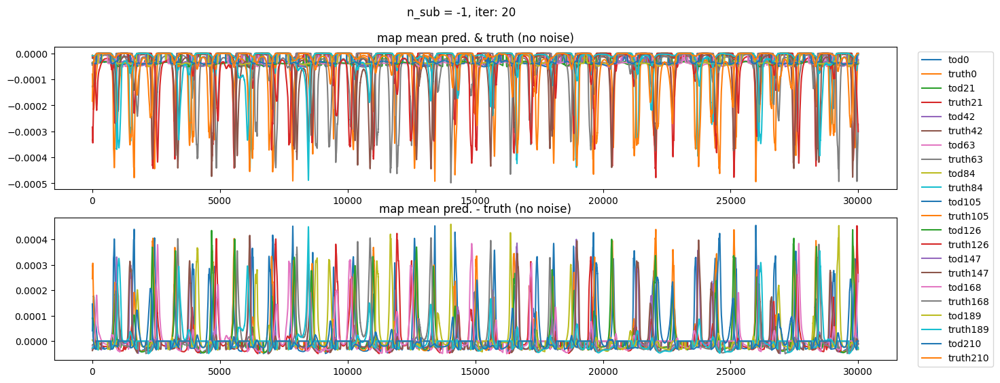

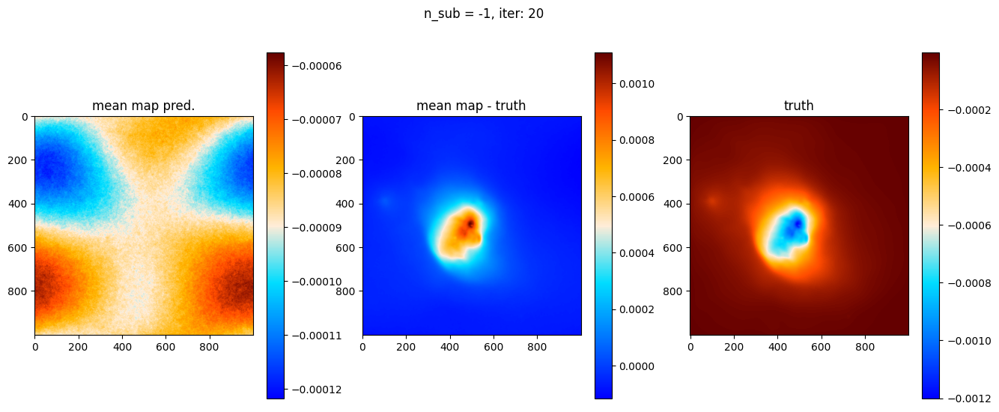

OPTIMIZE_KL: Starting 0021
SL: Iteration 0 ⛰:+1.6334e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0873e+05 Δ⛰:2.1421e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1158e+05 Δ⛰:2.8487e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1158e+05 Δ⛰:1.4374e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1158e+05 Δ⛰:1.0798e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1158e+05 Δ⛰:1.7462e-10 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1158e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.6785e+04 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7833e+05 Δ⛰:4.4155e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1100e+05 Δ⛰:3.2664e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1100e+05 Δ⛰:2.0473e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1100e+05 Δ⛰:3.6496e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1100e+05 Δ⛰:-5.8208e-11 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1100e+05 Δ⛰:1.1642e-10 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.6529e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4257e+05 Δ⛰:7.0786e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1000e+05 Δ⛰:6.7426e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.10

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015353811558179908, 0.0015, 0.0001
	loglogvarslope: -0.7158683801647943, -2.45, 0.1
	zeromode std (LogNormal): 1.3917779450569696e-07, 1e-05, 9.9e-06
map:
	fluctuations: 5.6010183244665624e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.506105969540113, -2.5, 0.1
	zeromode std (LogNormal): 9.950424473288149e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+3.7995e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.1037e+05 Δ⛰:3.8505e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1064e+05 Δ⛰:2.7056e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1064e+05 Δ⛰:3.3100e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1064e+05 Δ⛰:1.3082e-06 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1064e+05 Δ⛰:5.2387e-10 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1064e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.8864e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8575e+05 Δ⛰:2.3722e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0949e+05 Δ⛰:2.3735e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0949e+05 Δ⛰:2.8854e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0949e+05 Δ⛰:1.9057e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0949e+05 Δ⛰:4.6566e-10 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0949e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.1032e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5350e+05 Δ⛰:2.5567e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0979e+05 Δ⛰:5.6285e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0979e+05 Δ⛰:2.7648e-03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015391957687809995, 0.0015, 0.0001
	loglogvarslope: -0.6031758210311342, -2.45, 0.1
	zeromode std (LogNormal): 9.496371663283333e-08, 1e-05, 9.9e-06
map:
	fluctuations: 5.600867200057467e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.5056081588308214, -2.5, 0.1
	zeromode std (LogNormal): 9.950343993544922e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.0893e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8024e+05 Δ⛰:1.1373e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1031e+05 Δ⛰:3.0073e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1031e+05 Δ⛰:4.7093e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1031e+05 Δ⛰:1.0987e-06 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1031e+05 Δ⛰:9.3132e-10 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1031e+05 Δ⛰:1.1642e-10 ➽:1.0201e+01
SL: Iteration 0 ⛰:-9.1551e+04 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0091e+05 Δ⛰:4.0936e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1006e+05 Δ⛰:9.1550e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1006e+05 Δ⛰:5.6536e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1006e+05 Δ⛰:5.2387e-10 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1006e+05 Δ⛰:1.1642e-09 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1006e+05 Δ⛰:4.0745e-10 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.3420e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0346e+05 Δ⛰:2.8454e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0973e+05 Δ⛰:6.2729e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0973e+05 Δ⛰:6.2599e-03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015433372333293698, 0.0015, 0.0001
	loglogvarslope: -0.48902376933359415, -2.45, 0.1
	zeromode std (LogNormal): 6.277493851163051e-08, 1e-05, 9.9e-06
map:
	fluctuations: 5.600802684109955e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.505138971324035, -2.5, 0.1
	zeromode std (LogNormal): 9.953781400488944e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.3772e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7897e+05 Δ⛰:1.4251e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1057e+05 Δ⛰:3.1602e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1057e+05 Δ⛰:4.9704e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1057e+05 Δ⛰:1.3708e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1057e+05 Δ⛰:1.8044e-09 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1057e+05 Δ⛰:3.4925e-10 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.5088e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0628e+05 Δ⛰:3.0150e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0982e+05 Δ⛰:3.5395e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0982e+05 Δ⛰:4.4015e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0982e+05 Δ⛰:4.6100e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0982e+05 Δ⛰:2.3283e-09 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0982e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+5.6292e+03 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0820e+05 Δ⛰:5.1383e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1153e+05 Δ⛰:3.3269e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1153e+05 Δ⛰:4.2373e-03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015477312061913146, 0.0015, 0.0001
	loglogvarslope: -0.3733681687281032, -2.45, 0.1
	zeromode std (LogNormal): 4.0511731432260146e-08, 1e-05, 9.9e-06
map:
	fluctuations: 5.6007584059154306e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.504429391037945, -2.5, 0.1
	zeromode std (LogNormal): 9.950355282492427e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-4.5541e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0682e+05 Δ⛰:5.1410e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0939e+05 Δ⛰:2.5686e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0939e+05 Δ⛰:8.0330e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0939e+05 Δ⛰:5.8208e-10 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0939e+05 Δ⛰:2.6776e-09 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0939e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-8.7393e+04 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2323e+05 Δ⛰:3.3584e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1000e+05 Δ⛰:8.6770e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1000e+05 Δ⛰:6.3018e-03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1000e+05 Δ⛰:5.4133e-09 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1000e+05 Δ⛰:5.0059e-09 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1000e+05 Δ⛰:5.8208e-10 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.4233e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.1070e+05 Δ⛰:4.9340e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1070e+05 Δ⛰:7.8070e-01 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1070e+05 Δ⛰:1.0291e-02 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015523190100319463, 0.0015, 0.0001
	loglogvarslope: -0.2562902068213324, -2.45, 0.1
	zeromode std (LogNormal): 2.5677924274897286e-08, 1e-05, 9.9e-06
map:
	fluctuations: 5.600711223945354e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.503923313580542, -2.5, 0.1
	zeromode std (LogNormal): 9.952260764396155e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+3.7908e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0960e+05 Δ⛰:4.3004e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0999e+05 Δ⛰:3.8622e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0999e+05 Δ⛰:1.5888e-02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0999e+05 Δ⛰:1.1601e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0999e+05 Δ⛰:2.3574e-08 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0999e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.5454e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0949e+05 Δ⛰:4.0549e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1017e+05 Δ⛰:6.7576e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1017e+05 Δ⛰:1.5805e-02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1017e+05 Δ⛰:2.7328e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1017e+05 Δ⛰:1.7404e-08 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1017e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.8068e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9313e+05 Δ⛰:2.2999e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0967e+05 Δ⛰:1.6543e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0967e+05 Δ⛰:8.4063e-03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015570574104844513, 0.0015, 0.0001
	loglogvarslope: -0.1378684412159199, -2.45, 0.1
	zeromode std (LogNormal): 1.6056545437194762e-08, 1e-05, 9.9e-06
map:
	fluctuations: 5.600799587672064e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.5052063217301503, -2.5, 0.1
	zeromode std (LogNormal): 9.950308612543298e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-1.7902e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0722e+05 Δ⛰:3.2819e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1040e+05 Δ⛰:3.1803e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1040e+05 Δ⛰:2.5581e-02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1040e+05 Δ⛰:2.4971e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1040e+05 Δ⛰:8.5274e-08 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1040e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.5496e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0792e+05 Δ⛰:5.0576e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0945e+05 Δ⛰:1.5218e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0945e+05 Δ⛰:2.2150e-02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0945e+05 Δ⛰:5.7218e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0945e+05 Δ⛰:5.8149e-08 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0945e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:-1.2091e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0775e+05 Δ⛰:3.8684e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1063e+05 Δ⛰:2.8788e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1063e+05 Δ⛰:1.5746e-02 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015619155851832023, 0.0015, 0.0001
	loglogvarslope: -0.01810719778478287, -2.45, 0.1
	zeromode std (LogNormal): 9.936495895345107e-09, 1e-05, 9.9e-06
map:
	fluctuations: 5.6011254657968794e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.507033032521294, -2.5, 0.1
	zeromode std (LogNormal): 9.950717650531607e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-4.2070e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9880e+05 Δ⛰:7.8106e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1053e+05 Δ⛰:1.1729e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1053e+05 Δ⛰:4.1435e-02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1053e+05 Δ⛰:1.7753e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1053e+05 Δ⛰:3.0489e-07 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1053e+05 Δ⛰:1.1642e-10 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.0163e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0449e+05 Δ⛰:1.5208e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1025e+05 Δ⛰:5.7612e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1025e+05 Δ⛰:3.1772e-02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1025e+05 Δ⛰:4.0745e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1025e+05 Δ⛰:1.7579e-07 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1025e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-2.2466e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9661e+05 Δ⛰:2.7195e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1034e+05 Δ⛰:1.3729e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1034e+05 Δ⛰:4.7632e-02 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015668717961680333, 0.0015, 0.0001
	loglogvarslope: 0.1030741058494602, -2.45, 0.1
	zeromode std (LogNormal): 6.099249093879745e-09, 1e-05, 9.9e-06
map:
	fluctuations: 5.601959704956888e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.509712151780187, -2.5, 0.1
	zeromode std (LogNormal): 9.95039009486315e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+2.6426e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0945e+05 Δ⛰:3.1520e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0963e+05 Δ⛰:1.7546e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0963e+05 Δ⛰:6.2776e-02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0963e+05 Δ⛰:2.9104e-10 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0963e+05 Δ⛰:5.6758e-07 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0963e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.8889e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9895e+05 Δ⛰:7.3878e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1023e+05 Δ⛰:1.1280e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1023e+05 Δ⛰:5.2984e-02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1023e+05 Δ⛰:1.2940e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1023e+05 Δ⛰:5.6630e-07 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1023e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.2423e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9425e+05 Δ⛰:3.7365e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0997e+05 Δ⛰:1.5714e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0997e+05 Δ⛰:4.6230e-02 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001571910533672545, 0.0015, 0.0001
	loglogvarslope: 0.22585741013085148, -2.45, 0.1
	zeromode std (LogNormal): 3.7194233163457777e-09, 1e-05, 9.9e-06
map:
	fluctuations: 5.603697132052925e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.514833248626283, -2.5, 0.1
	zeromode std (LogNormal): 9.95040730280718e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.0545e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.1068e+05 Δ⛰:1.1056e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1109e+05 Δ⛰:4.0433e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1109e+05 Δ⛰:6.7902e-02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1109e+05 Δ⛰:2.5891e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1109e+05 Δ⛰:1.3161e-06 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1109e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.8482e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0421e+05 Δ⛰:3.3525e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1020e+05 Δ⛰:5.9919e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1020e+05 Δ⛰:1.2420e-01 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1020e+05 Δ⛰:9.0222e-09 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1020e+05 Δ⛰:3.0322e-06 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1020e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.1196e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0951e+05 Δ⛰:4.6291e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0965e+05 Δ⛰:1.4602e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0965e+05 Δ⛰:5.2656e-02 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015770206565228863, 0.0015, 0.0001
	loglogvarslope: 0.3505354079531262, -2.45, 0.1
	zeromode std (LogNormal): 2.2559765142737977e-09, 1e-05, 9.9e-06
map:
	fluctuations: 5.6060841728584676e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.5252731536963076, -2.5, 0.1
	zeromode std (LogNormal): 9.950479773038272e-10, 1e-08, 1e-07


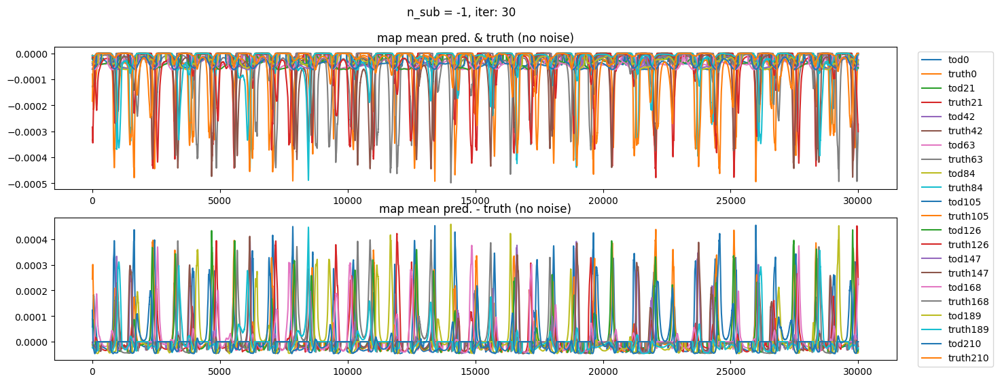

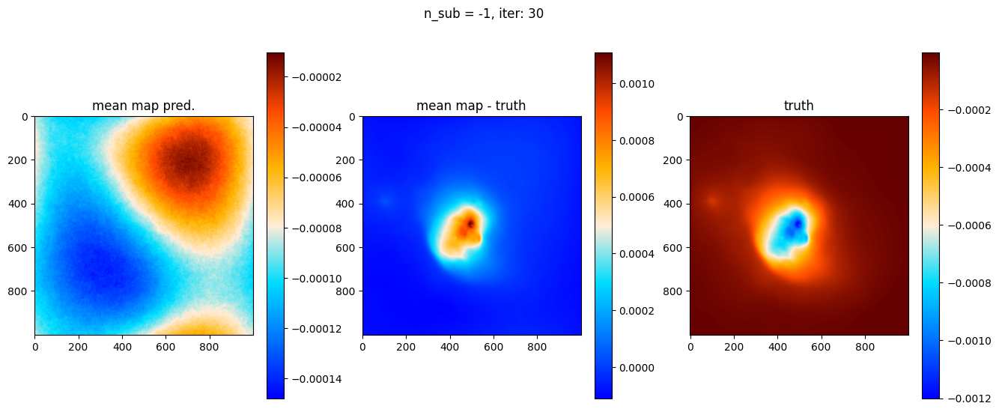

OPTIMIZE_KL: Starting 0031
SL: Iteration 0 ⛰:+1.0087e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.1000e+05 Δ⛰:1.5187e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1034e+05 Δ⛰:3.3431e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1034e+05 Δ⛰:1.3006e-01 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1034e+05 Δ⛰:1.8917e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1034e+05 Δ⛰:5.4826e-06 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1034e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-5.0559e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0972e+05 Δ⛰:4.1258e+03 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0985e+05 Δ⛰:1.3373e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0985e+05 Δ⛰:1.9238e-01 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0985e+05 Δ⛰:8.7311e-10 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0985e+05 Δ⛰:1.1896e-05 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0985e+05 Δ⛰:1.1642e-10 ➽:1.0201e+01
SL: Iteration 0 ⛰:-1.3228e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9837e+05 Δ⛰:3.6609e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1056e+05 Δ⛰:1.2194e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1056

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015821938294165458, 0.0015, 0.0001
	loglogvarslope: 0.47754772652541266, -2.45, 0.1
	zeromode std (LogNormal): 1.3621619684780913e-09, 1e-05, 9.9e-06
map:
	fluctuations: 5.6094118969141344e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.5399452516390832, -2.5, 0.1
	zeromode std (LogNormal): 9.951383049275158e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.2902e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7614e+05 Δ⛰:1.3378e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0932e+05 Δ⛰:3.3178e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0932e+05 Δ⛰:1.9574e-01 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0932e+05 Δ⛰:8.4424e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0932e+05 Δ⛰:2.2346e-05 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0932e+05 Δ⛰:7.5670e-10 ➽:1.0201e+01
SL: Iteration 0 ⛰:+9.7716e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0923e+05 Δ⛰:1.4864e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1055e+05 Δ⛰:1.3226e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1055e+05 Δ⛰:3.8870e-01 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1055e+05 Δ⛰:5.6229e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1055e+05 Δ⛰:4.7523e-05 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1055e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.1331e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0433e+05 Δ⛰:6.1764e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1080e+05 Δ⛰:6.4696e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1080e+05 Δ⛰:2.5556e-01 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015874235440040845, 0.0015, 0.0001
	loglogvarslope: 0.607508719436491, -2.45, 0.1
	zeromode std (LogNormal): 8.193236497348749e-10, 1e-05, 9.9e-06
map:
	fluctuations: 5.614594499583108e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.554852180236491, -2.5, 0.1
	zeromode std (LogNormal): 9.950824259806178e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-4.2551e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0834e+05 Δ⛰:8.2830e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1033e+05 Δ⛰:1.9906e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1033e+05 Δ⛰:3.1046e-01 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1033e+05 Δ⛰:4.6566e-10 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1033e+05 Δ⛰:3.1039e-05 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1033e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.1334e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0020e+05 Δ⛰:2.6336e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0964e+05 Δ⛰:9.4430e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0964e+05 Δ⛰:3.0563e-01 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0964e+05 Δ⛰:3.2305e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0964e+05 Δ⛰:3.3815e-05 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0964e+05 Δ⛰:1.7462e-10 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.8721e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9367e+05 Δ⛰:6.4623e+03 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1087e+05 Δ⛰:1.7200e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1087e+05 Δ⛰:4.5289e-01 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001592703700271997, 0.0015, 0.0001
	loglogvarslope: 0.7412931673661993, -2.45, 0.1
	zeromode std (LogNormal): 4.912358512132364e-10, 1e-05, 9.9e-06
map:
	fluctuations: 5.6190966420714534e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.5707280775421597, -2.5, 0.1
	zeromode std (LogNormal): 9.95038044092896e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+2.1701e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0953e+05 Δ⛰:2.6797e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1072e+05 Δ⛰:1.1904e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1072e+05 Δ⛰:5.3194e-01 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1072e+05 Δ⛰:4.9523e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1072e+05 Δ⛰:5.4953e-05 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1072e+05 Δ⛰:0.0000e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+8.3349e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3659e+05 Δ⛰:1.2701e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0947e+05 Δ⛰:7.2884e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0947e+05 Δ⛰:7.0728e-01 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0947e+05 Δ⛰:1.1263e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0947e+05 Δ⛰:1.9264e-04 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0947e+05 Δ⛰:5.8208e-11 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.0457e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0917e+05 Δ⛰:1.5549e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0941e+05 Δ⛰:2.4346e+02 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0941e+05 Δ⛰:6.4941e-01 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0015980261646983925, 0.0015, 0.0001
	loglogvarslope: 0.8800902345512265, -2.45, 0.1
	zeromode std (LogNormal): 2.9382456270126347e-10, 1e-05, 9.9e-06
map:
	fluctuations: 5.619267912724786e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.57562848432013, -2.5, 0.1
	zeromode std (LogNormal): 9.938521704353123e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-2.2886e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9275e+05 Δ⛰:2.6389e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1025e+05 Δ⛰:1.7498e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1025e+05 Δ⛰:1.4245e+00 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1025e+05 Δ⛰:4.5518e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1025e+05 Δ⛰:1.7889e-03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1025e+05 Δ⛰:4.0745e-10 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.9728e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0477e+05 Δ⛰:3.4776e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1068e+05 Δ⛰:5.9033e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1068e+05 Δ⛰:9.3877e-01 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1068e+05 Δ⛰:7.8406e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1068e+05 Δ⛰:6.3937e-04 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1068e+05 Δ⛰:4.6566e-10 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.1554e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.8378e+05 Δ⛰:1.5391e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0991e+05 Δ⛰:1.2613e+05 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0991e+05 Δ⛰:1.2135e+00 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001603374910778974, 0.0015, 0.0001
	loglogvarslope: 1.0253885501677389, -2.45, 0.1
	zeromode std (LogNormal): 1.756029645547361e-10, 1e-05, 9.9e-06
map:
	fluctuations: 5.6169478398509985e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.5695727815462073, -2.5, 0.1
	zeromode std (LogNormal): 9.951243313714634e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.2255e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0789e+05 Δ⛰:1.7334e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1111e+05 Δ⛰:3.2279e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1112e+05 Δ⛰:2.1086e+00 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1112e+05 Δ⛰:6.5833e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1112e+05 Δ⛰:4.5608e-03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1112e+05 Δ⛰:1.8044e-09 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.0982e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8376e+05 Δ⛰:2.1466e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1161e+05 Δ⛰:2.7850e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1161e+05 Δ⛰:1.5471e+00 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1161e+05 Δ⛰:5.9931e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1161e+05 Δ⛰:1.2467e-03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1161e+05 Δ⛰:1.7462e-10 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.0006e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8561e+05 Δ⛰:1.4862e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1082e+05 Δ⛰:2.5206e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1082e+05 Δ⛰:1.6538e+00 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016087101745447952, 0.0015, 0.0001
	loglogvarslope: 1.1785308425320502, -2.45, 0.1
	zeromode std (LogNormal): 1.052641945195965e-10, 1e-05, 9.9e-06
map:
	fluctuations: 5.659332924511912e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.71485965881626, -2.5, 0.1
	zeromode std (LogNormal): 9.895736273562956e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+6.6585e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.9828e+05 Δ⛰:7.1568e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1059e+05 Δ⛰:1.2310e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1059e+05 Δ⛰:2.7865e+00 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.1059e+05 Δ⛰:1.4104e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.1059e+05 Δ⛰:9.4809e-03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.1059e+05 Δ⛰:2.3865e-09 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.5837e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0226e+05 Δ⛰:3.0859e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0987e+05 Δ⛰:7.6165e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0988e+05 Δ⛰:2.7163e+00 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0988e+05 Δ⛰:1.5314e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0988e+05 Δ⛰:4.5917e-03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0988e+05 Δ⛰:8.7311e-09 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.6590e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0587e+05 Δ⛰:3.1649e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.1053e+05 Δ⛰:4.6643e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.1053e+05 Δ⛰:2.5993e+00 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016139267816508184, 0.0015, 0.0001
	loglogvarslope: 1.3387306672524, -2.45, 0.1
	zeromode std (LogNormal): 6.392699202624894e-11, 1e-05, 9.9e-06
map:
	fluctuations: 6.118025893715058e-05, 5.6e-05, 1e-06
	loglogvarslope: -3.8025918036518895, -2.5, 0.1
	zeromode std (LogNormal): 9.914294020841187e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-4.3321e+04 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0301e+05 Δ⛰:4.5969e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0966e+05 Δ⛰:6.6450e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0966e+05 Δ⛰:2.5026e+00 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0966e+05 Δ⛰:1.3335e-07 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0966e+05 Δ⛰:1.8175e-01 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0966e+05 Δ⛰:4.5674e-04 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.5097e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-5.0520e+05 Δ⛰:7.0149e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0996e+05 Δ⛰:4.7573e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0996e+05 Δ⛰:2.2991e+00 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0996e+05 Δ⛰:8.9931e-08 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0996e+05 Δ⛰:6.1087e-02 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0996e+05 Δ⛰:9.7075e-06 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.8416e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7416e+05 Δ⛰:7.3157e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-5.0974e+05 Δ⛰:3.5582e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-5.0975e+05 Δ⛰:4.0927e+00 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016275959939693327, 0.0015, 0.0001
	loglogvarslope: 2.046620044702135, -2.45, 0.1
	zeromode std (LogNormal): 1.7435497471566072e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0018011103422237989, 5.6e-05, 1e-06
	loglogvarslope: -2.4996976727565987, -2.5, 0.1
	zeromode std (LogNormal): 9.959414222988938e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+7.9906e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7546e+05 Δ⛰:1.2745e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.9571e+05 Δ⛰:2.0244e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.9723e+05 Δ⛰:1.5250e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9906e+05 Δ⛰:1.8247e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9996e+05 Δ⛰:9.0374e+02 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9998e+05 Δ⛰:2.1801e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-5.0162e+05 Δ⛰:1.6349e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-5.0282e+05 Δ⛰:1.1989e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-5.0465e+05 Δ⛰:1.8296e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0465e+05 Δ⛰:6.1048e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+7.6943e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6825e+05 Δ⛰:8.1626e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.9658e+05 Δ⛰:2.8333e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.9913e+05 Δ⛰:2.5453e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-5.0021e+05 Δ⛰:1.0830e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-5.0149e+05 Δ⛰:1.2815e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-5.0167e+05 Δ⛰:1.7945e+02 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016277530832447165, 0.0015, 0.0001
	loglogvarslope: 2.074709376406078, -2.45, 0.1
	zeromode std (LogNormal): 1.717819196546302e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0023345003549865755, 5.6e-05, 1e-06
	loglogvarslope: -2.2937923574977357, -2.5, 0.1
	zeromode std (LogNormal): 9.939243750753154e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.5341e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7580e+05 Δ⛰:1.5816e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8819e+05 Δ⛰:1.2381e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8891e+05 Δ⛰:7.2495e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9086e+05 Δ⛰:1.9514e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9257e+05 Δ⛰:1.7064e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9260e+05 Δ⛰:2.8820e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9596e+05 Δ⛰:3.3618e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-5.0002e+05 Δ⛰:4.0613e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-5.0222e+05 Δ⛰:2.2036e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0223e+05 Δ⛰:2.9902e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+9.6671e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5757e+05 Δ⛰:1.0125e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8712e+05 Δ⛰:2.9553e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.9031e+05 Δ⛰:3.1821e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9128e+05 Δ⛰:9.6859e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9492e+05 Δ⛰:3.6459e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9517e+05 Δ⛰:2.4507e+02 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016277782863207575, 0.0015, 0.0001
	loglogvarslope: 2.0684691837293423, -2.45, 0.1
	zeromode std (LogNormal): 1.713726764779126e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0024563106678962767, 5.6e-05, 1e-06
	loglogvarslope: -2.4031146729141537, -2.5, 0.1
	zeromode std (LogNormal): 9.382177871146343e-10, 1e-08, 1e-07


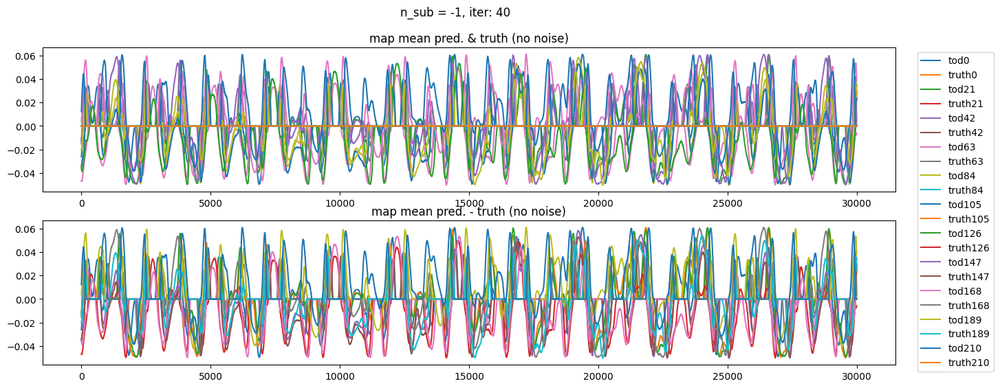

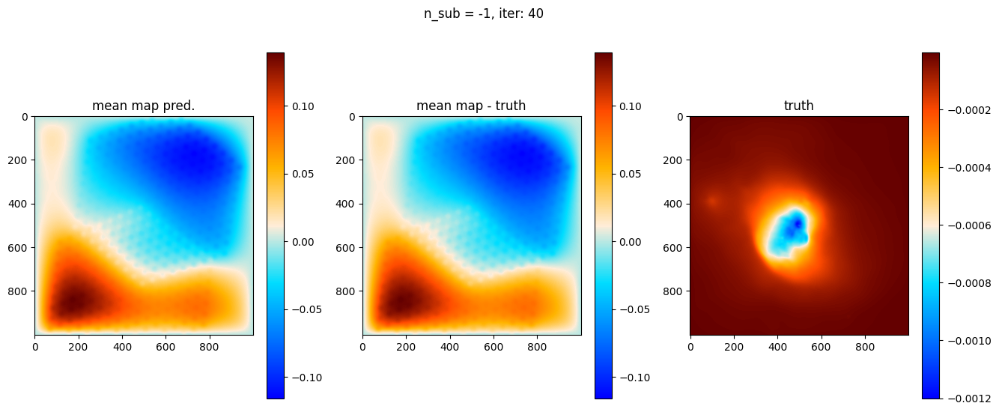

OPTIMIZE_KL: Starting 0041
SL: Iteration 0 ⛰:+1.8780e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6816e+05 Δ⛰:2.3462e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8627e+05 Δ⛰:1.8109e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8662e+05 Δ⛰:3.5040e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8903e+05 Δ⛰:2.4085e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9131e+05 Δ⛰:2.2821e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9132e+05 Δ⛰:5.4788e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.3616e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7004e+05 Δ⛰:1.4086e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8778e+05 Δ⛰:1.7741e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8806e+05 Δ⛰:2.7890e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9003e+05 Δ⛰:1.9760e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9167e+05 Δ⛰:1.6332e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9167e+05 Δ⛰:4.1323e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.6643e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7924e+05 Δ⛰:1.2814e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8316e+05 Δ⛰:3.9158e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8589

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016277709353215777, 0.0015, 0.0001
	loglogvarslope: 2.0653129212304684, -2.45, 0.1
	zeromode std (LogNormal): 1.7149193935911817e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0024801580070070365, 5.6e-05, 1e-06
	loglogvarslope: -2.6098779264116163, -2.5, 0.1
	zeromode std (LogNormal): 9.611780497601404e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-1.4137e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.1026e+05 Δ⛰:2.6889e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8547e+05 Δ⛰:7.5216e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8953e+05 Δ⛰:4.0550e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9258e+05 Δ⛰:3.0479e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9424e+05 Δ⛰:1.6669e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9424e+05 Δ⛰:6.5700e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.2715e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6446e+05 Δ⛰:1.3180e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8875e+05 Δ⛰:2.4292e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.9021e+05 Δ⛰:1.4597e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9335e+05 Δ⛰:3.1437e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9416e+05 Δ⛰:8.0553e+02 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9416e+05 Δ⛰:1.6027e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.4508e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8777e+05 Δ⛰:4.2688e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8990e+05 Δ⛰:2.1317e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.9171e+05 Δ⛰:1.8116e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016278437479893262, 0.0015, 0.0001
	loglogvarslope: 2.085229567828997, -2.45, 0.1
	zeromode std (LogNormal): 1.7031429967226396e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0024743282797382313, 5.6e-05, 1e-06
	loglogvarslope: -2.610153746003413, -2.5, 0.1
	zeromode std (LogNormal): 9.611423064757896e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.6837e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7642e+05 Δ⛰:1.7314e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.9085e+05 Δ⛰:1.4435e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.9185e+05 Δ⛰:1.0038e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9351e+05 Δ⛰:1.6563e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9535e+05 Δ⛰:1.8378e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9535e+05 Δ⛰:7.0943e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.6626e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6865e+05 Δ⛰:2.3855e+03 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8704e+05 Δ⛰:1.8389e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8842e+05 Δ⛰:1.3781e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9152e+05 Δ⛰:3.1020e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9298e+05 Δ⛰:1.4651e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9511e+05 Δ⛰:2.1296e+03 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9527e+05 Δ⛰:1.6082e+02 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9716e+05 Δ⛰:1.8895e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9954e+05 Δ⛰:2.3771e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0081e+05 Δ⛰:1.2699e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016278259585794474, 0.0015, 0.0001
	loglogvarslope: 2.0793661078316417, -2.45, 0.1
	zeromode std (LogNormal): 1.7060126415758714e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002512341040315387, 5.6e-05, 1e-06
	loglogvarslope: -2.601831037206073, -2.5, 0.1
	zeromode std (LogNormal): 9.61028944486346e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-4.8884e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8925e+05 Δ⛰:4.0987e+02 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.9121e+05 Δ⛰:1.9626e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.9250e+05 Δ⛰:1.2890e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9369e+05 Δ⛰:1.1886e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9504e+05 Δ⛰:1.3519e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9522e+05 Δ⛰:1.7486e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9706e+05 Δ⛰:1.8454e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9907e+05 Δ⛰:2.0136e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-5.0136e+05 Δ⛰:2.2882e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0255e+05 Δ⛰:1.1912e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0256e+05 Δ⛰:3.8248e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+7.0066e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8815e+05 Δ⛰:1.1888e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.9159e+05 Δ⛰:3.4340e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.9367e+05 Δ⛰:2.0840e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9387e+05 Δ⛰:2.0266e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9560e+05 Δ⛰:1.7311e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016278860998124888, 0.0015, 0.0001
	loglogvarslope: 2.0948850758028605, -2.45, 0.1
	zeromode std (LogNormal): 1.6963306762624033e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0025500695190540266, 5.6e-05, 1e-06
	loglogvarslope: -2.58243998154077, -2.5, 0.1
	zeromode std (LogNormal): 9.636539018421015e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.5757e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8453e+05 Δ⛰:2.0602e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8912e+05 Δ⛰:4.5894e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8968e+05 Δ⛰:5.5343e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9111e+05 Δ⛰:1.4317e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9290e+05 Δ⛰:1.7963e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9290e+05 Δ⛰:5.7403e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:-2.8635e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6007e+05 Δ⛰:1.7373e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8586e+05 Δ⛰:2.5792e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8850e+05 Δ⛰:2.6382e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9099e+05 Δ⛰:2.4851e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9320e+05 Δ⛰:2.2163e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9320e+05 Δ⛰:1.0688e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.9153e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4083e+05 Δ⛰:9.3236e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8369e+05 Δ⛰:4.2858e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8623e+05 Δ⛰:2.5397e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279001202791578, 0.0015, 0.0001
	loglogvarslope: 2.098630890404076, -2.45, 0.1
	zeromode std (LogNormal): 1.6940815231119055e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0026453129690740557, 5.6e-05, 1e-06
	loglogvarslope: -2.6442951985626175, -2.5, 0.1
	zeromode std (LogNormal): 1.008604846190815e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+3.7861e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3354e+05 Δ⛰:4.2197e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8099e+05 Δ⛰:4.7445e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8416e+05 Δ⛰:3.1755e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9021e+05 Δ⛰:6.0448e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9220e+05 Δ⛰:1.9965e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9221e+05 Δ⛰:2.9458e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-1.8912e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5583e+05 Δ⛰:2.6671e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8554e+05 Δ⛰:2.9716e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8699e+05 Δ⛰:1.4522e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9303e+05 Δ⛰:6.0325e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9440e+05 Δ⛰:1.3760e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9440e+05 Δ⛰:6.7225e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+7.5974e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5771e+05 Δ⛰:1.2175e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8386e+05 Δ⛰:2.6157e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8621e+05 Δ⛰:2.3482e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016278774790150455, 0.0015, 0.0001
	loglogvarslope: 2.0921320621396315, -2.45, 0.1
	zeromode std (LogNormal): 1.6977151121068357e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002667456273036369, 5.6e-05, 1e-06
	loglogvarslope: -2.638576439858007, -2.5, 0.1
	zeromode std (LogNormal): 1.007887486234092e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-3.3995e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.4266e+05 Δ⛰:2.7167e+03 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8725e+05 Δ⛰:1.4459e+05 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8967e+05 Δ⛰:2.4208e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9279e+05 Δ⛰:3.1135e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9409e+05 Δ⛰:1.3050e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9450e+05 Δ⛰:4.0999e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9603e+05 Δ⛰:1.5289e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9830e+05 Δ⛰:2.2729e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9977e+05 Δ⛰:1.4651e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0254e+05 Δ⛰:2.7683e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0258e+05 Δ⛰:4.5515e+01 ➽:1.0201e+01
SL: Iteration 12 ⛰:-5.0362e+05 Δ⛰:1.0367e+03 ➽:1.0201e+01
SL: Iteration 13 ⛰:-5.0483e+05 Δ⛰:1.2131e+03 ➽:1.0201e+01
SL: Iteration 14 ⛰:-5.0630e+05 Δ⛰:1.4624e+03 ➽:1.0201e+01
SL: Iteration 15 ⛰:-5.0666e+05 Δ⛰:3.6691e+02 ➽:1.0201e+01
SL: Iteration 16 ⛰:-5.0669e+05 Δ⛰:2.4045e+01 ➽:1.0201e+01
SL: Iteration 17 ⛰:-5.0730e+05 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279166758549567, 0.0015, 0.0001
	loglogvarslope: 2.1010201282377237, -2.45, 0.1
	zeromode std (LogNormal): 1.691429552556812e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002695192881171503, 5.6e-05, 1e-06
	loglogvarslope: -2.612225069122261, -2.5, 0.1
	zeromode std (LogNormal): 1.0062673263347918e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-3.2547e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8114e+05 Δ⛰:1.5567e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8669e+05 Δ⛰:5.5473e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8823e+05 Δ⛰:1.5496e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9029e+05 Δ⛰:2.0511e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9180e+05 Δ⛰:1.5099e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9191e+05 Δ⛰:1.1024e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9462e+05 Δ⛰:2.7144e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9650e+05 Δ⛰:1.8768e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9956e+05 Δ⛰:3.0666e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0140e+05 Δ⛰:1.8350e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0140e+05 Δ⛰:3.9797e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.0435e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6031e+05 Δ⛰:1.5038e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8177e+05 Δ⛰:2.1464e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8369e+05 Δ⛰:1.9211e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8741e+05 Δ⛰:3.7203e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9007e+05 Δ⛰:2.6612e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279026182682561, 0.0015, 0.0001
	loglogvarslope: 2.096444648668177, -2.45, 0.1
	zeromode std (LogNormal): 1.6936811124707655e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027143016639589955, 5.6e-05, 1e-06
	loglogvarslope: -2.605954071902676, -2.5, 0.1
	zeromode std (LogNormal): 1.0101534740435796e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-1.6280e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5752e+05 Δ⛰:2.9472e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8668e+05 Δ⛰:2.9163e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8752e+05 Δ⛰:8.3420e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8970e+05 Δ⛰:2.1775e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9075e+05 Δ⛰:1.0579e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9075e+05 Δ⛰:6.7212e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.1460e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6629e+05 Δ⛰:3.6123e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7675e+05 Δ⛰:1.0453e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8695e+05 Δ⛰:1.0206e+04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8763e+05 Δ⛰:6.7707e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8971e+05 Δ⛰:2.0823e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8971e+05 Δ⛰:1.6252e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.8576e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.9685e+05 Δ⛰:3.2544e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8183e+05 Δ⛰:8.4989e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8619e+05 Δ⛰:4.3592e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279168412387007, 0.0015, 0.0001
	loglogvarslope: 2.1016680148366573, -2.45, 0.1
	zeromode std (LogNormal): 1.6914030815060477e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0026947202300599818, 5.6e-05, 1e-06
	loglogvarslope: -2.619594571963474, -2.5, 0.1
	zeromode std (LogNormal): 1.009589201770744e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+3.5001e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.0635e+05 Δ⛰:3.9064e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8685e+05 Δ⛰:8.0494e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8815e+05 Δ⛰:1.3061e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9198e+05 Δ⛰:3.8250e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9386e+05 Δ⛰:1.8772e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9386e+05 Δ⛰:1.5090e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.7949e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.9693e+05 Δ⛰:1.7439e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8186e+05 Δ⛰:8.4926e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8749e+05 Δ⛰:5.6309e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9168e+05 Δ⛰:4.1938e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9352e+05 Δ⛰:1.8373e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9545e+05 Δ⛰:1.9246e+03 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9571e+05 Δ⛰:2.6544e+02 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9785e+05 Δ⛰:2.1433e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-5.0026e+05 Δ⛰:2.4023e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0171e+05 Δ⛰:1.4560e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279037528999782, 0.0015, 0.0001
	loglogvarslope: 2.0973767781944623, -2.45, 0.1
	zeromode std (LogNormal): 1.6934992701902842e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002711229354377725, 5.6e-05, 1e-06
	loglogvarslope: -2.612045345722025, -2.5, 0.1
	zeromode std (LogNormal): 1.0095148393390072e-09, 1e-08, 1e-07


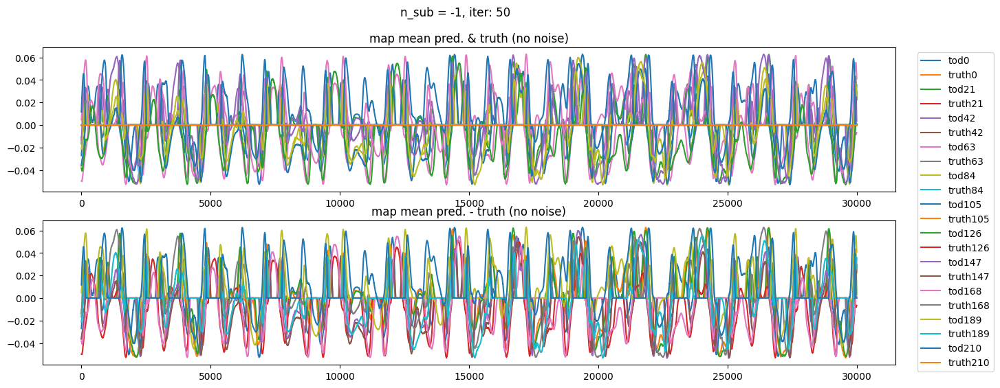

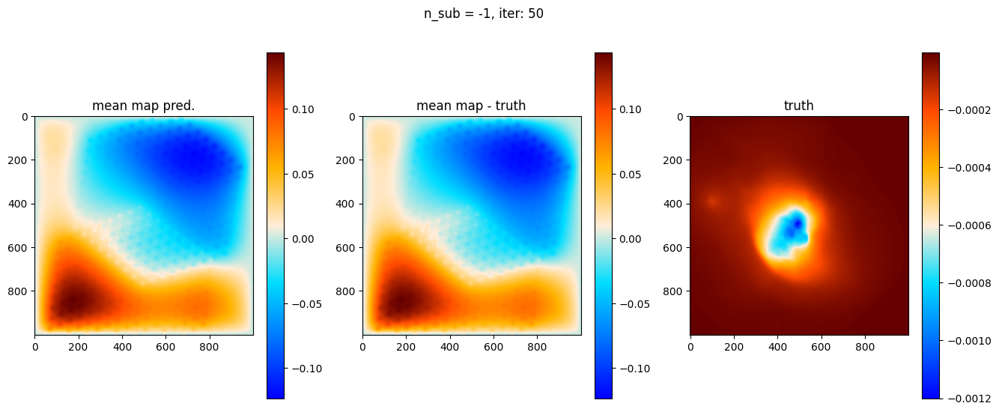

OPTIMIZE_KL: Starting 0051
SL: Iteration 0 ⛰:+2.4404e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6083e+05 Δ⛰:7.0487e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8776e+05 Δ⛰:2.6932e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8905e+05 Δ⛰:1.2862e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9079e+05 Δ⛰:1.7451e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9181e+05 Δ⛰:1.0161e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9181e+05 Δ⛰:6.3885e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.7901e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7153e+05 Δ⛰:2.2617e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8483e+05 Δ⛰:1.3298e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8700e+05 Δ⛰:2.1718e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8923e+05 Δ⛰:2.2325e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9111e+05 Δ⛰:1.8836e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9111e+05 Δ⛰:1.2913e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.7528e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7367e+05 Δ⛰:4.2265e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8842e+05 Δ⛰:1.4750e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8893

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627906229894871, 0.0015, 0.0001
	loglogvarslope: 2.09708651728963, -2.45, 0.1
	zeromode std (LogNormal): 1.693102362476685e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028052170100784962, 5.6e-05, 1e-06
	loglogvarslope: -2.5577240097898803, -2.5, 0.1
	zeromode std (LogNormal): 9.89524014163954e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.2499e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.8095e+05 Δ⛰:1.6309e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7864e+05 Δ⛰:9.7695e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8181e+05 Δ⛰:3.1726e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8592e+05 Δ⛰:4.1022e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8782e+05 Δ⛰:1.9052e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8782e+05 Δ⛰:1.4468e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.8924e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5182e+05 Δ⛰:1.9376e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8098e+05 Δ⛰:2.9159e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8347e+05 Δ⛰:2.4899e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8700e+05 Δ⛰:3.5299e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8910e+05 Δ⛰:2.0975e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8910e+05 Δ⛰:1.1577e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.2739e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7852e+05 Δ⛰:8.0591e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8170e+05 Δ⛰:3.1777e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8525e+05 Δ⛰:3.5568e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.00162791872353066, 0.0015, 0.0001
	loglogvarslope: 2.1017269295374357, -2.45, 0.1
	zeromode std (LogNormal): 1.6911018349856918e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027858581254962276, 5.6e-05, 1e-06
	loglogvarslope: -2.569128966799147, -2.5, 0.1
	zeromode std (LogNormal): 9.919228542787955e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.0989e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8191e+05 Δ⛰:1.5808e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8295e+05 Δ⛰:1.0400e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8512e+05 Δ⛰:2.1679e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8685e+05 Δ⛰:1.7328e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8835e+05 Δ⛰:1.5030e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8835e+05 Δ⛰:8.5208e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+5.4502e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6970e+05 Δ⛰:5.9199e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8414e+05 Δ⛰:1.4446e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8491e+05 Δ⛰:7.6558e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8889e+05 Δ⛰:3.9818e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9056e+05 Δ⛰:1.6745e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9057e+05 Δ⛰:5.2930e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.1230e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2382e+05 Δ⛰:1.1654e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7858e+05 Δ⛰:5.4762e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8210e+05 Δ⛰:3.5172e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279225509981971, 0.0015, 0.0001
	loglogvarslope: 2.102573381651056, -2.45, 0.1
	zeromode std (LogNormal): 1.6904894430472764e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002775183381963655, 5.6e-05, 1e-06
	loglogvarslope: -2.5895767359826793, -2.5, 0.1
	zeromode std (LogNormal): 1.0499138596424414e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-2.6151e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6846e+05 Δ⛰:2.0695e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8004e+05 Δ⛰:1.1571e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8247e+05 Δ⛰:2.4355e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8786e+05 Δ⛰:5.3861e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9066e+05 Δ⛰:2.8034e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9107e+05 Δ⛰:4.0724e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9355e+05 Δ⛰:2.4809e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9550e+05 Δ⛰:1.9479e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9810e+05 Δ⛰:2.6063e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0028e+05 Δ⛰:2.1804e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0029e+05 Δ⛰:3.0162e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.8996e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6529e+05 Δ⛰:1.9461e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8637e+05 Δ⛰:2.1083e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8740e+05 Δ⛰:1.0314e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8938e+05 Δ⛰:1.9755e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9090e+05 Δ⛰:1.5209e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279090544235443, 0.0015, 0.0001
	loglogvarslope: 2.0988352412679, -2.45, 0.1
	zeromode std (LogNormal): 1.692649880383065e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002781633715420173, 5.6e-05, 1e-06
	loglogvarslope: -2.5900953705192262, -2.5, 0.1
	zeromode std (LogNormal): 1.0504829671320352e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-2.9394e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6813e+05 Δ⛰:1.7419e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8509e+05 Δ⛰:1.6958e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8598e+05 Δ⛰:8.9335e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8928e+05 Δ⛰:3.3023e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9057e+05 Δ⛰:1.2880e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9065e+05 Δ⛰:7.3008e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9243e+05 Δ⛰:1.7837e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9592e+05 Δ⛰:3.4950e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9761e+05 Δ⛰:1.6858e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9970e+05 Δ⛰:2.0859e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9970e+05 Δ⛰:3.0519e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+5.4573e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7364e+05 Δ⛰:5.9309e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8545e+05 Δ⛰:1.1811e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8804e+05 Δ⛰:2.5877e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8997e+05 Δ⛰:1.9360e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9131e+05 Δ⛰:1.3406e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279081804987622, 0.0015, 0.0001
	loglogvarslope: 2.0986001401331658, -2.45, 0.1
	zeromode std (LogNormal): 1.6927898686098967e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002752137800507649, 5.6e-05, 1e-06
	loglogvarslope: -2.579479105225001, -2.5, 0.1
	zeromode std (LogNormal): 1.0368933258763296e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.2652e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6188e+05 Δ⛰:1.3114e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8394e+05 Δ⛰:2.2054e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8463e+05 Δ⛰:6.8800e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8896e+05 Δ⛰:4.3344e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9084e+05 Δ⛰:1.8796e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9084e+05 Δ⛰:4.8614e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.4255e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.1839e+05 Δ⛰:7.5842e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7707e+05 Δ⛰:5.8681e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8078e+05 Δ⛰:3.7134e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8642e+05 Δ⛰:5.6357e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8892e+05 Δ⛰:2.4992e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8910e+05 Δ⛰:1.7950e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9152e+05 Δ⛰:2.4177e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9489e+05 Δ⛰:3.3724e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9689e+05 Δ⛰:2.0034e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9892e+05 Δ⛰:2.0321e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627928554494944, 0.0015, 0.0001
	loglogvarslope: 2.101672808123693, -2.45, 0.1
	zeromode std (LogNormal): 1.689529338016003e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002782192238747116, 5.6e-05, 1e-06
	loglogvarslope: -2.5498085603803595, -2.5, 0.1
	zeromode std (LogNormal): 1.0515168307224875e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+3.2946e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8116e+05 Δ⛰:3.7758e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8688e+05 Δ⛰:5.7158e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8745e+05 Δ⛰:5.6807e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8947e+05 Δ⛰:2.0170e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9123e+05 Δ⛰:1.7663e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9123e+05 Δ⛰:3.4306e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-1.3433e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7243e+05 Δ⛰:3.3810e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8066e+05 Δ⛰:8.2326e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8253e+05 Δ⛰:1.8729e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8480e+05 Δ⛰:2.2656e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8811e+05 Δ⛰:3.3068e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8811e+05 Δ⛰:5.0841e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.9077e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7306e+05 Δ⛰:5.3808e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8396e+05 Δ⛰:1.0901e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8473e+05 Δ⛰:7.7804e+02 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279217837675876, 0.0015, 0.0001
	loglogvarslope: 2.101159189881388, -2.45, 0.1
	zeromode std (LogNormal): 1.6906121822394765e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027663591962542827, 5.6e-05, 1e-06
	loglogvarslope: -2.5665461442591933, -2.5, 0.1
	zeromode std (LogNormal): 1.0489927553575394e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.7566e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6554e+05 Δ⛰:1.8032e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7937e+05 Δ⛰:1.3837e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8356e+05 Δ⛰:4.1854e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8855e+05 Δ⛰:4.9863e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9028e+05 Δ⛰:1.7321e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9028e+05 Δ⛰:2.9705e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.8704e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.1814e+05 Δ⛰:2.2886e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7965e+05 Δ⛰:6.1511e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8145e+05 Δ⛰:1.8016e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8781e+05 Δ⛰:6.3627e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8926e+05 Δ⛰:1.4516e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8927e+05 Δ⛰:1.4276e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.2981e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5962e+05 Δ⛰:1.3440e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8359e+05 Δ⛰:2.3963e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8617e+05 Δ⛰:2.5844e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627920305369284, 0.0015, 0.0001
	loglogvarslope: 2.1021684950044506, -2.45, 0.1
	zeromode std (LogNormal): 1.6908487157730546e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027462548004272085, 5.6e-05, 1e-06
	loglogvarslope: -2.5819739279736713, -2.5, 0.1
	zeromode std (LogNormal): 1.0482349012016402e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+3.9230e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3883e+05 Δ⛰:4.3618e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8431e+05 Δ⛰:4.5480e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8604e+05 Δ⛰:1.7222e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8912e+05 Δ⛰:3.0848e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9105e+05 Δ⛰:1.9281e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9105e+05 Δ⛰:1.0604e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.1784e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.9037e+05 Δ⛰:1.2175e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8416e+05 Δ⛰:9.3792e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8930e+05 Δ⛰:5.1383e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9026e+05 Δ⛰:9.5959e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9071e+05 Δ⛰:4.5350e+02 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9071e+05 Δ⛰:1.1081e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+9.1414e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5208e+05 Δ⛰:1.3662e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7981e+05 Δ⛰:2.7724e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8791e+05 Δ⛰:8.1001e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279117964204184, 0.0015, 0.0001
	loglogvarslope: 2.0998434485144584, -2.45, 0.1
	zeromode std (LogNormal): 1.6922107365940547e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027406758875838104, 5.6e-05, 1e-06
	loglogvarslope: -2.58563961235727, -2.5, 0.1
	zeromode std (LogNormal): 1.0533036895360552e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-4.5284e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6762e+05 Δ⛰:1.4782e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8204e+05 Δ⛰:1.4422e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8420e+05 Δ⛰:2.1538e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8955e+05 Δ⛰:5.3560e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9093e+05 Δ⛰:1.3797e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9095e+05 Δ⛰:1.3953e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9267e+05 Δ⛰:1.7194e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9638e+05 Δ⛰:3.7126e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9849e+05 Δ⛰:2.1143e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0086e+05 Δ⛰:2.3704e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0086e+05 Δ⛰:9.2588e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+7.4025e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5234e+05 Δ⛰:7.8548e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8364e+05 Δ⛰:3.1296e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8444e+05 Δ⛰:8.0940e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8833e+05 Δ⛰:3.8842e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9179e+05 Δ⛰:3.4626e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279197783112018, 0.0015, 0.0001
	loglogvarslope: 2.0995124580255817, -2.45, 0.1
	zeromode std (LogNormal): 1.6909330495058602e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027723547911762455, 5.6e-05, 1e-06
	loglogvarslope: -2.555048795965781, -2.5, 0.1
	zeromode std (LogNormal): 1.0525834981283295e-09, 1e-08, 1e-07


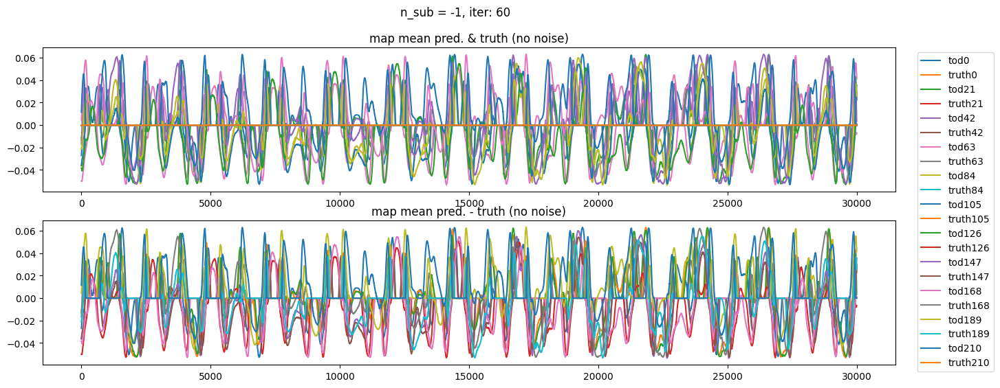

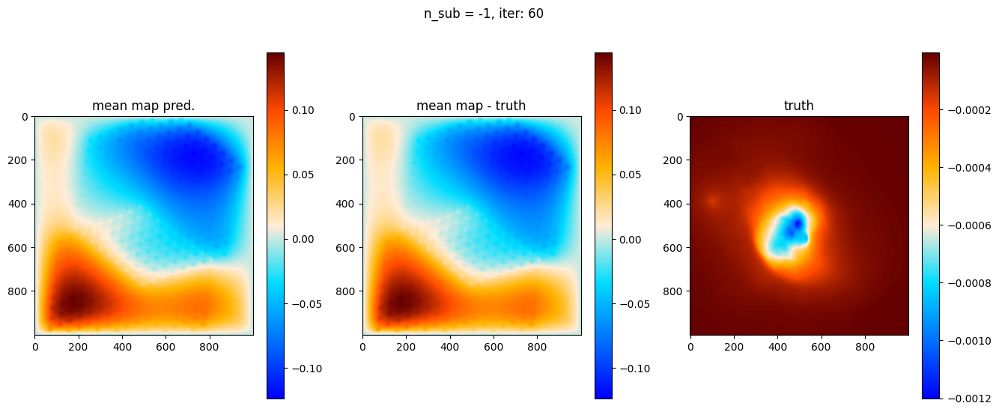

OPTIMIZE_KL: Starting 0061
SL: Iteration 0 ⛰:+3.0265e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4584e+05 Δ⛰:3.0711e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8140e+05 Δ⛰:3.5566e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8605e+05 Δ⛰:4.6452e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8769e+05 Δ⛰:1.6464e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9026e+05 Δ⛰:2.5631e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9026e+05 Δ⛰:6.1088e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.3965e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5317e+05 Δ⛰:6.8497e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7599e+05 Δ⛰:2.2822e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7999e+05 Δ⛰:3.9977e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8559e+05 Δ⛰:5.5952e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8756e+05 Δ⛰:1.9704e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8756e+05 Δ⛰:1.5436e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+5.1610e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7945e+05 Δ⛰:5.6404e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8398e+05 Δ⛰:4.5302e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8574

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279367563109754, 0.0015, 0.0001
	loglogvarslope: 2.1059838918441827, -2.45, 0.1
	zeromode std (LogNormal): 1.6882185543695886e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002737028387248562, 5.6e-05, 1e-06
	loglogvarslope: -2.577522246098831, -2.5, 0.1
	zeromode std (LogNormal): 1.056237840181519e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+6.0288e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8035e+05 Δ⛰:6.5092e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8562e+05 Δ⛰:5.2716e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8620e+05 Δ⛰:5.8444e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8851e+05 Δ⛰:2.3015e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9019e+05 Δ⛰:1.6859e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9019e+05 Δ⛰:9.7634e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.7642e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3359e+05 Δ⛰:1.8076e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8243e+05 Δ⛰:4.8841e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8409e+05 Δ⛰:1.6546e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9054e+05 Δ⛰:6.4569e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9224e+05 Δ⛰:1.6924e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9226e+05 Δ⛰:2.4739e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9339e+05 Δ⛰:1.1305e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9726e+05 Δ⛰:3.8665e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9873e+05 Δ⛰:1.4746e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0113e+05 Δ⛰:2.3976e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279070044591237, 0.0015, 0.0001
	loglogvarslope: 2.0970636622868124, -2.45, 0.1
	zeromode std (LogNormal): 1.6929782681054143e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002760361373910005, 5.6e-05, 1e-06
	loglogvarslope: -2.567753290031727, -2.5, 0.1
	zeromode std (LogNormal): 1.056114993628627e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+9.9308e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3343e+05 Δ⛰:1.0364e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7786e+05 Δ⛰:4.4437e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8074e+05 Δ⛰:2.8704e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8595e+05 Δ⛰:5.2168e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8771e+05 Δ⛰:1.7582e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8771e+05 Δ⛰:8.9742e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.2147e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7000e+05 Δ⛰:1.4853e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7934e+05 Δ⛰:9.3409e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8350e+05 Δ⛰:4.1547e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8835e+05 Δ⛰:4.8495e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9065e+05 Δ⛰:2.3062e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9072e+05 Δ⛰:6.6869e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9320e+05 Δ⛰:2.4780e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9585e+05 Δ⛰:2.6549e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9944e+05 Δ⛰:3.5854e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0102e+05 Δ⛰:1.5862e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279256379747808, 0.0015, 0.0001
	loglogvarslope: 2.1018863948492514, -2.45, 0.1
	zeromode std (LogNormal): 1.6899956922823353e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.00276014161170176, 5.6e-05, 1e-06
	loglogvarslope: -2.5596963322381585, -2.5, 0.1
	zeromode std (LogNormal): 1.0554355995950168e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+8.5992e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4858e+05 Δ⛰:1.3085e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8343e+05 Δ⛰:3.4846e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8614e+05 Δ⛰:2.7151e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8860e+05 Δ⛰:2.4544e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8978e+05 Δ⛰:1.1779e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8978e+05 Δ⛰:1.8862e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.2634e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7592e+05 Δ⛰:4.9584e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8088e+05 Δ⛰:4.9603e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8206e+05 Δ⛰:1.1745e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8697e+05 Δ⛰:4.9119e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8962e+05 Δ⛰:2.6504e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8963e+05 Δ⛰:4.1937e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.1940e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2325e+05 Δ⛰:3.8473e+03 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8777e+05 Δ⛰:6.4521e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.9005e+05 Δ⛰:2.2804e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279269634470604, 0.0015, 0.0001
	loglogvarslope: 2.1019241153767965, -2.45, 0.1
	zeromode std (LogNormal): 1.6897837321359894e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.00278956513445759, 5.6e-05, 1e-06
	loglogvarslope: -2.5339228498250232, -2.5, 0.1
	zeromode std (LogNormal): 1.0433931103201719e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.2465e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3599e+05 Δ⛰:1.2901e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8517e+05 Δ⛰:4.9181e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8743e+05 Δ⛰:2.2627e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8874e+05 Δ⛰:1.3106e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9155e+05 Δ⛰:2.8102e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9155e+05 Δ⛰:1.0954e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+5.9277e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3690e+05 Δ⛰:6.3646e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8139e+05 Δ⛰:4.4492e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8330e+05 Δ⛰:1.9041e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8829e+05 Δ⛰:4.9917e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8987e+05 Δ⛰:1.5789e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8987e+05 Δ⛰:1.4901e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+9.7916e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4661e+05 Δ⛰:1.0238e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8422e+05 Δ⛰:3.7614e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8511e+05 Δ⛰:8.8532e+02 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279113530098227, 0.0015, 0.0001
	loglogvarslope: 2.098915274032324, -2.45, 0.1
	zeromode std (LogNormal): 1.6922817433977438e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002774163380103214, 5.6e-05, 1e-06
	loglogvarslope: -2.5521499590021355, -2.5, 0.1
	zeromode std (LogNormal): 1.026183078034795e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-3.7325e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.0365e+05 Δ⛰:3.0402e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7616e+05 Δ⛰:7.2512e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7845e+05 Δ⛰:2.2853e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8653e+05 Δ⛰:8.0840e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8838e+05 Δ⛰:1.8506e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8840e+05 Δ⛰:1.5549e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9057e+05 Δ⛰:2.1731e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9393e+05 Δ⛰:3.3599e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9564e+05 Δ⛰:1.7108e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9908e+05 Δ⛰:3.4425e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9908e+05 Δ⛰:6.1034e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.2087e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3027e+05 Δ⛰:9.4055e+03 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7717e+05 Δ⛰:4.6896e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8028e+05 Δ⛰:3.1067e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8509e+05 Δ⛰:4.8149e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8790e+05 Δ⛰:2.8120e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279264537460952, 0.0015, 0.0001
	loglogvarslope: 2.097182745053022, -2.45, 0.1
	zeromode std (LogNormal): 1.689865236801062e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028739310322814814, 5.6e-05, 1e-06
	loglogvarslope: -2.465300349971595, -2.5, 0.1
	zeromode std (LogNormal): 1.028605859668002e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+9.2106e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6488e+05 Δ⛰:1.3859e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7020e+05 Δ⛰:5.3155e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8196e+05 Δ⛰:1.1759e+04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8242e+05 Δ⛰:4.6928e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8663e+05 Δ⛰:4.2093e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8664e+05 Δ⛰:9.4057e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.6540e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6479e+05 Δ⛰:3.1188e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7861e+05 Δ⛰:1.3820e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7950e+05 Δ⛰:8.8203e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8397e+05 Δ⛰:4.4716e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8673e+05 Δ⛰:2.7661e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8674e+05 Δ⛰:2.1644e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.3952e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6083e+05 Δ⛰:1.2130e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7631e+05 Δ⛰:1.5483e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7875e+05 Δ⛰:2.4408e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279531149983749, 0.0015, 0.0001
	loglogvarslope: 2.112572548804791, -2.45, 0.1
	zeromode std (LogNormal): 1.6856072258675977e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027691172367409547, 5.6e-05, 1e-06
	loglogvarslope: -2.533046149722421, -2.5, 0.1
	zeromode std (LogNormal): 1.0283181559686276e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.2161e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7832e+05 Δ⛰:1.6944e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8785e+05 Δ⛰:9.5295e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8809e+05 Δ⛰:2.4915e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8948e+05 Δ⛰:1.3835e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9262e+05 Δ⛰:3.1412e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9262e+05 Δ⛰:9.2353e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.5980e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7667e+05 Δ⛰:6.3647e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8608e+05 Δ⛰:9.4079e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8654e+05 Δ⛰:4.5964e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8900e+05 Δ⛰:2.4556e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9133e+05 Δ⛰:2.3303e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9133e+05 Δ⛰:5.0623e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.5737e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6745e+05 Δ⛰:1.0088e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8237e+05 Δ⛰:1.4917e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8491e+05 Δ⛰:2.5425e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627891067445533, 0.0015, 0.0001
	loglogvarslope: 2.093089601965021, -2.45, 0.1
	zeromode std (LogNormal): 1.6955334312565788e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028161953164705647, 5.6e-05, 1e-06
	loglogvarslope: -2.5196675940535473, -2.5, 0.1
	zeromode std (LogNormal): 1.0283129129164032e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+2.8872e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3567e+05 Δ⛰:3.3228e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8090e+05 Δ⛰:4.5232e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8231e+05 Δ⛰:1.4155e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8611e+05 Δ⛰:3.7976e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8803e+05 Δ⛰:1.9194e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8803e+05 Δ⛰:1.1710e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.3942e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7454e+05 Δ⛰:7.1396e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8164e+05 Δ⛰:7.1003e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8322e+05 Δ⛰:1.5798e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8497e+05 Δ⛰:1.7460e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8679e+05 Δ⛰:1.8254e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8680e+05 Δ⛰:2.0119e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.2731e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5740e+05 Δ⛰:1.3188e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8050e+05 Δ⛰:2.3095e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8196e+05 Δ⛰:1.4580e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279313913404314, 0.0015, 0.0001
	loglogvarslope: 2.1052528777444497, -2.45, 0.1
	zeromode std (LogNormal): 1.6890758482880742e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027798360865283847, 5.6e-05, 1e-06
	loglogvarslope: -2.534695988769557, -2.5, 0.1
	zeromode std (LogNormal): 1.0292963524967684e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.4891e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.0006e+05 Δ⛰:1.5291e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8274e+05 Δ⛰:8.2680e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8374e+05 Δ⛰:9.9566e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8641e+05 Δ⛰:2.6715e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8863e+05 Δ⛰:2.2182e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8863e+05 Δ⛰:8.5167e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:-2.5107e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4400e+05 Δ⛰:1.9292e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8311e+05 Δ⛰:3.9110e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8431e+05 Δ⛰:1.2015e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8751e+05 Δ⛰:3.2026e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8936e+05 Δ⛰:1.8448e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8936e+05 Δ⛰:4.1897e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+5.6645e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7341e+05 Δ⛰:6.1379e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8033e+05 Δ⛰:6.9175e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8355e+05 Δ⛰:3.2200e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279054943713386, 0.0015, 0.0001
	loglogvarslope: 2.0980874581446987, -2.45, 0.1
	zeromode std (LogNormal): 1.6932202125843786e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002786505167305715, 5.6e-05, 1e-06
	loglogvarslope: -2.5408026377164448, -2.5, 0.1
	zeromode std (LogNormal): 1.0291940730836178e-09, 1e-08, 1e-07


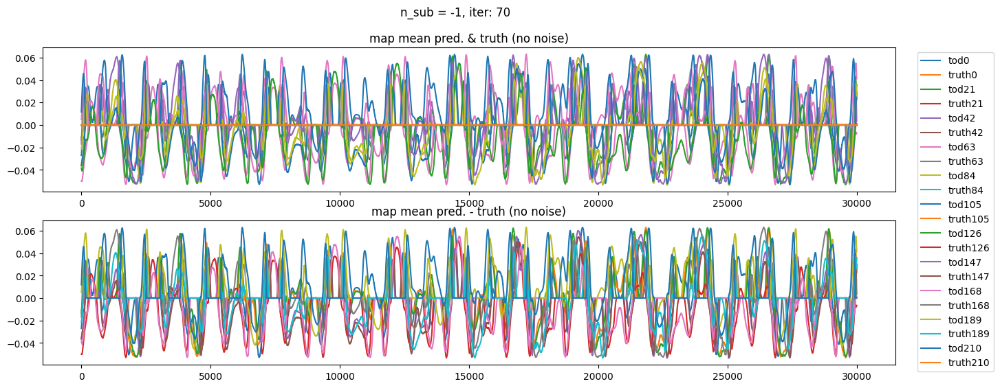

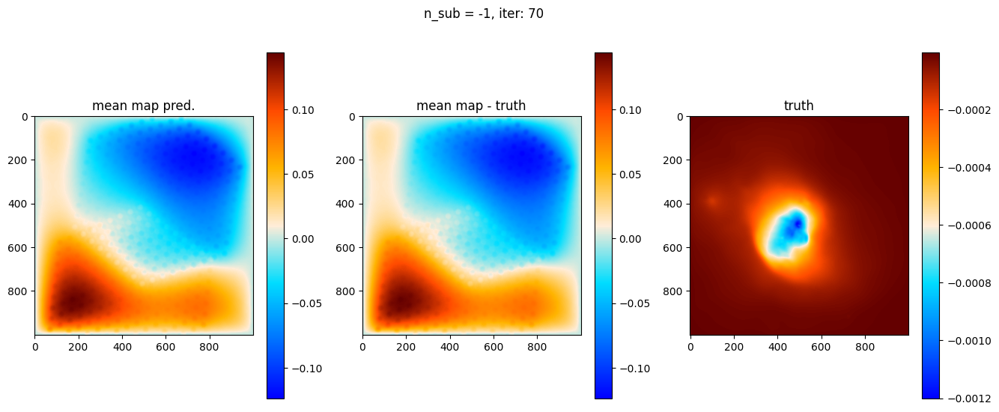

OPTIMIZE_KL: Starting 0071
SL: Iteration 0 ⛰:-2.6388e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.1943e+05 Δ⛰:1.5555e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8217e+05 Δ⛰:6.2737e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8410e+05 Δ⛰:1.9338e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8711e+05 Δ⛰:3.0099e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8979e+05 Δ⛰:2.6729e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8979e+05 Δ⛰:6.8413e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.3257e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8056e+05 Δ⛰:1.8063e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8485e+05 Δ⛰:4.2848e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8627e+05 Δ⛰:1.4231e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8816e+05 Δ⛰:1.8958e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8944e+05 Δ⛰:1.2800e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8945e+05 Δ⛰:6.7065e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.4319e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5892e+05 Δ⛰:1.1574e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8647e+05 Δ⛰:2.7554e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8738

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279199143106428, 0.0015, 0.0001
	loglogvarslope: 2.1011656119123874, -2.45, 0.1
	zeromode std (LogNormal): 1.6909112882077754e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027837656042014676, 5.6e-05, 1e-06
	loglogvarslope: -2.5391750933064436, -2.5, 0.1
	zeromode std (LogNormal): 1.0294870461167268e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-3.0872e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7527e+05 Δ⛰:1.6656e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8502e+05 Δ⛰:9.7466e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8568e+05 Δ⛰:6.6492e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8851e+05 Δ⛰:2.8306e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8989e+05 Δ⛰:1.3708e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8989e+05 Δ⛰:4.9118e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.3563e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7840e+05 Δ⛰:4.2769e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8343e+05 Δ⛰:5.0323e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8543e+05 Δ⛰:1.9971e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8696e+05 Δ⛰:1.5267e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8858e+05 Δ⛰:1.6194e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8859e+05 Δ⛰:1.7057e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9307e+05 Δ⛰:4.4829e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9623e+05 Δ⛰:3.1551e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9858e+05 Δ⛰:2.3508e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0018e+05 Δ⛰:1.6003e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279223782582196, 0.0015, 0.0001
	loglogvarslope: 2.101283449927971, -2.45, 0.1
	zeromode std (LogNormal): 1.6905170775025308e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027667328051100997, 5.6e-05, 1e-06
	loglogvarslope: -2.5624557489360384, -2.5, 0.1
	zeromode std (LogNormal): 1.7741196744159794e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+6.1779e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7347e+05 Δ⛰:6.6514e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8296e+05 Δ⛰:9.4870e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8748e+05 Δ⛰:4.5264e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8831e+05 Δ⛰:8.2578e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9002e+05 Δ⛰:1.7074e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9002e+05 Δ⛰:3.5709e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-9.7903e+04 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3974e+05 Δ⛰:3.4184e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7886e+05 Δ⛰:3.9121e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8425e+05 Δ⛰:5.3890e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8659e+05 Δ⛰:2.3380e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8879e+05 Δ⛰:2.1958e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8889e+05 Δ⛰:1.0671e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9139e+05 Δ⛰:2.4970e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9519e+05 Δ⛰:3.8025e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9833e+05 Δ⛰:3.1395e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9969e+05 Δ⛰:1.3558e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279170072201422, 0.0015, 0.0001
	loglogvarslope: 2.099955729430685, -2.45, 0.1
	zeromode std (LogNormal): 1.6913765172017677e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002770885803012118, 5.6e-05, 1e-06
	loglogvarslope: -2.560321588016476, -2.5, 0.1
	zeromode std (LogNormal): 1.7728968802686247e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+6.5474e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6965e+05 Δ⛰:7.0171e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7960e+05 Δ⛰:9.9536e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8528e+05 Δ⛰:5.6757e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8737e+05 Δ⛰:2.0893e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8862e+05 Δ⛰:1.2480e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8862e+05 Δ⛰:2.1134e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.8668e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4664e+05 Δ⛰:5.9960e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8352e+05 Δ⛰:3.6877e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8485e+05 Δ⛰:1.3273e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8798e+05 Δ⛰:3.1301e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8975e+05 Δ⛰:1.7742e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8977e+05 Δ⛰:1.7878e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9241e+05 Δ⛰:2.6369e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9559e+05 Δ⛰:3.1873e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9799e+05 Δ⛰:2.3976e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0026e+05 Δ⛰:2.2680e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279219451302523, 0.0015, 0.0001
	loglogvarslope: 2.101506473690157, -2.45, 0.1
	zeromode std (LogNormal): 1.6905863676337096e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027667439266454, 5.6e-05, 1e-06
	loglogvarslope: -2.561506486020019, -2.5, 0.1
	zeromode std (LogNormal): 1.7188369369067364e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-3.4176e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5236e+05 Δ⛰:1.1060e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7867e+05 Δ⛰:2.6309e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8209e+05 Δ⛰:3.4255e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8727e+05 Δ⛰:5.1808e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8908e+05 Δ⛰:1.8040e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8913e+05 Δ⛰:5.7405e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9217e+05 Δ⛰:3.0363e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9505e+05 Δ⛰:2.8794e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9767e+05 Δ⛰:2.6227e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0024e+05 Δ⛰:2.5677e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0174e+05 Δ⛰:1.4971e+03 ➽:1.0201e+01
SL: Iteration 12 ⛰:-5.0191e+05 Δ⛰:1.7489e+02 ➽:1.0201e+01
SL: Iteration 13 ⛰:-5.0358e+05 Δ⛰:1.6730e+03 ➽:1.0201e+01
SL: Iteration 14 ⛰:-5.0498e+05 Δ⛰:1.3953e+03 ➽:1.0201e+01
SL: Iteration 15 ⛰:-5.0505e+05 Δ⛰:7.3562e+01 ➽:1.0201e+01
SL: Iteration 16 ⛰:-5.0516e+05 Δ⛰:1.0630e+02 ➽:1.0201e+01
SL: Iteration 17 ⛰:-5.0603e+05 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279119765179244, 0.0015, 0.0001
	loglogvarslope: 2.0966564669127177, -2.45, 0.1
	zeromode std (LogNormal): 1.69218189736309e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002803435638758248, 5.6e-05, 1e-06
	loglogvarslope: -2.5360938189097157, -2.5, 0.1
	zeromode std (LogNormal): 2.122813576957332e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+9.5346e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.1319e+05 Δ⛰:9.9477e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7745e+05 Δ⛰:6.4259e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8053e+05 Δ⛰:3.0808e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8577e+05 Δ⛰:5.2384e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8787e+05 Δ⛰:2.1012e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8787e+05 Δ⛰:8.2671e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.8199e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7190e+05 Δ⛰:4.2918e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8335e+05 Δ⛰:1.1450e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8597e+05 Δ⛰:2.6221e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8778e+05 Δ⛰:1.8160e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8962e+05 Δ⛰:1.8405e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8963e+05 Δ⛰:4.6632e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.1540e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7538e+05 Δ⛰:5.9078e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7972e+05 Δ⛰:4.3420e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8627e+05 Δ⛰:6.5498e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279369485772248, 0.0015, 0.0001
	loglogvarslope: 2.1045900331396172, -2.45, 0.1
	zeromode std (LogNormal): 1.688187839641426e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027768899736300536, 5.6e-05, 1e-06
	loglogvarslope: -2.5495244248033453, -2.5, 0.1
	zeromode std (LogNormal): 2.11957396190378e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-4.1471e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4303e+05 Δ⛰:2.8326e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7937e+05 Δ⛰:3.6336e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8590e+05 Δ⛰:6.5270e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8686e+05 Δ⛰:9.6571e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8886e+05 Δ⛰:1.9945e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8889e+05 Δ⛰:2.8953e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9172e+05 Δ⛰:2.8369e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9403e+05 Δ⛰:2.3102e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9698e+05 Δ⛰:2.9439e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9930e+05 Δ⛰:2.3235e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9930e+05 Δ⛰:9.0457e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.6310e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4839e+05 Δ⛰:7.0794e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8625e+05 Δ⛰:3.7854e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8665e+05 Δ⛰:4.0468e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8816e+05 Δ⛰:1.5036e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9038e+05 Δ⛰:2.2255e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279171739197972, 0.0015, 0.0001
	loglogvarslope: 2.098532970035352, -2.45, 0.1
	zeromode std (LogNormal): 1.6913498363806376e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027970767499094647, 5.6e-05, 1e-06
	loglogvarslope: -2.5408974393740142, -2.5, 0.1
	zeromode std (LogNormal): 2.1144700973964148e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+5.8637e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7435e+05 Δ⛰:6.3381e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8373e+05 Δ⛰:9.3776e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8517e+05 Δ⛰:1.4409e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8914e+05 Δ⛰:3.9728e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9147e+05 Δ⛰:2.3276e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9147e+05 Δ⛰:4.0220e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+7.7188e+03 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6038e+05 Δ⛰:4.6810e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7543e+05 Δ⛰:1.5055e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8363e+05 Δ⛰:8.1980e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8523e+05 Δ⛰:1.5953e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8780e+05 Δ⛰:2.5724e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8780e+05 Δ⛰:1.5140e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.0055e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7314e+05 Δ⛰:2.4787e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7801e+05 Δ⛰:4.8751e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8423e+05 Δ⛰:6.2178e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627930524361255, 0.0015, 0.0001
	loglogvarslope: 2.10304186974519, -2.45, 0.1
	zeromode std (LogNormal): 1.689214428184648e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027838234895213, 5.6e-05, 1e-06
	loglogvarslope: -2.54680548279348, -2.5, 0.1
	zeromode std (LogNormal): 2.113718166934659e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-3.1310e+04 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.8403e+05 Δ⛰:3.5272e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7624e+05 Δ⛰:9.2213e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7958e+05 Δ⛰:3.3382e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8680e+05 Δ⛰:7.2204e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8913e+05 Δ⛰:2.3303e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8913e+05 Δ⛰:2.1761e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.4235e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.9465e+05 Δ⛰:2.4630e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8350e+05 Δ⛰:8.8855e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8473e+05 Δ⛰:1.2274e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8790e+05 Δ⛰:3.1715e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8970e+05 Δ⛰:1.7962e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8970e+05 Δ⛰:3.3280e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+5.2232e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6956e+05 Δ⛰:5.6927e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8048e+05 Δ⛰:1.0919e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8348e+05 Δ⛰:3.0033e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279202449858902, 0.0015, 0.0001
	loglogvarslope: 2.100442102345019, -2.45, 0.1
	zeromode std (LogNormal): 1.690858377700864e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027853346423382976, 5.6e-05, 1e-06
	loglogvarslope: -2.549036791265903, -2.5, 0.1
	zeromode std (LogNormal): 2.1096267686726057e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+5.3604e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6627e+05 Δ⛰:1.0023e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8405e+05 Δ⛰:1.7777e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8559e+05 Δ⛰:1.5404e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8717e+05 Δ⛰:1.5833e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8908e+05 Δ⛰:1.9074e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8950e+05 Δ⛰:4.1755e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9206e+05 Δ⛰:2.5642e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9463e+05 Δ⛰:2.5713e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9688e+05 Δ⛰:2.2501e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9909e+05 Δ⛰:2.2038e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9909e+05 Δ⛰:1.3796e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.9455e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.0562e+05 Δ⛰:7.3511e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7771e+05 Δ⛰:7.2090e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8133e+05 Δ⛰:3.6180e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8757e+05 Δ⛰:6.2444e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8903e+05 Δ⛰:1.4529e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279239747994088, 0.0015, 0.0001
	loglogvarslope: 2.1016958094573583, -2.45, 0.1
	zeromode std (LogNormal): 1.690261693811745e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027802957903438914, 5.6e-05, 1e-06
	loglogvarslope: -2.5512211560762235, -2.5, 0.1
	zeromode std (LogNormal): 2.1063299535287824e-09, 1e-08, 1e-07


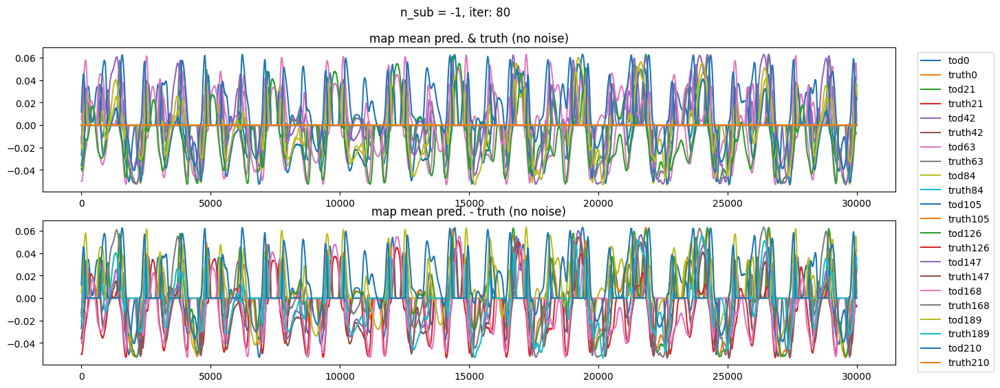

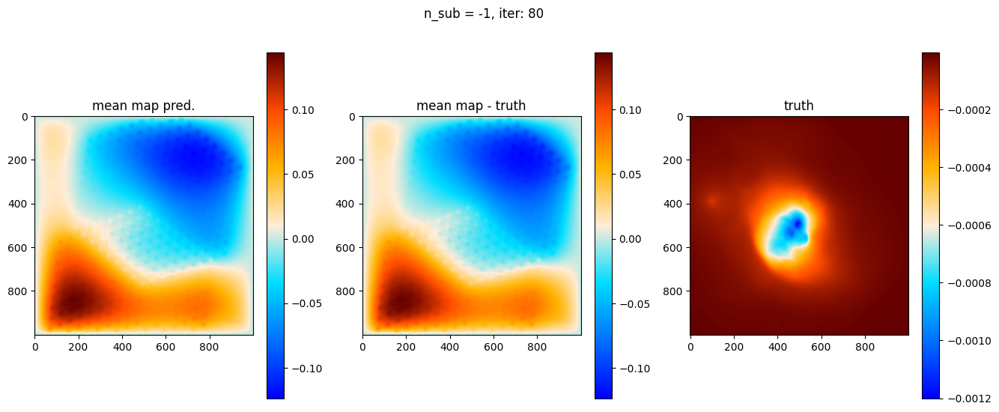

OPTIMIZE_KL: Starting 0081
SL: Iteration 0 ⛰:-3.5907e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2836e+05 Δ⛰:6.9290e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8286e+05 Δ⛰:5.4500e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8436e+05 Δ⛰:1.4964e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8677e+05 Δ⛰:2.4120e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8834e+05 Δ⛰:1.5657e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8838e+05 Δ⛰:4.0802e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9206e+05 Δ⛰:3.6807e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9498e+05 Δ⛰:2.9231e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9753e+05 Δ⛰:2.5504e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9923e+05 Δ⛰:1.6963e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9923e+05 Δ⛰:7.3546e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.3218e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5222e+05 Δ⛰:1.7740e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7912e+05 Δ⛰:2.6899e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8637e+05 Δ⛰:7.2499e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8787e+05 Δ⛰:1.5002e+03 ➽:1.0201e+01
SL: Iteration 5 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279171433424137, 0.0015, 0.0001
	loglogvarslope: 2.0977962787248323, -2.45, 0.1
	zeromode std (LogNormal): 1.6913547303665808e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028125642950432325, 5.6e-05, 1e-06
	loglogvarslope: -2.5297557364707957, -2.5, 0.1
	zeromode std (LogNormal): 2.117505506805651e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-9.4699e+03 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.7220e+05 Δ⛰:3.6273e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8150e+05 Δ⛰:1.0929e+05 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8290e+05 Δ⛰:1.4094e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8852e+05 Δ⛰:5.6202e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9034e+05 Δ⛰:1.8110e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9034e+05 Δ⛰:2.3884e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.1548e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.0607e+05 Δ⛰:3.5608e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7739e+05 Δ⛰:7.1317e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8284e+05 Δ⛰:5.4444e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8570e+05 Δ⛰:2.8617e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8925e+05 Δ⛰:3.5544e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8925e+05 Δ⛰:1.3606e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.6568e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.7463e+05 Δ⛰:8.9537e+03 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8143e+05 Δ⛰:1.0679e+05 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8314e+05 Δ⛰:1.7174e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279362556255728, 0.0015, 0.0001
	loglogvarslope: 2.1041792981738165, -2.45, 0.1
	zeromode std (LogNormal): 1.6882985429750545e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027933063094465875, 5.6e-05, 1e-06
	loglogvarslope: -2.5382674922617863, -2.5, 0.1
	zeromode std (LogNormal): 2.114671796395044e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.8070e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5682e+05 Δ⛰:2.2638e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8354e+05 Δ⛰:2.6719e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8431e+05 Δ⛰:7.7056e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8695e+05 Δ⛰:2.6387e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8884e+05 Δ⛰:1.8904e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8884e+05 Δ⛰:3.9225e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+8.7796e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.1683e+05 Δ⛰:1.2948e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8174e+05 Δ⛰:6.4907e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8330e+05 Δ⛰:1.5616e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8726e+05 Δ⛰:3.9527e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8885e+05 Δ⛰:1.5966e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8885e+05 Δ⛰:8.4294e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.8775e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3013e+05 Δ⛰:2.9205e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8283e+05 Δ⛰:5.2699e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8390e+05 Δ⛰:1.0726e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279092428976311, 0.0015, 0.0001
	loglogvarslope: 2.098136969322267, -2.45, 0.1
	zeromode std (LogNormal): 1.6926196926524847e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002778638441627581, 5.6e-05, 1e-06
	loglogvarslope: -2.5596582508700454, -2.5, 0.1
	zeromode std (LogNormal): 2.1199794817235674e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-7.4272e+04 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6025e+05 Δ⛰:3.8598e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8326e+05 Δ⛰:2.3005e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8599e+05 Δ⛰:2.7330e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8912e+05 Δ⛰:3.1282e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9213e+05 Δ⛰:3.0089e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9213e+05 Δ⛰:6.3505e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.8548e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.1463e+05 Δ⛰:2.9159e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8498e+05 Δ⛰:7.0346e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8589e+05 Δ⛰:9.0510e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8775e+05 Δ⛰:1.8637e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9091e+05 Δ⛰:3.1583e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9111e+05 Δ⛰:2.0206e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9355e+05 Δ⛰:2.4388e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9583e+05 Δ⛰:2.2817e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9840e+05 Δ⛰:2.5674e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0151e+05 Δ⛰:3.1163e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279265622186876, 0.0015, 0.0001
	loglogvarslope: 2.1019615415152106, -2.45, 0.1
	zeromode std (LogNormal): 1.689847891088449e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027808724225069563, 5.6e-05, 1e-06
	loglogvarslope: -2.5509799096613213, -2.5, 0.1
	zeromode std (LogNormal): 2.11778136498172e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+3.7250e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6041e+05 Δ⛰:4.1854e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7836e+05 Δ⛰:1.7951e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8392e+05 Δ⛰:5.5578e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8554e+05 Δ⛰:1.6243e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8950e+05 Δ⛰:3.9552e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8950e+05 Δ⛰:1.5284e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+7.4261e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7383e+05 Δ⛰:1.2164e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8479e+05 Δ⛰:1.0964e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8520e+05 Δ⛰:4.1167e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8844e+05 Δ⛰:3.2406e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9023e+05 Δ⛰:1.7890e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9023e+05 Δ⛰:2.0372e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.3401e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5385e+05 Δ⛰:1.3854e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7771e+05 Δ⛰:2.3859e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8031e+05 Δ⛰:2.5990e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627921340081028, 0.0015, 0.0001
	loglogvarslope: 2.1008417559383226, -2.45, 0.1
	zeromode std (LogNormal): 1.690683165834549e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027815234877689925, 5.6e-05, 1e-06
	loglogvarslope: -2.5524097127543723, -2.5, 0.1
	zeromode std (LogNormal): 2.1099685919736464e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-2.3672e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6606e+05 Δ⛰:2.2934e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8462e+05 Δ⛰:1.8565e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8573e+05 Δ⛰:1.1084e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8793e+05 Δ⛰:2.1989e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8941e+05 Δ⛰:1.4787e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8941e+05 Δ⛰:2.0570e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-7.8412e+04 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.0963e+05 Δ⛰:3.3121e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8482e+05 Δ⛰:7.5192e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8537e+05 Δ⛰:5.5277e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8861e+05 Δ⛰:3.2352e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9042e+05 Δ⛰:1.8111e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9042e+05 Δ⛰:1.4692e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-2.6690e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7051e+05 Δ⛰:2.0361e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8190e+05 Δ⛰:1.1390e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8479e+05 Δ⛰:2.8930e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279225830877462, 0.0015, 0.0001
	loglogvarslope: 2.101346299454259, -2.45, 0.1
	zeromode std (LogNormal): 1.6904843107039377e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027793744344541543, 5.6e-05, 1e-06
	loglogvarslope: -2.5529323101481554, -2.5, 0.1
	zeromode std (LogNormal): 2.1087466192288084e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-4.2392e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8613e+05 Δ⛰:6.2210e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8819e+05 Δ⛰:2.0678e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8835e+05 Δ⛰:1.5465e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9025e+05 Δ⛰:1.8996e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9333e+05 Δ⛰:3.0827e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9333e+05 Δ⛰:1.0764e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.1518e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7873e+05 Δ⛰:4.6305e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8633e+05 Δ⛰:7.5962e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8729e+05 Δ⛰:9.6462e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9029e+05 Δ⛰:2.9995e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9341e+05 Δ⛰:3.1234e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9341e+05 Δ⛰:1.1784e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-2.6751e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7869e+05 Δ⛰:2.1118e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8236e+05 Δ⛰:3.6672e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8662e+05 Δ⛰:4.2665e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279181192390144, 0.0015, 0.0001
	loglogvarslope: 2.1007327912876494, -2.45, 0.1
	zeromode std (LogNormal): 1.69119854288244e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027714805230119074, 5.6e-05, 1e-06
	loglogvarslope: -2.55895931636515, -2.5, 0.1
	zeromode std (LogNormal): 2.1003778361836224e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+5.1437e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7760e+05 Δ⛰:5.6213e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8503e+05 Δ⛰:7.4339e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8720e+05 Δ⛰:2.1703e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8846e+05 Δ⛰:1.2557e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9106e+05 Δ⛰:2.6030e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9106e+05 Δ⛰:1.4963e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+9.9577e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6624e+05 Δ⛰:1.4620e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8475e+05 Δ⛰:1.8506e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8544e+05 Δ⛰:6.9637e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8851e+05 Δ⛰:3.0663e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9078e+05 Δ⛰:2.2744e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9079e+05 Δ⛰:4.2157e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.3804e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7836e+05 Δ⛰:2.8587e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8355e+05 Δ⛰:5.1903e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8642e+05 Δ⛰:2.8716e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279176419346465, 0.0015, 0.0001
	loglogvarslope: 2.1011716973759453, -2.45, 0.1
	zeromode std (LogNormal): 1.691274931307308e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027598683575132854, 5.6e-05, 1e-06
	loglogvarslope: -2.5665357881878728, -2.5, 0.1
	zeromode std (LogNormal): 2.086878834512703e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.9959e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5707e+05 Δ⛰:2.4530e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8716e+05 Δ⛰:3.0093e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8792e+05 Δ⛰:7.5516e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9000e+05 Δ⛰:2.0777e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9182e+05 Δ⛰:1.8182e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9182e+05 Δ⛰:1.9762e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+7.8264e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5451e+05 Δ⛰:8.2809e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7758e+05 Δ⛰:2.3065e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8044e+05 Δ⛰:2.8596e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8504e+05 Δ⛰:4.6044e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8770e+05 Δ⛰:2.6566e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8770e+05 Δ⛰:3.3195e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.2049e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6190e+05 Δ⛰:4.6668e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8351e+05 Δ⛰:2.1603e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8482e+05 Δ⛰:1.3174e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279166375602811, 0.0015, 0.0001
	loglogvarslope: 2.1011879525691883, -2.45, 0.1
	zeromode std (LogNormal): 1.691435684073999e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002735933847337889, 5.6e-05, 1e-06
	loglogvarslope: -2.577364433720299, -2.5, 0.1
	zeromode std (LogNormal): 2.0193642540820504e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-1.6195e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5537e+05 Δ⛰:2.9342e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7802e+05 Δ⛰:2.2652e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8281e+05 Δ⛰:4.7906e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8831e+05 Δ⛰:5.4955e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9055e+05 Δ⛰:2.2406e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9055e+05 Δ⛰:3.6332e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.2255e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8152e+05 Δ⛰:4.7070e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8378e+05 Δ⛰:2.2542e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8858e+05 Δ⛰:4.8005e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8922e+05 Δ⛰:6.4821e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9053e+05 Δ⛰:1.3099e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9054e+05 Δ⛰:4.8651e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.6686e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7344e+05 Δ⛰:7.1421e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8111e+05 Δ⛰:7.6646e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8252e+05 Δ⛰:1.4107e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279120120422956, 0.0015, 0.0001
	loglogvarslope: 2.0997560181652535, -2.45, 0.1
	zeromode std (LogNormal): 1.6921762088466554e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027407285398479337, 5.6e-05, 1e-06
	loglogvarslope: -2.5745541226476556, -2.5, 0.1
	zeromode std (LogNormal): 2.0154313264315923e-09, 1e-08, 1e-07


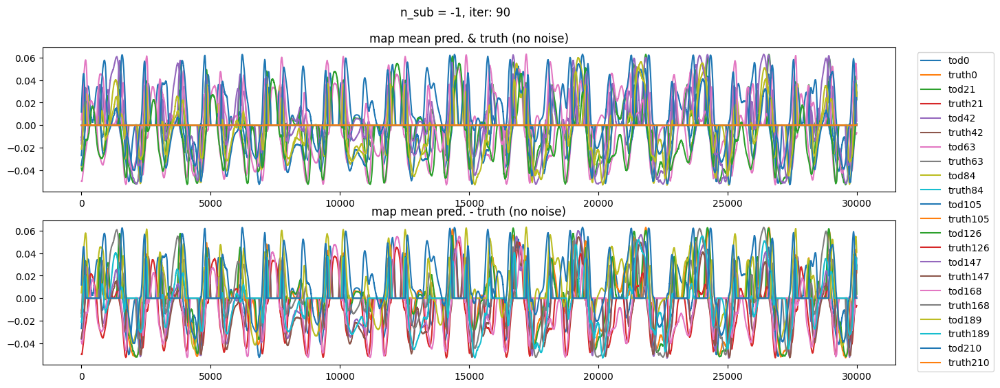

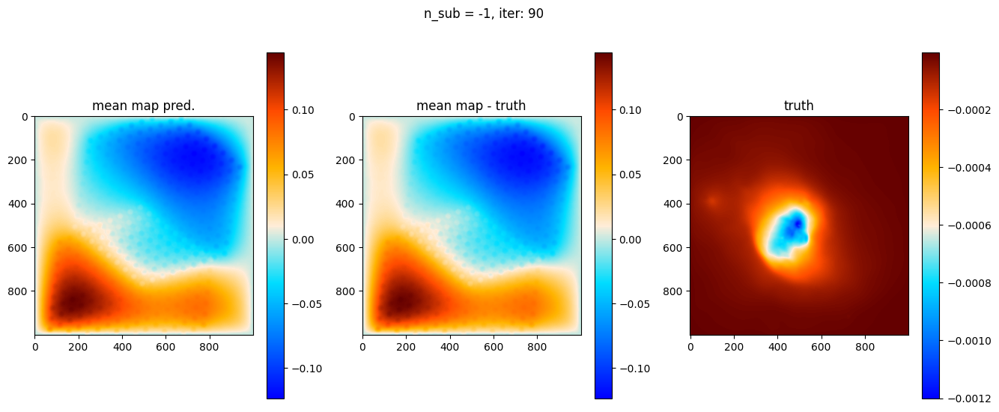

OPTIMIZE_KL: Starting 0091
SL: Iteration 0 ⛰:-3.4027e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7814e+05 Δ⛰:1.3787e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8394e+05 Δ⛰:5.7966e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8690e+05 Δ⛰:2.9605e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8755e+05 Δ⛰:6.4835e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8893e+05 Δ⛰:1.3813e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8893e+05 Δ⛰:6.5472e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.1858e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2149e+05 Δ⛰:2.9085e+03 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8585e+05 Δ⛰:6.4361e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8665e+05 Δ⛰:8.0087e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8916e+05 Δ⛰:2.5062e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9220e+05 Δ⛰:3.0425e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9237e+05 Δ⛰:1.6676e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9427e+05 Δ⛰:1.9079e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9591e+05 Δ⛰:1.6313e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9829e+05 Δ⛰:2.3847e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279179736615455, 0.0015, 0.0001
	loglogvarslope: 2.0995371138466172, -2.45, 0.1
	zeromode std (LogNormal): 1.691221840952242e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002771637773616556, 5.6e-05, 1e-06
	loglogvarslope: -2.548386033754939, -2.5, 0.1
	zeromode std (LogNormal): 2.0247569257742305e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+2.8515e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7096e+05 Δ⛰:3.3225e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7866e+05 Δ⛰:7.6998e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8252e+05 Δ⛰:3.8530e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8814e+05 Δ⛰:5.6218e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9077e+05 Δ⛰:2.6333e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9077e+05 Δ⛰:1.1898e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.8934e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7153e+05 Δ⛰:2.3649e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8338e+05 Δ⛰:1.1858e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8433e+05 Δ⛰:9.4623e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8814e+05 Δ⛰:3.8091e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8997e+05 Δ⛰:1.8292e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8997e+05 Δ⛰:8.3802e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.8955e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7535e+05 Δ⛰:4.3709e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8143e+05 Δ⛰:6.0880e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8348e+05 Δ⛰:2.0500e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279268426921494, 0.0015, 0.0001
	loglogvarslope: 2.1021439059611655, -2.45, 0.1
	zeromode std (LogNormal): 1.6898030414764907e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027647122270166202, 5.6e-05, 1e-06
	loglogvarslope: -2.551895688889971, -2.5, 0.1
	zeromode std (LogNormal): 2.023610641098979e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+3.1342e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.0687e+05 Δ⛰:3.5411e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7684e+05 Δ⛰:6.9965e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8481e+05 Δ⛰:7.9699e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8523e+05 Δ⛰:4.2360e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8701e+05 Δ⛰:1.7757e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8701e+05 Δ⛰:1.5776e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.3796e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5928e+05 Δ⛰:7.9724e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8258e+05 Δ⛰:2.3301e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8379e+05 Δ⛰:1.2095e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8694e+05 Δ⛰:3.1528e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8859e+05 Δ⛰:1.6480e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8859e+05 Δ⛰:1.2901e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.3996e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3982e+05 Δ⛰:8.7978e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8367e+05 Δ⛰:4.3845e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8566e+05 Δ⛰:1.9914e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279162850429568, 0.0015, 0.0001
	loglogvarslope: 2.1008687451279986, -2.45, 0.1
	zeromode std (LogNormal): 1.691492109044478e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027467333631194845, 5.6e-05, 1e-06
	loglogvarslope: -2.568245926192108, -2.5, 0.1
	zeromode std (LogNormal): 2.017096930267805e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+4.7726e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.4651e+05 Δ⛰:8.2377e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8242e+05 Δ⛰:1.3591e+05 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8580e+05 Δ⛰:3.3766e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8876e+05 Δ⛰:2.9585e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9063e+05 Δ⛰:1.8776e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9142e+05 Δ⛰:7.8623e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9235e+05 Δ⛰:9.3047e+02 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9533e+05 Δ⛰:2.9801e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9913e+05 Δ⛰:3.7951e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0061e+05 Δ⛰:1.4846e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0061e+05 Δ⛰:1.6015e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.6241e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6298e+05 Δ⛰:5.6249e+02 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7425e+05 Δ⛰:1.1270e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8007e+05 Δ⛰:5.8219e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8635e+05 Δ⛰:6.2803e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8878e+05 Δ⛰:2.4287e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279213041682724, 0.0015, 0.0001
	loglogvarslope: 2.096005146238701, -2.45, 0.1
	zeromode std (LogNormal): 1.690688911509123e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002820833790025925, 5.6e-05, 1e-06
	loglogvarslope: -2.5145720536999763, -2.5, 0.1
	zeromode std (LogNormal): 2.0131882552057905e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+5.6505e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6848e+05 Δ⛰:6.1190e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8014e+05 Δ⛰:1.1669e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8433e+05 Δ⛰:4.1869e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8509e+05 Δ⛰:7.6237e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8647e+05 Δ⛰:1.3792e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8649e+05 Δ⛰:1.6292e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9135e+05 Δ⛰:4.8594e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9386e+05 Δ⛰:2.5072e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9661e+05 Δ⛰:2.7528e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9918e+05 Δ⛰:2.5684e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9918e+05 Δ⛰:8.4264e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.6095e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.7885e+05 Δ⛰:1.7907e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8057e+05 Δ⛰:1.0171e+05 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8212e+05 Δ⛰:1.5577e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8742e+05 Δ⛰:5.2952e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8948e+05 Δ⛰:2.0594e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627947910980838, 0.0015, 0.0001
	loglogvarslope: 2.1068109817166487, -2.45, 0.1
	zeromode std (LogNormal): 1.686437499372081e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027864539736724477, 5.6e-05, 1e-06
	loglogvarslope: -2.531272308613531, -2.5, 0.1
	zeromode std (LogNormal): 2.010782386890988e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+2.1897e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6758e+05 Δ⛰:2.2365e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7692e+05 Δ⛰:9.3336e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8054e+05 Δ⛰:3.6211e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8453e+05 Δ⛰:3.9888e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8709e+05 Δ⛰:2.5667e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8710e+05 Δ⛰:2.8367e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.3531e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7841e+05 Δ⛰:9.1372e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8287e+05 Δ⛰:4.4598e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8660e+05 Δ⛰:3.7338e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8792e+05 Δ⛰:1.3123e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9073e+05 Δ⛰:2.8184e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9087e+05 Δ⛰:1.3869e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9282e+05 Δ⛰:1.9429e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9612e+05 Δ⛰:3.3086e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9978e+05 Δ⛰:3.6552e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0096e+05 Δ⛰:1.1756e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279232938967605, 0.0015, 0.0001
	loglogvarslope: 2.10086352885991, -2.45, 0.1
	zeromode std (LogNormal): 1.6903706067118797e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027823788312947074, 5.6e-05, 1e-06
	loglogvarslope: -2.5416964427230724, -2.5, 0.1
	zeromode std (LogNormal): 2.011714804494955e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.9790e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7642e+05 Δ⛰:2.4555e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8478e+05 Δ⛰:8.3553e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8558e+05 Δ⛰:8.0221e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8739e+05 Δ⛰:1.8112e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8986e+05 Δ⛰:2.4724e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8987e+05 Δ⛰:3.2889e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.1346e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6086e+05 Δ⛰:1.5954e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.6872e+05 Δ⛰:7.8637e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8452e+05 Δ⛰:1.5800e+04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8602e+05 Δ⛰:1.5000e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8802e+05 Δ⛰:1.9990e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8805e+05 Δ⛰:3.0419e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9150e+05 Δ⛰:3.4554e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9418e+05 Δ⛰:2.6785e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9845e+05 Δ⛰:4.2649e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0015e+05 Δ⛰:1.6978e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279295794439813, 0.0015, 0.0001
	loglogvarslope: 2.1029121840067786, -2.45, 0.1
	zeromode std (LogNormal): 1.689365478833175e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002773909456786425, 5.6e-05, 1e-06
	loglogvarslope: -2.545600818098582, -2.5, 0.1
	zeromode std (LogNormal): 2.0070392651518357e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-1.5470e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6923e+05 Δ⛰:3.1453e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8365e+05 Δ⛰:1.4415e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8427e+05 Δ⛰:6.2588e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8600e+05 Δ⛰:1.7267e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8836e+05 Δ⛰:2.3624e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8837e+05 Δ⛰:1.7085e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-1.1080e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7688e+05 Δ⛰:3.6608e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8450e+05 Δ⛰:7.6178e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8529e+05 Δ⛰:7.8675e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8763e+05 Δ⛰:2.3425e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8905e+05 Δ⛰:1.4210e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8905e+05 Δ⛰:1.4157e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.3314e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4140e+05 Δ⛰:6.7728e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8617e+05 Δ⛰:4.4773e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8668e+05 Δ⛰:5.0881e+02 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279183965864617, 0.0015, 0.0001
	loglogvarslope: 2.1010565854689265, -2.45, 0.1
	zeromode std (LogNormal): 1.6911541574602706e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027559311854457136, 5.6e-05, 1e-06
	loglogvarslope: -2.561352598917352, -2.5, 0.1
	zeromode std (LogNormal): 1.998354524212892e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.8424e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5108e+05 Δ⛰:2.2935e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8482e+05 Δ⛰:3.3741e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8525e+05 Δ⛰:4.2767e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8872e+05 Δ⛰:3.4634e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9068e+05 Δ⛰:1.9674e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9068e+05 Δ⛰:1.1237e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.2375e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7755e+05 Δ⛰:6.0130e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8199e+05 Δ⛰:4.4408e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8751e+05 Δ⛰:5.5202e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8798e+05 Δ⛰:4.6845e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8981e+05 Δ⛰:1.8346e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8981e+05 Δ⛰:7.7172e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.6637e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6351e+05 Δ⛰:9.7141e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8466e+05 Δ⛰:2.1157e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8604e+05 Δ⛰:1.3796e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279204462968993, 0.0015, 0.0001
	loglogvarslope: 2.101856966739824, -2.45, 0.1
	zeromode std (LogNormal): 1.690826167232251e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027457637118407244, 5.6e-05, 1e-06
	loglogvarslope: -2.565434207854492, -2.5, 0.1
	zeromode std (LogNormal): 1.976642732411579e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-2.6640e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5742e+05 Δ⛰:1.9103e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7781e+05 Δ⛰:2.0389e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8769e+05 Δ⛰:9.8757e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8800e+05 Δ⛰:3.0758e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9047e+05 Δ⛰:2.4783e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9050e+05 Δ⛰:2.7563e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9275e+05 Δ⛰:2.2491e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9740e+05 Δ⛰:4.6522e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9881e+05 Δ⛰:1.4047e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0100e+05 Δ⛰:2.1958e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0101e+05 Δ⛰:1.2667e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-2.6427e+04 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7856e+05 Δ⛰:4.5213e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8258e+05 Δ⛰:4.0180e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8552e+05 Δ⛰:2.9410e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8676e+05 Δ⛰:1.2364e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8949e+05 Δ⛰:2.7318e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279090552788337, 0.0015, 0.0001
	loglogvarslope: 2.096533838922803, -2.45, 0.1
	zeromode std (LogNormal): 1.6926497444395233e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027775461427378403, 5.6e-05, 1e-06
	loglogvarslope: -2.542745991526104, -2.5, 0.1
	zeromode std (LogNormal): 1.970083559024749e-09, 1e-08, 1e-07


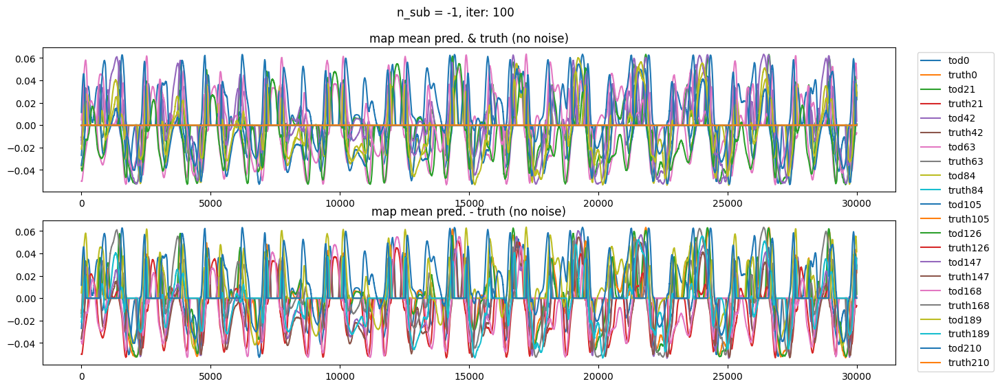

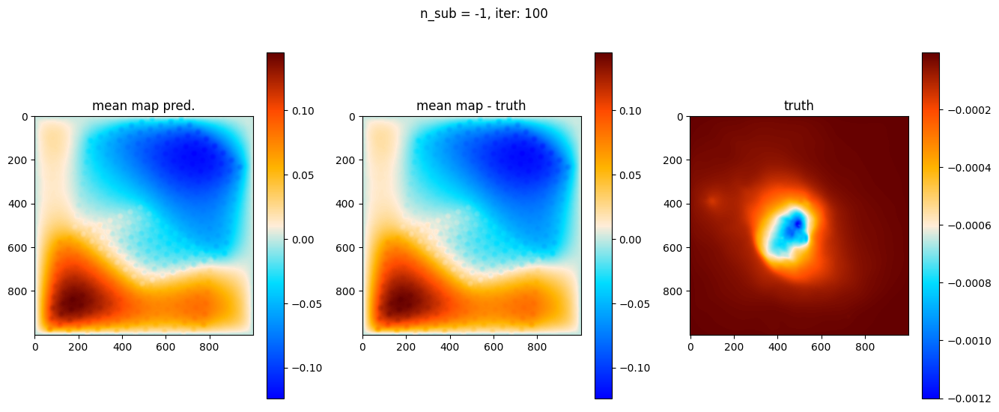

OPTIMIZE_KL: Starting 0101
SL: Iteration 0 ⛰:-2.9992e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6243e+05 Δ⛰:1.6252e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8035e+05 Δ⛰:1.7920e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8377e+05 Δ⛰:3.4179e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8603e+05 Δ⛰:2.2527e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8788e+05 Δ⛰:1.8505e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8791e+05 Δ⛰:2.9360e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9058e+05 Δ⛰:2.6712e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9381e+05 Δ⛰:3.2296e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9680e+05 Δ⛰:2.9951e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9866e+05 Δ⛰:1.8544e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9866e+05 Δ⛰:6.5754e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+7.4920e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6769e+05 Δ⛰:1.2169e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7892e+05 Δ⛰:1.1228e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8277e+05 Δ⛰:3.8445e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8599e+05 Δ⛰:3.2262e+03 ➽:1.0201e+01
SL: Iteration 5 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279312866300934, 0.0015, 0.0001
	loglogvarslope: 2.103455235806428, -2.45, 0.1
	zeromode std (LogNormal): 1.689092584968232e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027616771029511434, 5.6e-05, 1e-06
	loglogvarslope: -2.5485543160006756, -2.5, 0.1
	zeromode std (LogNormal): 1.96672478526458e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+2.8620e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6500e+05 Δ⛰:2.9085e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8451e+05 Δ⛰:1.9516e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8573e+05 Δ⛰:1.2174e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8996e+05 Δ⛰:4.2257e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9236e+05 Δ⛰:2.4053e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9239e+05 Δ⛰:3.0031e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9459e+05 Δ⛰:2.1984e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9845e+05 Δ⛰:3.8566e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9993e+05 Δ⛰:1.4863e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0140e+05 Δ⛰:1.4688e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0162e+05 Δ⛰:2.1801e+02 ➽:1.0201e+01
SL: Iteration 12 ⛰:-5.0300e+05 Δ⛰:1.3753e+03 ➽:1.0201e+01
SL: Iteration 13 ⛰:-5.0392e+05 Δ⛰:9.2769e+02 ➽:1.0201e+01
SL: Iteration 14 ⛰:-5.0486e+05 Δ⛰:9.3488e+02 ➽:1.0201e+01
SL: Iteration 15 ⛰:-5.0490e+05 Δ⛰:3.9180e+01 ➽:1.0201e+01
SL: Iteration 16 ⛰:-5.0490e+05 Δ⛰:2.6474e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.6638e+06 Δ

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279180336867419, 0.0015, 0.0001
	loglogvarslope: 2.099277949442607, -2.45, 0.1
	zeromode std (LogNormal): 1.6912122345676697e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027755445489772877, 5.6e-05, 1e-06
	loglogvarslope: -2.542809758635594, -2.5, 0.1
	zeromode std (LogNormal): 1.963844501129943e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+2.1368e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6708e+05 Δ⛰:6.8076e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8068e+05 Δ⛰:1.3606e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8292e+05 Δ⛰:2.2328e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8800e+05 Δ⛰:5.0884e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8997e+05 Δ⛰:1.9652e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8997e+05 Δ⛰:2.9913e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.8874e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6720e+05 Δ⛰:5.3546e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7819e+05 Δ⛰:1.0988e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8491e+05 Δ⛰:6.7272e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8754e+05 Δ⛰:2.6235e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8906e+05 Δ⛰:1.5258e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8906e+05 Δ⛰:3.1048e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+5.4143e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7443e+05 Δ⛰:5.8887e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7955e+05 Δ⛰:5.1166e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8376e+05 Δ⛰:4.2110e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279273970180982, 0.0015, 0.0001
	loglogvarslope: 2.1030298238672938, -2.45, 0.1
	zeromode std (LogNormal): 1.6897144044662144e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027578038737568053, 5.6e-05, 1e-06
	loglogvarslope: -2.552971859175964, -2.5, 0.1
	zeromode std (LogNormal): 1.9702514340139376e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+4.4798e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5949e+05 Δ⛰:4.9393e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8685e+05 Δ⛰:2.7360e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8764e+05 Δ⛰:7.8792e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.9045e+05 Δ⛰:2.8104e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9197e+05 Δ⛰:1.5222e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9197e+05 Δ⛰:3.0836e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+7.6513e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8217e+05 Δ⛰:8.1335e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8491e+05 Δ⛰:2.7349e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8758e+05 Δ⛰:2.6751e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8888e+05 Δ⛰:1.3000e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9059e+05 Δ⛰:1.7055e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9059e+05 Δ⛰:1.0506e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.4118e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6308e+05 Δ⛰:2.1899e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8155e+05 Δ⛰:1.8467e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8420e+05 Δ⛰:2.6477e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279176966482786, 0.0015, 0.0001
	loglogvarslope: 2.099835299646683, -2.45, 0.1
	zeromode std (LogNormal): 1.6912661747296302e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027647815702989175, 5.6e-05, 1e-06
	loglogvarslope: -2.551051167689808, -2.5, 0.1
	zeromode std (LogNormal): 1.9697366259190022e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-3.8315e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4556e+05 Δ⛰:6.2414e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8355e+05 Δ⛰:3.7985e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8430e+05 Δ⛰:7.4867e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8713e+05 Δ⛰:2.8274e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8880e+05 Δ⛰:1.6755e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9146e+05 Δ⛰:2.6558e+03 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9257e+05 Δ⛰:1.1123e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9435e+05 Δ⛰:1.7849e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9773e+05 Δ⛰:3.3747e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9920e+05 Δ⛰:1.4695e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9925e+05 Δ⛰:5.4120e+01 ➽:1.0201e+01
SL: Iteration 12 ⛰:-5.0163e+05 Δ⛰:2.3811e+03 ➽:1.0201e+01
SL: Iteration 13 ⛰:-5.0332e+05 Δ⛰:1.6821e+03 ➽:1.0201e+01
SL: Iteration 14 ⛰:-5.0440e+05 Δ⛰:1.0878e+03 ➽:1.0201e+01
SL: Iteration 15 ⛰:-5.0444e+05 Δ⛰:3.7049e+01 ➽:1.0201e+01
SL: Iteration 16 ⛰:-5.0444e+05 Δ⛰:4.2813e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.9386e+06 Δ

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279234667233152, 0.0015, 0.0001
	loglogvarslope: 2.1014267317814115, -2.45, 0.1
	zeromode std (LogNormal): 1.6903429618275674e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002766035200314514, 5.6e-05, 1e-06
	loglogvarslope: -2.5435218671547446, -2.5, 0.1
	zeromode std (LogNormal): 1.93343468058036e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.9485e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4594e+05 Δ⛰:1.9931e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8265e+05 Δ⛰:3.6707e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8394e+05 Δ⛰:1.2898e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8784e+05 Δ⛰:3.9019e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8932e+05 Δ⛰:1.4775e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8932e+05 Δ⛰:8.0059e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.4130e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7235e+05 Δ⛰:4.8853e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7878e+05 Δ⛰:6.4394e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8634e+05 Δ⛰:7.5602e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8688e+05 Δ⛰:5.3701e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8920e+05 Δ⛰:2.3157e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8980e+05 Δ⛰:5.9799e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9227e+05 Δ⛰:2.4761e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9535e+05 Δ⛰:3.0810e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9752e+05 Δ⛰:2.1694e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9944e+05 Δ⛰:1.9216e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627920700615801, 0.0015, 0.0001
	loglogvarslope: 2.1003553950342866, -2.45, 0.1
	zeromode std (LogNormal): 1.6907854761527935e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027725114633134185, 5.6e-05, 1e-06
	loglogvarslope: -2.539788115442369, -2.5, 0.1
	zeromode std (LogNormal): 1.9294960189071758e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-4.1328e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6209e+05 Δ⛰:4.8815e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8052e+05 Δ⛰:1.8426e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8216e+05 Δ⛰:1.6444e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8538e+05 Δ⛰:3.2188e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8903e+05 Δ⛰:3.6459e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8908e+05 Δ⛰:4.6221e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9310e+05 Δ⛰:4.0243e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9566e+05 Δ⛰:2.5620e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9759e+05 Δ⛰:1.9291e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0042e+05 Δ⛰:2.8313e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0043e+05 Δ⛰:1.0365e+01 ➽:1.0201e+01
SL: Iteration 12 ⛰:-5.0230e+05 Δ⛰:1.8686e+03 ➽:1.0201e+01
SL: Iteration 13 ⛰:-5.0313e+05 Δ⛰:8.3184e+02 ➽:1.0201e+01
SL: Iteration 14 ⛰:-5.0470e+05 Δ⛰:1.5705e+03 ➽:1.0201e+01
SL: Iteration 15 ⛰:-5.0478e+05 Δ⛰:7.4121e+01 ➽:1.0201e+01
SL: Iteration 16 ⛰:-5.0479e+05 Δ⛰:1.0396e+01 ➽:1.0201e+01
SL: Iteration 17 ⛰:-5.0576e+05 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279218788550663, 0.0015, 0.0001
	loglogvarslope: 2.1002847141096828, -2.45, 0.1
	zeromode std (LogNormal): 1.690596970506132e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002819591855333262, 5.6e-05, 1e-06
	loglogvarslope: -2.519248492537849, -2.5, 0.1
	zeromode std (LogNormal): 1.7222492437815555e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+6.5231e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5392e+05 Δ⛰:1.1062e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7727e+05 Δ⛰:2.3347e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8038e+05 Δ⛰:3.1057e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8772e+05 Δ⛰:7.3484e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8929e+05 Δ⛰:1.5671e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8929e+05 Δ⛰:1.3591e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.0873e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6562e+05 Δ⛰:2.1338e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8189e+05 Δ⛰:1.6275e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8288e+05 Δ⛰:9.8585e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8565e+05 Δ⛰:2.7712e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8825e+05 Δ⛰:2.6003e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8826e+05 Δ⛰:1.0674e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9064e+05 Δ⛰:2.3809e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9405e+05 Δ⛰:3.4079e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9666e+05 Δ⛰:2.6081e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9751e+05 Δ⛰:8.5240e+02 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279247438936726, 0.0015, 0.0001
	loglogvarslope: 2.101257874792508, -2.45, 0.1
	zeromode std (LogNormal): 1.6901386830499636e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002817109210514961, 5.6e-05, 1e-06
	loglogvarslope: -2.520734680380009, -2.5, 0.1
	zeromode std (LogNormal): 1.7055590035483541e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-4.5813e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7102e+05 Δ⛰:1.2883e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8645e+05 Δ⛰:1.5434e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8699e+05 Δ⛰:5.3971e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8877e+05 Δ⛰:1.7827e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9036e+05 Δ⛰:1.5887e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9039e+05 Δ⛰:2.6827e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9300e+05 Δ⛰:2.6143e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9710e+05 Δ⛰:4.0955e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9966e+05 Δ⛰:2.5596e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0112e+05 Δ⛰:1.4655e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0112e+05 Δ⛰:3.9711e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+8.6155e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6243e+05 Δ⛰:9.0780e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8293e+05 Δ⛰:2.0503e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8356e+05 Δ⛰:6.3196e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8674e+05 Δ⛰:3.1838e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8836e+05 Δ⛰:1.6193e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279188571673127, 0.0015, 0.0001
	loglogvarslope: 2.1004180229800715, -2.45, 0.1
	zeromode std (LogNormal): 1.691080450861346e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028075942548558934, 5.6e-05, 1e-06
	loglogvarslope: -2.529125183011467, -2.5, 0.1
	zeromode std (LogNormal): 1.6950273112003173e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+7.1302e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.1345e+05 Δ⛰:1.1265e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7393e+05 Δ⛰:6.0475e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7740e+05 Δ⛰:3.4730e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8496e+05 Δ⛰:7.5656e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8717e+05 Δ⛰:2.2063e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8717e+05 Δ⛰:1.3159e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.6707e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6924e+05 Δ⛰:2.1400e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7524e+05 Δ⛰:6.0031e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8405e+05 Δ⛰:8.8023e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8456e+05 Δ⛰:5.1490e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8605e+05 Δ⛰:1.4828e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8605e+05 Δ⛰:1.5726e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.1190e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7281e+05 Δ⛰:1.1663e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7711e+05 Δ⛰:4.2947e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8253e+05 Δ⛰:5.4275e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627920315192265, 0.0015, 0.0001
	loglogvarslope: 2.1026306210503254, -2.45, 0.1
	zeromode std (LogNormal): 1.69084714452371e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027770458384826766, 5.6e-05, 1e-06
	loglogvarslope: -2.5487109090382623, -2.5, 0.1
	zeromode std (LogNormal): 1.6888635456442381e-09, 1e-08, 1e-07


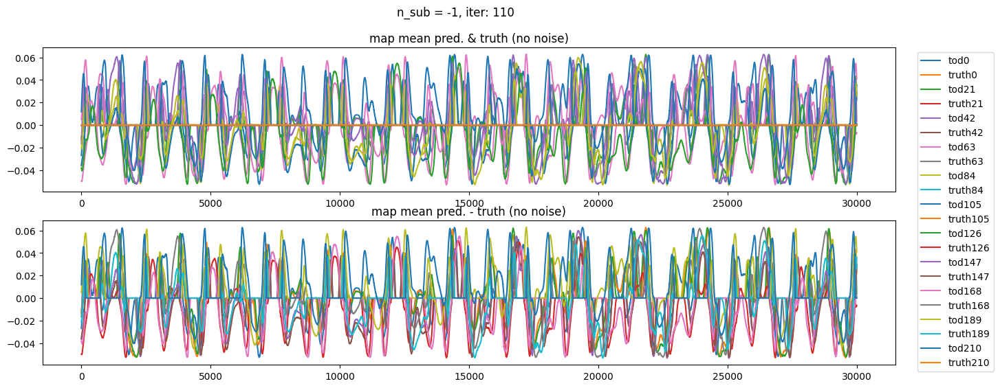

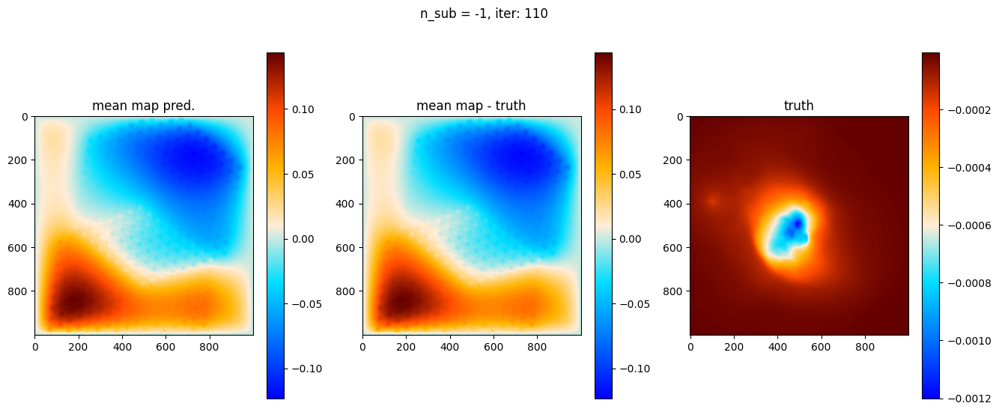

OPTIMIZE_KL: Starting 0111
SL: Iteration 0 ⛰:+9.8780e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7615e+05 Δ⛰:1.0354e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8614e+05 Δ⛰:9.9838e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8768e+05 Δ⛰:1.5398e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8993e+05 Δ⛰:2.2495e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9148e+05 Δ⛰:1.5552e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9148e+05 Δ⛰:1.1410e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.1596e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6226e+05 Δ⛰:1.2058e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7877e+05 Δ⛰:1.6506e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8133e+05 Δ⛰:2.5601e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8816e+05 Δ⛰:6.8357e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8990e+05 Δ⛰:1.7334e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8990e+05 Δ⛰:1.2654e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+7.4387e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6545e+05 Δ⛰:1.2093e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8706e+05 Δ⛰:2.1614e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8792

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627906107917325, 0.0015, 0.0001
	loglogvarslope: 2.098417980015183, -2.45, 0.1
	zeromode std (LogNormal): 1.6931219071294247e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002786707758267512, 5.6e-05, 1e-06
	loglogvarslope: -2.5455052571765204, -2.5, 0.1
	zeromode std (LogNormal): 1.6886846782714278e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+2.1996e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2157e+05 Δ⛰:2.6211e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7105e+05 Δ⛰:4.9483e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7865e+05 Δ⛰:7.5969e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8681e+05 Δ⛰:8.1624e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8929e+05 Δ⛰:2.4860e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8930e+05 Δ⛰:1.0300e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.4963e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4114e+05 Δ⛰:8.9077e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7859e+05 Δ⛰:3.7451e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8105e+05 Δ⛰:2.4604e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8570e+05 Δ⛰:4.6472e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8802e+05 Δ⛰:2.3238e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8804e+05 Δ⛰:1.4752e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9147e+05 Δ⛰:3.4311e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9333e+05 Δ⛰:1.8604e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9669e+05 Δ⛰:3.3629e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9871e+05 Δ⛰:2.0210e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279237497920395, 0.0015, 0.0001
	loglogvarslope: 2.102170028256543, -2.45, 0.1
	zeromode std (LogNormal): 1.6902976839560666e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027907770522726033, 5.6e-05, 1e-06
	loglogvarslope: -2.5351837442978424, -2.5, 0.1
	zeromode std (LogNormal): 1.6840829009808279e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+6.7143e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4708e+05 Δ⛰:7.1614e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7924e+05 Δ⛰:3.2158e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8216e+05 Δ⛰:2.9220e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8539e+05 Δ⛰:3.2309e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8753e+05 Δ⛰:2.1428e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8754e+05 Δ⛰:2.2766e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.4704e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3304e+05 Δ⛰:3.9035e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7483e+05 Δ⛰:4.1783e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7905e+05 Δ⛰:4.2224e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8542e+05 Δ⛰:6.3674e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8748e+05 Δ⛰:2.0605e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8748e+05 Δ⛰:9.8876e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.2796e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3093e+05 Δ⛰:2.7105e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8196e+05 Δ⛰:5.1027e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8319e+05 Δ⛰:1.2280e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627912076855967, 0.0015, 0.0001
	loglogvarslope: 2.0993484155788193, -2.45, 0.1
	zeromode std (LogNormal): 1.6921658303570608e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027891338326077463, 5.6e-05, 1e-06
	loglogvarslope: -2.5412020333213867, -2.5, 0.1
	zeromode std (LogNormal): 1.6811734636115039e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+7.1655e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4111e+05 Δ⛰:7.6066e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7988e+05 Δ⛰:3.8765e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8238e+05 Δ⛰:2.5068e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8606e+05 Δ⛰:3.6800e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8744e+05 Δ⛰:1.3772e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8744e+05 Δ⛰:1.4994e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-2.1662e+04 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6637e+05 Δ⛰:4.4471e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8239e+05 Δ⛰:1.6025e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8443e+05 Δ⛰:2.0379e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8725e+05 Δ⛰:2.8191e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8921e+05 Δ⛰:1.9593e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8921e+05 Δ⛰:4.0082e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.5354e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8071e+05 Δ⛰:2.7167e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8451e+05 Δ⛰:3.8042e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8700e+05 Δ⛰:2.4933e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279194556099866, 0.0015, 0.0001
	loglogvarslope: 2.1004889077268754, -2.45, 0.1
	zeromode std (LogNormal): 1.6909846869461492e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002802196369983061, 5.6e-05, 1e-06
	loglogvarslope: -2.52891012904142, -2.5, 0.1
	zeromode std (LogNormal): 1.678599357744398e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+4.5742e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2292e+05 Δ⛰:4.9971e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7943e+05 Δ⛰:5.6517e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8086e+05 Δ⛰:1.4277e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8530e+05 Δ⛰:4.4429e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8667e+05 Δ⛰:1.3707e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8668e+05 Δ⛰:1.2587e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.5249e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5641e+05 Δ⛰:8.0890e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8317e+05 Δ⛰:2.6763e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8387e+05 Δ⛰:6.9624e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8862e+05 Δ⛰:4.7560e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9017e+05 Δ⛰:1.5461e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9017e+05 Δ⛰:1.0701e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.5484e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3596e+05 Δ⛰:5.9080e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7928e+05 Δ⛰:4.3323e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8069e+05 Δ⛰:1.4094e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279183329908921, 0.0015, 0.0001
	loglogvarslope: 2.1006108389535907, -2.45, 0.1
	zeromode std (LogNormal): 1.6911643350460542e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027933479858029513, 5.6e-05, 1e-06
	loglogvarslope: -2.536785226908916, -2.5, 0.1
	zeromode std (LogNormal): 1.6299837001081604e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+5.0028e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6008e+05 Δ⛰:9.6036e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8068e+05 Δ⛰:2.0593e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8218e+05 Δ⛰:1.5000e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8557e+05 Δ⛰:3.3931e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8809e+05 Δ⛰:2.5250e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8809e+05 Δ⛰:1.2575e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+7.5868e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5250e+05 Δ⛰:1.2112e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8384e+05 Δ⛰:3.1341e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8461e+05 Δ⛰:7.6724e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8700e+05 Δ⛰:2.3907e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8892e+05 Δ⛰:1.9203e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8892e+05 Δ⛰:9.3833e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.9208e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7365e+05 Δ⛰:8.1577e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7863e+05 Δ⛰:4.9806e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8006e+05 Δ⛰:1.4259e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279202267490223, 0.0015, 0.0001
	loglogvarslope: 2.100711937322595, -2.45, 0.1
	zeromode std (LogNormal): 1.6908612959233137e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027621478265690597, 5.6e-05, 1e-06
	loglogvarslope: -2.5439557764808867, -2.5, 0.1
	zeromode std (LogNormal): 1.4501409138451812e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+6.7725e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5809e+05 Δ⛰:1.1353e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8216e+05 Δ⛰:2.4070e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8353e+05 Δ⛰:1.3762e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8815e+05 Δ⛰:4.6220e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8982e+05 Δ⛰:1.6632e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8982e+05 Δ⛰:3.2677e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.1276e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2274e+05 Δ⛰:9.9830e+03 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8226e+05 Δ⛰:5.9513e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8421e+05 Δ⛰:1.9523e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8732e+05 Δ⛰:3.1146e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9142e+05 Δ⛰:4.1007e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9284e+05 Δ⛰:1.4170e+03 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9347e+05 Δ⛰:6.2768e+02 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9724e+05 Δ⛰:3.7722e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9887e+05 Δ⛰:1.6310e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0081e+05 Δ⛰:1.9418e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627917113679559, 0.0015, 0.0001
	loglogvarslope: 2.0988744654120897, -2.45, 0.1
	zeromode std (LogNormal): 1.6913594782121522e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002781115392005013, 5.6e-05, 1e-06
	loglogvarslope: -2.530894172093138, -2.5, 0.1
	zeromode std (LogNormal): 1.4500362469220501e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+8.8203e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8023e+05 Δ⛰:9.3005e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8165e+05 Δ⛰:1.4179e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8580e+05 Δ⛰:4.1502e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8692e+05 Δ⛰:1.1287e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8865e+05 Δ⛰:1.7254e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8865e+05 Δ⛰:2.9668e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+9.0578e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5378e+05 Δ⛰:9.5115e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7714e+05 Δ⛰:2.3353e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7923e+05 Δ⛰:2.0908e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8470e+05 Δ⛰:5.4707e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8634e+05 Δ⛰:1.6459e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8635e+05 Δ⛰:1.6723e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.2630e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7877e+05 Δ⛰:3.7418e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8670e+05 Δ⛰:7.9281e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8697e+05 Δ⛰:2.6522e+02 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279270821100082, 0.0015, 0.0001
	loglogvarslope: 2.1020424880790376, -2.45, 0.1
	zeromode std (LogNormal): 1.6897647580428212e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002773522727587862, 5.6e-05, 1e-06
	loglogvarslope: -2.533915868664739, -2.5, 0.1
	zeromode std (LogNormal): 1.4484518029726605e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:+8.3379e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8114e+05 Δ⛰:1.3149e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8284e+05 Δ⛰:1.6959e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8519e+05 Δ⛰:2.3549e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8688e+05 Δ⛰:1.6885e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8816e+05 Δ⛰:1.2783e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8816e+05 Δ⛰:8.9442e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:-2.5365e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7024e+05 Δ⛰:2.1659e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7488e+05 Δ⛰:4.6320e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8403e+05 Δ⛰:9.1508e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8474e+05 Δ⛰:7.1616e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8694e+05 Δ⛰:2.1988e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8695e+05 Δ⛰:5.0752e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-2.9237e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4816e+05 Δ⛰:1.5579e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8138e+05 Δ⛰:3.3219e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8233e+05 Δ⛰:9.5061e+02 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279139335110947, 0.0015, 0.0001
	loglogvarslope: 2.0991329621967543, -2.45, 0.1
	zeromode std (LogNormal): 1.6918685508514434e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002768902659321359, 5.6e-05, 1e-06
	loglogvarslope: -2.542523323058578, -2.5, 0.1
	zeromode std (LogNormal): 1.4452302752245922e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-3.7271e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2422e+05 Δ⛰:5.1505e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8264e+05 Δ⛰:5.8422e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8308e+05 Δ⛰:4.3677e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8640e+05 Δ⛰:3.3273e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8951e+05 Δ⛰:3.1100e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8951e+05 Δ⛰:1.9779e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.1701e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5864e+05 Δ⛰:1.2160e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7999e+05 Δ⛰:2.1351e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8129e+05 Δ⛰:1.3036e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8568e+05 Δ⛰:4.3938e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8797e+05 Δ⛰:2.2903e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8798e+05 Δ⛰:3.7176e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.5436e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6885e+05 Δ⛰:4.0124e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8043e+05 Δ⛰:1.1584e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8548e+05 Δ⛰:5.0412e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279228706630408, 0.0015, 0.0001
	loglogvarslope: 2.1013556054867992, -2.45, 0.1
	zeromode std (LogNormal): 1.6904383082320185e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002769378912859138, 5.6e-05, 1e-06
	loglogvarslope: -2.538564810025293, -2.5, 0.1
	zeromode std (LogNormal): 1.4462434806798822e-09, 1e-08, 1e-07


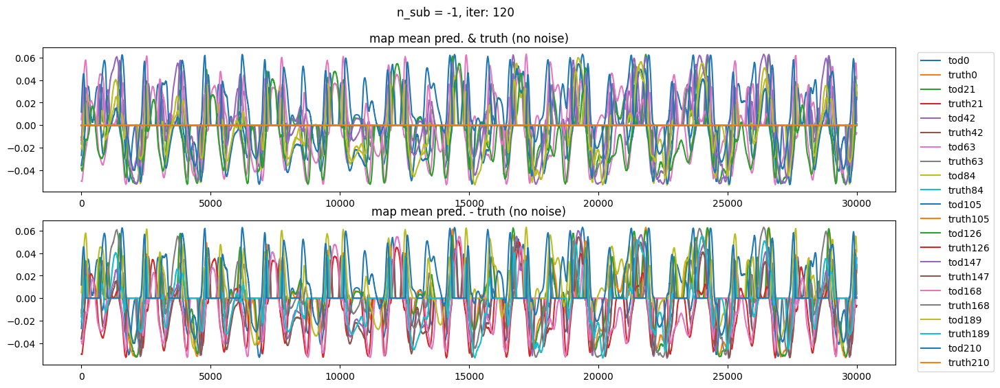

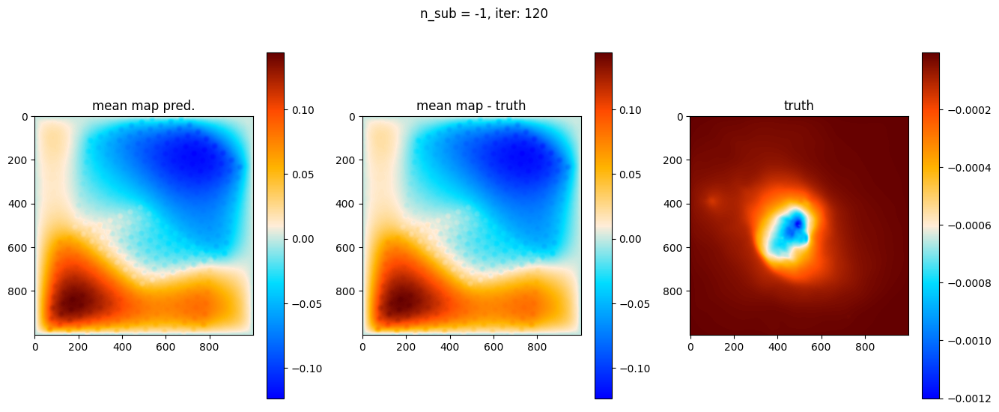

OPTIMIZE_KL: Starting 0121
SL: Iteration 0 ⛰:+3.2654e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5216e+05 Δ⛰:3.7176e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7244e+05 Δ⛰:2.0289e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8082e+05 Δ⛰:8.3786e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8480e+05 Δ⛰:3.9792e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8734e+05 Δ⛰:2.5337e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8735e+05 Δ⛰:8.5462e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.9325e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.0490e+05 Δ⛰:1.1659e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7681e+05 Δ⛰:7.1906e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7944e+05 Δ⛰:2.6253e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8752e+05 Δ⛰:8.0802e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9070e+05 Δ⛰:3.1802e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9072e+05 Δ⛰:2.0078e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9231e+05 Δ⛰:1.5906e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9457e+05 Δ⛰:2.2628e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9740e+05 Δ⛰:2.8322e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279169220380072, 0.0015, 0.0001
	loglogvarslope: 2.097585427315832, -2.45, 0.1
	zeromode std (LogNormal): 1.6913901513027716e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028033251685929076, 5.6e-05, 1e-06
	loglogvarslope: -2.515869941714475, -2.5, 0.1
	zeromode std (LogNormal): 1.4444240850695774e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-4.7196e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7210e+05 Δ⛰:1.3935e+02 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8157e+05 Δ⛰:9.4648e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8267e+05 Δ⛰:1.0966e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8596e+05 Δ⛰:3.2988e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8827e+05 Δ⛰:2.3061e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9031e+05 Δ⛰:2.0443e+03 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9033e+05 Δ⛰:1.2954e+01 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9541e+05 Δ⛰:5.0866e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9868e+05 Δ⛰:3.2616e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9968e+05 Δ⛰:1.0072e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0140e+05 Δ⛰:1.7185e+03 ➽:1.0201e+01
SL: Iteration 12 ⛰:-5.0257e+05 Δ⛰:1.1654e+03 ➽:1.0201e+01
SL: Iteration 13 ⛰:-5.0437e+05 Δ⛰:1.7993e+03 ➽:1.0201e+01
SL: Iteration 14 ⛰:-5.0491e+05 Δ⛰:5.4571e+02 ➽:1.0201e+01
SL: Iteration 15 ⛰:-5.0518e+05 Δ⛰:2.6909e+02 ➽:1.0201e+01
SL: Iteration 16 ⛰:-5.0549e+05 Δ⛰:3.0394e+02 ➽:1.0201e+01
SL: Iteration 17 ⛰:-5.0561e+05 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279361055833717, 0.0015, 0.0001
	loglogvarslope: 2.1029433113715763, -2.45, 0.1
	zeromode std (LogNormal): 1.6883225143354573e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0027959694856497003, 5.6e-05, 1e-06
	loglogvarslope: -2.5161727360987793, -2.5, 0.1
	zeromode std (LogNormal): 1.4436653271092955e-09, 1e-08, 1e-07


SL: Iteration 0 ⛰:-4.2102e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7817e+05 Δ⛰:5.7157e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8066e+05 Δ⛰:2.4827e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8535e+05 Δ⛰:4.6902e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8595e+05 Δ⛰:5.9907e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8866e+05 Δ⛰:2.7126e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8868e+05 Δ⛰:1.7081e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9144e+05 Δ⛰:2.7612e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9447e+05 Δ⛰:3.0355e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9768e+05 Δ⛰:3.2116e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9991e+05 Δ⛰:2.2309e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9992e+05 Δ⛰:1.2292e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-1.1303e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6673e+05 Δ⛰:3.5371e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7862e+05 Δ⛰:1.1888e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8015e+05 Δ⛰:1.5309e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8569e+05 Δ⛰:5.5324e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8758e+05 Δ⛰:1.8902e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279315296295696, 0.0015, 0.0001
	loglogvarslope: 2.102382898185427, -2.45, 0.1
	zeromode std (LogNormal): 1.689053745297531e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0029219110726168497, 5.6e-05, 1e-06
	loglogvarslope: -2.4640383869763385, -2.5, 0.1
	zeromode std (LogNormal): 6.676081036768134e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.1379e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6450e+05 Δ⛰:1.6024e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7497e+05 Δ⛰:1.0470e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8117e+05 Δ⛰:6.1939e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8289e+05 Δ⛰:1.7209e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8644e+05 Δ⛰:3.5567e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8644e+05 Δ⛰:9.1773e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.6681e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7471e+05 Δ⛰:3.1428e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8047e+05 Δ⛰:5.7622e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8261e+05 Δ⛰:2.1396e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8349e+05 Δ⛰:8.7836e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8584e+05 Δ⛰:2.3509e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8584e+05 Δ⛰:5.0583e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+5.4573e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.1725e+05 Δ⛰:5.8745e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7642e+05 Δ⛰:5.9166e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7797e+05 Δ⛰:1.5555e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279152951548667, 0.0015, 0.0001
	loglogvarslope: 2.1010762850044324, -2.45, 0.1
	zeromode std (LogNormal): 1.6916505638156663e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028484786966771394, 5.6e-05, 1e-06
	loglogvarslope: -2.512891849115607, -2.5, 0.1
	zeromode std (LogNormal): 6.702662792534712e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.6136e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5980e+05 Δ⛰:6.2115e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7570e+05 Δ⛰:1.5901e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8143e+05 Δ⛰:5.7351e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8530e+05 Δ⛰:3.8625e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8687e+05 Δ⛰:1.5700e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8687e+05 Δ⛰:1.8864e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.3855e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6654e+05 Δ⛰:2.7988e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7791e+05 Δ⛰:1.1371e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7890e+05 Δ⛰:9.9192e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8456e+05 Δ⛰:5.6641e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8713e+05 Δ⛰:2.5643e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8714e+05 Δ⛰:1.0785e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.8870e+05 Δ⛰:1.5664e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9321e+05 Δ⛰:4.5035e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9733e+05 Δ⛰:4.1255e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9900e+05 Δ⛰:1.6701e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279044719649221, 0.0015, 0.0001
	loglogvarslope: 2.0976045991082604, -2.45, 0.1
	zeromode std (LogNormal): 1.6933840413642057e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028614752310316717, 5.6e-05, 1e-06
	loglogvarslope: -2.5075057019833724, -2.5, 0.1
	zeromode std (LogNormal): 6.711947577924907e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+3.9475e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6217e+05 Δ⛰:4.4096e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.6984e+05 Δ⛰:7.6702e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7971e+05 Δ⛰:9.8677e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8238e+05 Δ⛰:2.6743e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8536e+05 Δ⛰:2.9789e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8542e+05 Δ⛰:6.1937e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.8858e+05 Δ⛰:3.1561e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9168e+05 Δ⛰:3.1025e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9592e+05 Δ⛰:4.2378e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9795e+05 Δ⛰:2.0334e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9795e+05 Δ⛰:1.3706e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.3802e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6296e+05 Δ⛰:2.8431e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7597e+05 Δ⛰:1.3011e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8054e+05 Δ⛰:4.5686e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8444e+05 Δ⛰:3.9014e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8705e+05 Δ⛰:2.6163e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279224206218145, 0.0015, 0.0001
	loglogvarslope: 2.101915194537816, -2.45, 0.1
	zeromode std (LogNormal): 1.6905103007838486e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002852362878193657, 5.6e-05, 1e-06
	loglogvarslope: -2.506522734248717, -2.5, 0.1
	zeromode std (LogNormal): 6.750155043155121e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.7958e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6637e+05 Δ⛰:6.4595e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8072e+05 Δ⛰:1.4356e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8502e+05 Δ⛰:4.2959e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8598e+05 Δ⛰:9.5752e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8954e+05 Δ⛰:3.5633e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8954e+05 Δ⛰:9.4194e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.5135e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5274e+05 Δ⛰:1.3921e+03 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7941e+05 Δ⛰:2.6669e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8408e+05 Δ⛰:4.6688e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8458e+05 Δ⛰:4.9622e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8684e+05 Δ⛰:2.2683e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8965e+05 Δ⛰:2.8099e+03 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9094e+05 Δ⛰:1.2848e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9347e+05 Δ⛰:2.5336e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9691e+05 Δ⛰:3.4365e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9927e+05 Δ⛰:2.3574e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279071868450336, 0.0015, 0.0001
	loglogvarslope: 2.0956510300913775, -2.45, 0.1
	zeromode std (LogNormal): 1.6929490493606104e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002890336822280541, 5.6e-05, 1e-06
	loglogvarslope: -2.487302497379161, -2.5, 0.1
	zeromode std (LogNormal): 6.757320682384951e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-3.9634e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4732e+05 Δ⛰:5.0979e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7869e+05 Δ⛰:3.1365e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7995e+05 Δ⛰:1.2585e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8494e+05 Δ⛰:4.9930e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8707e+05 Δ⛰:2.1260e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9002e+05 Δ⛰:2.9554e+03 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9112e+05 Δ⛰:1.0984e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9376e+05 Δ⛰:2.6433e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9837e+05 Δ⛰:4.6020e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0027e+05 Δ⛰:1.9094e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0028e+05 Δ⛰:2.9826e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.7480e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7100e+05 Δ⛰:7.4580e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7779e+05 Δ⛰:6.7915e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8362e+05 Δ⛰:5.8274e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8409e+05 Δ⛰:4.6957e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8617e+05 Δ⛰:2.0794e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279267231699836, 0.0015, 0.0001
	loglogvarslope: 2.1018859631097246, -2.45, 0.1
	zeromode std (LogNormal): 1.6898221539798572e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028712900187416656, 5.6e-05, 1e-06
	loglogvarslope: -2.496032114205352, -2.5, 0.1
	zeromode std (LogNormal): 6.753421805818039e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.5682e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7183e+05 Δ⛰:2.0400e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8113e+05 Δ⛰:9.2998e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8195e+05 Δ⛰:8.1530e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8442e+05 Δ⛰:2.4712e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8681e+05 Δ⛰:2.3870e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8681e+05 Δ⛰:2.5030e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.8658e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2348e+05 Δ⛰:1.9082e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7472e+05 Δ⛰:5.1240e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7734e+05 Δ⛰:2.6169e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8280e+05 Δ⛰:5.4619e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8454e+05 Δ⛰:1.7441e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8454e+05 Δ⛰:1.5980e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.5739e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5169e+05 Δ⛰:3.0256e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7844e+05 Δ⛰:2.6752e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8029e+05 Δ⛰:1.8460e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279140345008675, 0.0015, 0.0001
	loglogvarslope: 2.0989304815150884, -2.45, 0.1
	zeromode std (LogNormal): 1.6918523823564378e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028698046753210336, 5.6e-05, 1e-06
	loglogvarslope: -2.50305795460287, -2.5, 0.1
	zeromode std (LogNormal): 6.762279235329949e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+9.2587e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4132e+05 Δ⛰:1.3672e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8116e+05 Δ⛰:3.9841e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8169e+05 Δ⛰:5.3356e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8380e+05 Δ⛰:2.1117e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8633e+05 Δ⛰:2.5218e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8633e+05 Δ⛰:2.1078e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.0414e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5477e+05 Δ⛰:1.4962e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7937e+05 Δ⛰:2.4607e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8021e+05 Δ⛰:8.4029e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8449e+05 Δ⛰:4.2781e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8745e+05 Δ⛰:2.9631e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8746e+05 Δ⛰:1.8426e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+9.6432e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5123e+05 Δ⛰:1.0094e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8029e+05 Δ⛰:2.9059e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8194e+05 Δ⛰:1.6535e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279234678200475, 0.0015, 0.0001
	loglogvarslope: 2.103100175461951, -2.45, 0.1
	zeromode std (LogNormal): 1.6903427866038933e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028315804185191705, 5.6e-05, 1e-06
	loglogvarslope: -2.5290523249770294, -2.5, 0.1
	zeromode std (LogNormal): 6.781450849334633e-10, 1e-08, 1e-07


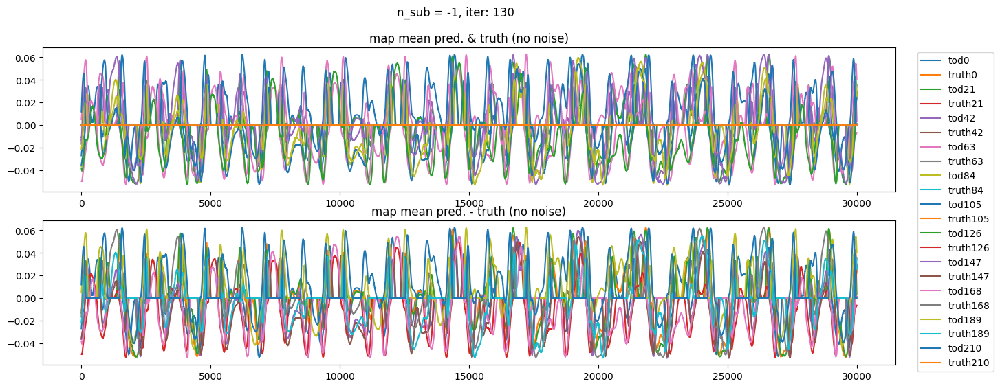

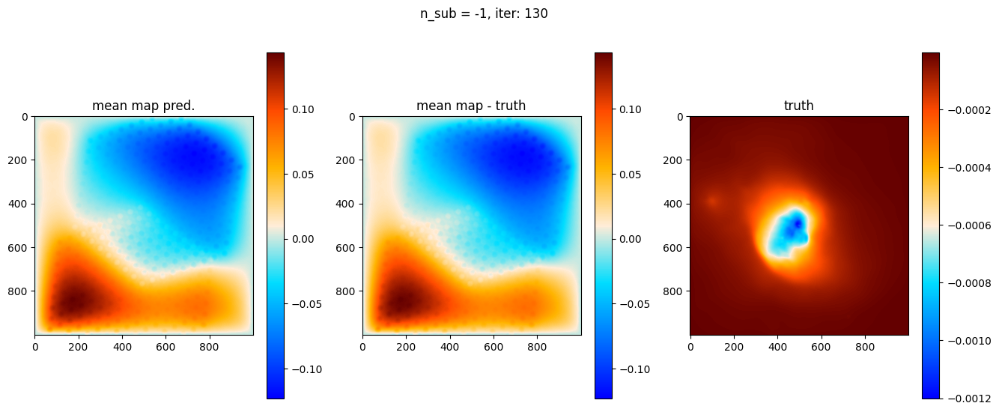

OPTIMIZE_KL: Starting 0131
SL: Iteration 0 ⛰:-3.2104e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3966e+05 Δ⛰:1.1862e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8160e+05 Δ⛰:4.1942e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8260e+05 Δ⛰:9.9922e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8500e+05 Δ⛰:2.3975e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8729e+05 Δ⛰:2.2883e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8729e+05 Δ⛰:2.0632e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.5165e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5200e+05 Δ⛰:1.1036e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8048e+05 Δ⛰:2.8486e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8211e+05 Δ⛰:1.6241e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8756e+05 Δ⛰:5.4528e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8946e+05 Δ⛰:1.9020e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8947e+05 Δ⛰:1.4542e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.9859e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.1860e+05 Δ⛰:4.4045e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8097e+05 Δ⛰:6.2366e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8356

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279043848382436, 0.0015, 0.0001
	loglogvarslope: 2.09783294996965, -2.45, 0.1
	zeromode std (LogNormal): 1.6933980031143883e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028420093376082802, 5.6e-05, 1e-06
	loglogvarslope: -2.5277386070285845, -2.5, 0.1
	zeromode std (LogNormal): 6.788403602963556e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+2.0118e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7686e+05 Δ⛰:2.4886e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8251e+05 Δ⛰:5.6523e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8615e+05 Δ⛰:3.6349e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8647e+05 Δ⛰:3.2237e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8821e+05 Δ⛰:1.7464e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8821e+05 Δ⛰:7.8171e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:-2.8440e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6729e+05 Δ⛰:1.8289e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7878e+05 Δ⛰:1.1483e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8117e+05 Δ⛰:2.3956e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8601e+05 Δ⛰:4.8345e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8779e+05 Δ⛰:1.7815e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8786e+05 Δ⛰:6.6890e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9158e+05 Δ⛰:3.7236e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9430e+05 Δ⛰:2.7202e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9728e+05 Δ⛰:2.9763e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0023e+05 Δ⛰:2.9494e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279244188196337, 0.0015, 0.0001
	loglogvarslope: 2.1012371206465845, -2.45, 0.1
	zeromode std (LogNormal): 1.6901906752334945e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028601917333787733, 5.6e-05, 1e-06
	loglogvarslope: -2.5072786185268243, -2.5, 0.1
	zeromode std (LogNormal): 6.802022562469122e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+4.8854e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3363e+05 Δ⛰:9.2217e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7876e+05 Δ⛰:4.5127e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8340e+05 Δ⛰:4.6430e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8389e+05 Δ⛰:4.8841e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8667e+05 Δ⛰:2.7786e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8676e+05 Δ⛰:8.8869e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9034e+05 Δ⛰:3.5765e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9414e+05 Δ⛰:3.8081e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9707e+05 Δ⛰:2.9255e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9933e+05 Δ⛰:2.2569e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9934e+05 Δ⛰:1.2696e+01 ➽:1.0201e+01
SL: Iteration 12 ⛰:-5.0153e+05 Δ⛰:2.1953e+03 ➽:1.0201e+01
SL: Iteration 13 ⛰:-5.0240e+05 Δ⛰:8.6271e+02 ➽:1.0201e+01
SL: Iteration 14 ⛰:-5.0382e+05 Δ⛰:1.4213e+03 ➽:1.0201e+01
SL: Iteration 15 ⛰:-5.0388e+05 Δ⛰:6.3609e+01 ➽:1.0201e+01
SL: Iteration 16 ⛰:-5.0397e+05 Δ⛰:8.9615e+01 ➽:1.0201e+01
SL: Iteration 17 ⛰:-5.0476e+05 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279164133426768, 0.0015, 0.0001
	loglogvarslope: 2.0991341516864157, -2.45, 0.1
	zeromode std (LogNormal): 1.6914715730235866e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028640336279725774, 5.6e-05, 1e-06
	loglogvarslope: -2.508628723574954, -2.5, 0.1
	zeromode std (LogNormal): 6.80911589465653e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-7.7629e+04 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6889e+05 Δ⛰:3.9126e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8306e+05 Δ⛰:1.4173e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8360e+05 Δ⛰:5.3540e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8580e+05 Δ⛰:2.2048e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8753e+05 Δ⛰:1.7228e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8754e+05 Δ⛰:1.6303e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9044e+05 Δ⛰:2.8966e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9364e+05 Δ⛰:3.2057e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9783e+05 Δ⛰:4.1899e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9986e+05 Δ⛰:2.0262e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9986e+05 Δ⛰:8.9969e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+9.0452e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2806e+05 Δ⛰:1.3326e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7768e+05 Δ⛰:4.9619e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7928e+05 Δ⛰:1.5944e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8443e+05 Δ⛰:5.1539e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8787e+05 Δ⛰:3.4335e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279130945479406, 0.0015, 0.0001
	loglogvarslope: 2.0989647848817254, -2.45, 0.1
	zeromode std (LogNormal): 1.6920028755319518e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028410436598251174, 5.6e-05, 1e-06
	loglogvarslope: -2.530911496625279, -2.5, 0.1
	zeromode std (LogNormal): 6.148135314946356e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+5.3467e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6417e+05 Δ⛰:5.8109e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7818e+05 Δ⛰:1.4011e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8168e+05 Δ⛰:3.5052e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8676e+05 Δ⛰:5.0743e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8815e+05 Δ⛰:1.3884e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8815e+05 Δ⛰:1.1438e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.6961e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7418e+05 Δ⛰:4.5773e+03 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7939e+05 Δ⛰:5.2015e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8421e+05 Δ⛰:4.8278e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8483e+05 Δ⛰:6.1704e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8716e+05 Δ⛰:2.3294e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8721e+05 Δ⛰:4.8996e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.8952e+05 Δ⛰:2.3122e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9340e+05 Δ⛰:3.8755e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9666e+05 Δ⛰:3.2616e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9800e+05 Δ⛰:1.3416e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279206279843008, 0.0015, 0.0001
	loglogvarslope: 2.100976290714531, -2.45, 0.1
	zeromode std (LogNormal): 1.690797097330678e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028348230770484832, 5.6e-05, 1e-06
	loglogvarslope: -2.5336145407429917, -2.5, 0.1
	zeromode std (LogNormal): 6.16092881554322e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+5.7186e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5787e+05 Δ⛰:6.1764e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8122e+05 Δ⛰:2.3351e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8233e+05 Δ⛰:1.1062e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8567e+05 Δ⛰:3.3385e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8794e+05 Δ⛰:2.2790e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8794e+05 Δ⛰:5.1458e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.2792e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4527e+05 Δ⛰:6.7244e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7808e+05 Δ⛰:3.2814e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8052e+05 Δ⛰:2.4391e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8691e+05 Δ⛰:6.3812e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8800e+05 Δ⛰:1.0972e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8800e+05 Δ⛰:8.2272e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.3742e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6649e+05 Δ⛰:6.4208e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7968e+05 Δ⛰:1.3188e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8173e+05 Δ⛰:2.0542e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279130303910243, 0.0015, 0.0001
	loglogvarslope: 2.100364431520612, -2.45, 0.1
	zeromode std (LogNormal): 1.6920131480036267e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002807927630745532, 5.6e-05, 1e-06
	loglogvarslope: -2.5546674361719304, -2.5, 0.1
	zeromode std (LogNormal): 6.178761195906158e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-2.8297e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5142e+05 Δ⛰:1.6845e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7719e+05 Δ⛰:2.5767e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8722e+05 Δ⛰:1.0029e+04 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8775e+05 Δ⛰:5.3720e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8881e+05 Δ⛰:1.0580e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8882e+05 Δ⛰:9.5179e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.9898e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.9720e+05 Δ⛰:2.3870e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8208e+05 Δ⛰:8.4876e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8328e+05 Δ⛰:1.1987e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8618e+05 Δ⛰:2.9064e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8905e+05 Δ⛰:2.8669e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8905e+05 Δ⛰:1.3083e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.2303e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7104e+05 Δ⛰:1.4801e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8114e+05 Δ⛰:1.0101e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8271e+05 Δ⛰:1.5704e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279065318234559, 0.0015, 0.0001
	loglogvarslope: 2.098052082586774, -2.45, 0.1
	zeromode std (LogNormal): 1.6930539899959673e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028187255271659674, 5.6e-05, 1e-06
	loglogvarslope: -2.547234790443118, -2.5, 0.1
	zeromode std (LogNormal): 6.192312163428316e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+6.0268e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6020e+05 Δ⛰:6.4870e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7798e+05 Δ⛰:1.7781e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8166e+05 Δ⛰:3.6830e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8549e+05 Δ⛰:3.8251e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8824e+05 Δ⛰:2.7495e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8824e+05 Δ⛰:1.1788e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.5174e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4844e+05 Δ⛰:2.5622e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8081e+05 Δ⛰:3.2368e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8231e+05 Δ⛰:1.5003e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8736e+05 Δ⛰:5.0488e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8963e+05 Δ⛰:2.2692e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8964e+05 Δ⛰:9.3826e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.5737e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5972e+05 Δ⛰:7.0334e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7381e+05 Δ⛰:1.4092e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8065e+05 Δ⛰:6.8416e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279165465407242, 0.0015, 0.0001
	loglogvarslope: 2.101127178161329, -2.45, 0.1
	zeromode std (LogNormal): 1.691450253001396e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002807813842935468, 5.6e-05, 1e-06
	loglogvarslope: -2.5516871397127754, -2.5, 0.1
	zeromode std (LogNormal): 6.199903648811627e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-1.3979e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3848e+05 Δ⛰:2.9869e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8350e+05 Δ⛰:4.5025e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8513e+05 Δ⛰:1.6316e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8763e+05 Δ⛰:2.4960e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8917e+05 Δ⛰:1.5410e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8919e+05 Δ⛰:2.1900e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9220e+05 Δ⛰:3.0049e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9578e+05 Δ⛰:3.5850e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9792e+05 Δ⛰:2.1341e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9989e+05 Δ⛰:1.9768e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9989e+05 Δ⛰:4.0891e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.0534e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7311e+05 Δ⛰:1.5265e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8302e+05 Δ⛰:9.9131e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8614e+05 Δ⛰:3.1175e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8805e+05 Δ⛰:1.9133e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8939e+05 Δ⛰:1.3420e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279095225437278, 0.0015, 0.0001
	loglogvarslope: 2.098613472793059, -2.45, 0.1
	zeromode std (LogNormal): 1.6925749017627392e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028174916253980785, 5.6e-05, 1e-06
	loglogvarslope: -2.546540013009407, -2.5, 0.1
	zeromode std (LogNormal): 6.20645637169152e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-3.7951e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.8629e+05 Δ⛰:6.7841e+03 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8074e+05 Δ⛰:9.4444e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8240e+05 Δ⛰:1.6685e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8688e+05 Δ⛰:4.4801e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9007e+05 Δ⛰:3.1844e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9010e+05 Δ⛰:2.8001e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9204e+05 Δ⛰:1.9473e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9443e+05 Δ⛰:2.3828e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9682e+05 Δ⛰:2.3968e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9946e+05 Δ⛰:2.6325e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9946e+05 Δ⛰:6.2666e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.6519e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7745e+05 Δ⛰:1.2263e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7978e+05 Δ⛰:2.3255e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8454e+05 Δ⛰:4.7656e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8642e+05 Δ⛰:1.8807e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8870e+05 Δ⛰:2.2739e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279275747021833, 0.0015, 0.0001
	loglogvarslope: 2.0999678750753317, -2.45, 0.1
	zeromode std (LogNormal): 1.689685993905532e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002850181786522788, 5.6e-05, 1e-06
	loglogvarslope: -2.5184615520496285, -2.5, 0.1
	zeromode std (LogNormal): 6.218363906293257e-10, 1e-08, 1e-07


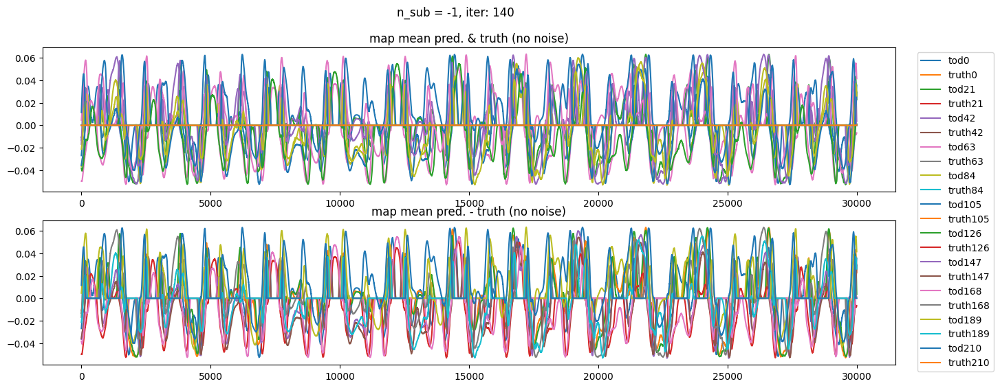

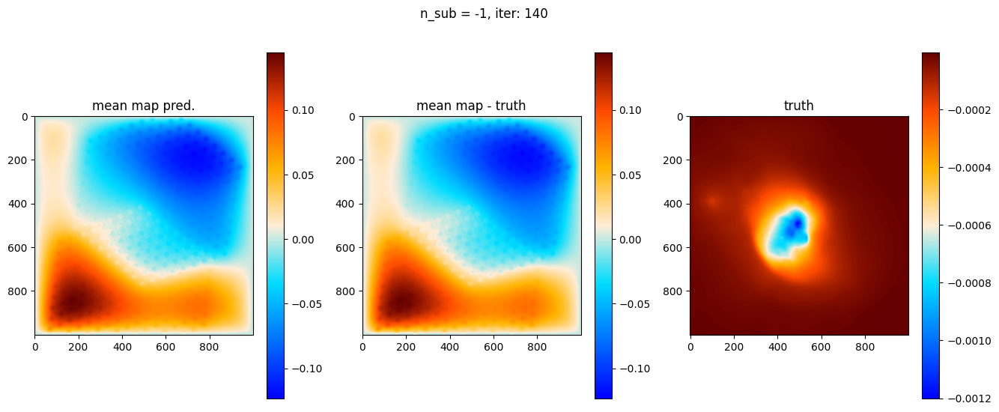

OPTIMIZE_KL: Starting 0141
SL: Iteration 0 ⛰:+3.1906e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.9496e+05 Δ⛰:3.5855e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7927e+05 Δ⛰:8.4309e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8123e+05 Δ⛰:1.9559e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8505e+05 Δ⛰:3.8255e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8619e+05 Δ⛰:1.1397e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8619e+05 Δ⛰:9.8378e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.5755e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3292e+05 Δ⛰:1.0905e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7018e+05 Δ⛰:3.7265e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7784e+05 Δ⛰:7.6559e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8324e+05 Δ⛰:5.4068e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8546e+05 Δ⛰:2.2174e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8546e+05 Δ⛰:2.4491e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.8497e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2872e+05 Δ⛰:6.1369e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7814e+05 Δ⛰:4.9425e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7965

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279307898579272, 0.0015, 0.0001
	loglogvarslope: 2.10254339204673, -2.45, 0.1
	zeromode std (LogNormal): 1.689171989705989e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.00284107009588683, 5.6e-05, 1e-06
	loglogvarslope: -2.526590063197669, -2.5, 0.1
	zeromode std (LogNormal): 6.22960576354831e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+9.6433e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.1913e+05 Δ⛰:9.9624e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7202e+05 Δ⛰:1.5289e+05 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7657e+05 Δ⛰:4.5504e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8477e+05 Δ⛰:8.2042e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8762e+05 Δ⛰:2.8517e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8762e+05 Δ⛰:1.0479e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.0574e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.5826e+05 Δ⛰:5.6401e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7729e+05 Δ⛰:1.1902e+05 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7921e+05 Δ⛰:1.9268e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8434e+05 Δ⛰:5.1299e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8622e+05 Δ⛰:1.8778e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8622e+05 Δ⛰:2.4405e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.4474e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5418e+05 Δ⛰:9.4366e+03 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8347e+05 Δ⛰:2.9292e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8465e+05 Δ⛰:1.1826e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279229407305936, 0.0015, 0.0001
	loglogvarslope: 2.1006737869824317, -2.45, 0.1
	zeromode std (LogNormal): 1.6904270999513173e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028428523301956238, 5.6e-05, 1e-06
	loglogvarslope: -2.5274384082158887, -2.5, 0.1
	zeromode std (LogNormal): 6.235931171462822e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+7.1676e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7795e+05 Δ⛰:7.6456e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8062e+05 Δ⛰:2.6733e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8451e+05 Δ⛰:3.8850e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8563e+05 Δ⛰:1.1227e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8781e+05 Δ⛰:2.1799e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8781e+05 Δ⛰:2.8925e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-8.9598e+04 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6325e+05 Δ⛰:3.7365e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8127e+05 Δ⛰:1.8019e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8532e+05 Δ⛰:4.0544e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8581e+05 Δ⛰:4.8306e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8794e+05 Δ⛰:2.1354e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8807e+05 Δ⛰:1.2719e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9280e+05 Δ⛰:4.7288e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9549e+05 Δ⛰:2.6903e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9789e+05 Δ⛰:2.4031e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0061e+05 Δ⛰:2.7184e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279252423390827, 0.0015, 0.0001
	loglogvarslope: 2.1016332251190395, -2.45, 0.1
	zeromode std (LogNormal): 1.6900589653202695e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002837293050134432, 5.6e-05, 1e-06
	loglogvarslope: -2.5303120540219055, -2.5, 0.1
	zeromode std (LogNormal): 6.241771028034007e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+5.6073e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7248e+05 Δ⛰:1.0332e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8321e+05 Δ⛰:1.0724e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8528e+05 Δ⛰:2.0721e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8671e+05 Δ⛰:1.4335e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8826e+05 Δ⛰:1.5455e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8826e+05 Δ⛰:1.1809e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.8270e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6343e+05 Δ⛰:4.2904e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7400e+05 Δ⛰:1.0564e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7828e+05 Δ⛰:4.2819e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8392e+05 Δ⛰:5.6375e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8730e+05 Δ⛰:3.3792e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8730e+05 Δ⛰:1.1576e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.4107e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2401e+05 Δ⛰:1.8347e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8293e+05 Δ⛰:5.8928e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8397e+05 Δ⛰:1.0358e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627918885199352, 0.0015, 0.0001
	loglogvarslope: 2.1014340995465144, -2.45, 0.1
	zeromode std (LogNormal): 1.6910759651108616e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028140861288649998, 5.6e-05, 1e-06
	loglogvarslope: -2.5482422765125254, -2.5, 0.1
	zeromode std (LogNormal): 6.258652345924894e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-4.3366e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.8330e+05 Δ⛰:4.9634e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8457e+05 Δ⛰:1.2737e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8643e+05 Δ⛰:1.8577e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8723e+05 Δ⛰:8.0275e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8892e+05 Δ⛰:1.6863e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9088e+05 Δ⛰:1.9615e+03 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9170e+05 Δ⛰:8.1735e+02 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9430e+05 Δ⛰:2.6047e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9666e+05 Δ⛰:2.3604e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9938e+05 Δ⛰:2.7156e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0019e+05 Δ⛰:8.1554e+02 ➽:1.0201e+01
SL: Iteration 12 ⛰:-5.0132e+05 Δ⛰:1.1275e+03 ➽:1.0201e+01
SL: Iteration 13 ⛰:-5.0239e+05 Δ⛰:1.0689e+03 ➽:1.0201e+01
SL: Iteration 14 ⛰:-5.0344e+05 Δ⛰:1.0491e+03 ➽:1.0201e+01
SL: Iteration 15 ⛰:-5.0430e+05 Δ⛰:8.6569e+02 ➽:1.0201e+01
SL: Iteration 16 ⛰:-5.0431e+05 Δ⛰:1.0616e+01 ➽:1.0201e+01
SL: Iteration 17 ⛰:-5.0438e+05 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627913490794061, 0.0015, 0.0001
	loglogvarslope: 2.097687037103663, -2.45, 0.1
	zeromode std (LogNormal): 1.6919394320662585e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028388767944968816, 5.6e-05, 1e-06
	loglogvarslope: -2.5309902183428523, -2.5, 0.1
	zeromode std (LogNormal): 6.267084667350467e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.6173e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2584e+05 Δ⛰:2.0431e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7932e+05 Δ⛰:5.3478e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8146e+05 Δ⛰:2.1370e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8642e+05 Δ⛰:4.9633e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8857e+05 Δ⛰:2.1538e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8857e+05 Δ⛰:5.3928e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.9434e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6163e+05 Δ⛰:5.4051e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8163e+05 Δ⛰:1.9998e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8458e+05 Δ⛰:2.9518e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8596e+05 Δ⛰:1.3862e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8696e+05 Δ⛰:9.9363e+02 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8696e+05 Δ⛰:1.5359e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.7415e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4409e+05 Δ⛰:1.7859e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7932e+05 Δ⛰:3.5231e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8069e+05 Δ⛰:1.3736e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279287424236862, 0.0015, 0.0001
	loglogvarslope: 2.1026640481190704, -2.45, 0.1
	zeromode std (LogNormal): 1.6894992930673614e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028271613420270403, 5.6e-05, 1e-06
	loglogvarslope: -2.534665145923919, -2.5, 0.1
	zeromode std (LogNormal): 6.273226940980183e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+2.0683e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.5726e+05 Δ⛰:2.1040e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7757e+05 Δ⛰:1.2031e+05 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8144e+05 Δ⛰:3.8714e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8756e+05 Δ⛰:6.1147e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8954e+05 Δ⛰:1.9866e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8955e+05 Δ⛰:2.6400e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.9297e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6149e+05 Δ⛰:4.3912e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8470e+05 Δ⛰:2.3206e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8566e+05 Δ⛰:9.5603e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8815e+05 Δ⛰:2.4924e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9139e+05 Δ⛰:3.2413e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9139e+05 Δ⛰:8.8746e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.0194e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2399e+05 Δ⛰:2.0618e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8326e+05 Δ⛰:5.9274e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8437e+05 Δ⛰:1.1075e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279185850420993, 0.0015, 0.0001
	loglogvarslope: 2.0997471019537555, -2.45, 0.1
	zeromode std (LogNormal): 1.6911239987660263e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028341574237683814, 5.6e-05, 1e-06
	loglogvarslope: -2.5330588191596544, -2.5, 0.1
	zeromode std (LogNormal): 6.281137356657405e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+8.2293e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6025e+05 Δ⛰:8.6896e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7575e+05 Δ⛰:1.5501e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7905e+05 Δ⛰:3.2957e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8414e+05 Δ⛰:5.0880e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8575e+05 Δ⛰:1.6123e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8575e+05 Δ⛰:1.4306e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+3.0509e+03 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6791e+05 Δ⛰:4.7096e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7579e+05 Δ⛰:7.8771e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8083e+05 Δ⛰:5.0438e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8400e+05 Δ⛰:3.1696e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8658e+05 Δ⛰:2.5750e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8669e+05 Δ⛰:1.1770e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9005e+05 Δ⛰:3.3528e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9360e+05 Δ⛰:3.5549e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9610e+05 Δ⛰:2.5022e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9952e+05 Δ⛰:3.4127e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279251942922864, 0.0015, 0.0001
	loglogvarslope: 2.1015353736362323, -2.45, 0.1
	zeromode std (LogNormal): 1.6900666494227838e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028332406690652627, 5.6e-05, 1e-06
	loglogvarslope: -2.530373297603424, -2.5, 0.1
	zeromode std (LogNormal): 6.293516427447268e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+9.6428e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7318e+05 Δ⛰:1.0116e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7788e+05 Δ⛰:4.7050e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8386e+05 Δ⛰:5.9786e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8505e+05 Δ⛰:1.1879e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8794e+05 Δ⛰:2.8862e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8794e+05 Δ⛰:1.2847e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.5438e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7299e+05 Δ⛰:7.0168e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7767e+05 Δ⛰:4.6790e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8349e+05 Δ⛰:5.8212e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8468e+05 Δ⛰:1.1837e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8628e+05 Δ⛰:1.6078e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8631e+05 Δ⛰:2.5753e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9053e+05 Δ⛰:4.2172e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9369e+05 Δ⛰:3.1619e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9650e+05 Δ⛰:2.8141e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9936e+05 Δ⛰:2.8591e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279176330128505, 0.0015, 0.0001
	loglogvarslope: 2.1002492808079305, -2.45, 0.1
	zeromode std (LogNormal): 1.691276359472069e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002826394458090656, 5.6e-05, 1e-06
	loglogvarslope: -2.5373784298772244, -2.5, 0.1
	zeromode std (LogNormal): 6.306621763568151e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-2.4001e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3294e+05 Δ⛰:1.9293e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8163e+05 Δ⛰:4.8687e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8310e+05 Δ⛰:1.4699e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8675e+05 Δ⛰:3.6473e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8859e+05 Δ⛰:1.8444e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8861e+05 Δ⛰:2.0244e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9139e+05 Δ⛰:2.7750e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9510e+05 Δ⛰:3.7145e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9737e+05 Δ⛰:2.2639e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0010e+05 Δ⛰:2.7355e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0010e+05 Δ⛰:1.0010e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.8957e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6855e+05 Δ⛰:2.3642e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8318e+05 Δ⛰:1.4622e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8446e+05 Δ⛰:1.2849e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8798e+05 Δ⛰:3.5188e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8995e+05 Δ⛰:1.9750e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627918375055609, 0.0015, 0.0001
	loglogvarslope: 2.10004601694048, -2.45, 0.1
	zeromode std (LogNormal): 1.6911576033822783e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002792599393519668, 5.6e-05, 1e-06
	loglogvarslope: -2.5435196984262443, -2.5, 0.1
	zeromode std (LogNormal): 6.788553674071192e-10, 1e-08, 1e-07


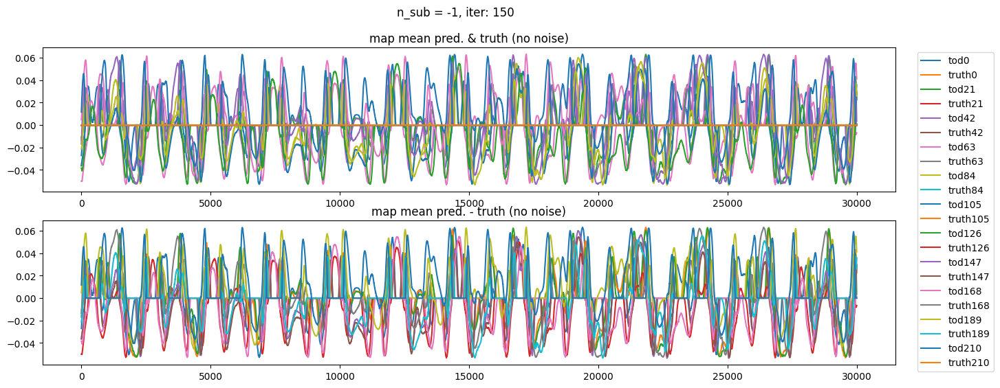

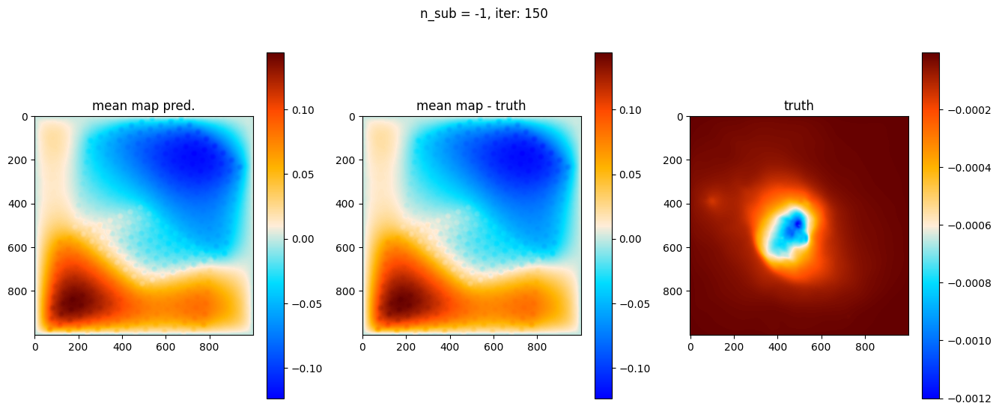

OPTIMIZE_KL: Starting 0151
SL: Iteration 0 ⛰:+8.7912e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6414e+05 Δ⛰:9.2553e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7933e+05 Δ⛰:1.5188e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8113e+05 Δ⛰:1.8008e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8508e+05 Δ⛰:3.9528e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8666e+05 Δ⛰:1.5766e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8666e+05 Δ⛰:2.2272e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-6.0154e+02 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5351e+05 Δ⛰:4.5290e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8668e+05 Δ⛰:3.3175e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8734e+05 Δ⛰:6.6294e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8941e+05 Δ⛰:2.0636e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9073e+05 Δ⛰:1.3242e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9074e+05 Δ⛰:1.1603e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9268e+05 Δ⛰:1.9380e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9614e+05 Δ⛰:3.4568e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9886e+05 Δ⛰:2.7172e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279262362498877, 0.0015, 0.0001
	loglogvarslope: 2.0993255135654776, -2.45, 0.1
	zeromode std (LogNormal): 1.6899000175576945e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002840073261062665, 5.6e-05, 1e-06
	loglogvarslope: -2.501678309149, -2.5, 0.1
	zeromode std (LogNormal): 6.804202724737464e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.1609e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5359e+05 Δ⛰:1.6145e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7597e+05 Δ⛰:2.2388e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7910e+05 Δ⛰:3.1285e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8407e+05 Δ⛰:4.9645e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8714e+05 Δ⛰:3.0703e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8714e+05 Δ⛰:6.2385e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.3617e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5809e+05 Δ⛰:4.8198e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7844e+05 Δ⛰:2.0349e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8288e+05 Δ⛰:4.4406e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8353e+05 Δ⛰:6.5066e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8517e+05 Δ⛰:1.6414e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8517e+05 Δ⛰:1.4907e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.2589e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5015e+05 Δ⛰:1.2426e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7658e+05 Δ⛰:2.6430e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8206e+05 Δ⛰:5.4811e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279440580696232, 0.0015, 0.0001
	loglogvarslope: 2.1052816412965054, -2.45, 0.1
	zeromode std (LogNormal): 1.6870524763290566e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002820190839798919, 5.6e-05, 1e-06
	loglogvarslope: -2.515004147872947, -2.5, 0.1
	zeromode std (LogNormal): 6.845639355749195e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.2222e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6326e+05 Δ⛰:1.2685e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7714e+05 Δ⛰:1.3875e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8242e+05 Δ⛰:5.2843e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8707e+05 Δ⛰:4.6488e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8913e+05 Δ⛰:2.0622e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8913e+05 Δ⛰:8.7219e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:-2.6676e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6560e+05 Δ⛰:1.9884e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7841e+05 Δ⛰:1.2811e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8133e+05 Δ⛰:2.9185e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8480e+05 Δ⛰:3.4667e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8778e+05 Δ⛰:2.9827e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8793e+05 Δ⛰:1.4629e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9049e+05 Δ⛰:2.5620e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9489e+05 Δ⛰:4.3992e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9823e+05 Δ⛰:3.3397e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0039e+05 Δ⛰:2.1644e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279226670613534, 0.0015, 0.0001
	loglogvarslope: 2.1001250059687777, -2.45, 0.1
	zeromode std (LogNormal): 1.6904708778284634e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028203540876826473, 5.6e-05, 1e-06
	loglogvarslope: -2.522676094007018, -2.5, 0.1
	zeromode std (LogNormal): 6.853868969069573e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+8.4859e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5434e+05 Δ⛰:8.9403e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8219e+05 Δ⛰:2.7850e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8310e+05 Δ⛰:9.1187e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8542e+05 Δ⛰:2.3188e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8798e+05 Δ⛰:2.5602e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8798e+05 Δ⛰:3.4633e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+8.0444e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6826e+05 Δ⛰:1.2727e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7444e+05 Δ⛰:6.1821e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8401e+05 Δ⛰:9.5746e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8503e+05 Δ⛰:1.0140e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8684e+05 Δ⛰:1.8080e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8688e+05 Δ⛰:3.9973e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9110e+05 Δ⛰:4.2253e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9454e+05 Δ⛰:3.4381e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9780e+05 Δ⛰:3.2618e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9990e+05 Δ⛰:2.1032e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279296558552026, 0.0015, 0.0001
	loglogvarslope: 2.1025579604034537, -2.45, 0.1
	zeromode std (LogNormal): 1.6893532638082655e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028105353473566884, 5.6e-05, 1e-06
	loglogvarslope: -2.527531359699601, -2.5, 0.1
	zeromode std (LogNormal): 6.859052273276213e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-4.3259e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6006e+05 Δ⛰:2.7476e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8325e+05 Δ⛰:2.3188e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8416e+05 Δ⛰:9.1161e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8612e+05 Δ⛰:1.9577e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8843e+05 Δ⛰:2.3114e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8845e+05 Δ⛰:1.8432e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9231e+05 Δ⛰:3.8635e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9465e+05 Δ⛰:2.3401e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9753e+05 Δ⛰:2.8747e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0012e+05 Δ⛰:2.5913e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0012e+05 Δ⛰:3.0888e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.4286e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4753e+05 Δ⛰:1.8761e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7768e+05 Δ⛰:3.0144e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8038e+05 Δ⛰:2.6983e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8392e+05 Δ⛰:3.5484e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8538e+05 Δ⛰:1.4517e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627923509380961, 0.0015, 0.0001
	loglogvarslope: 2.0999806666295537, -2.45, 0.1
	zeromode std (LogNormal): 1.6903361387313317e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028262337975312446, 5.6e-05, 1e-06
	loglogvarslope: -2.5186629652665133, -2.5, 0.1
	zeromode std (LogNormal): 6.867861197427061e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+4.0801e+04 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.0737e+05 Δ⛰:4.4817e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8089e+05 Δ⛰:7.3517e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8213e+05 Δ⛰:1.2417e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8452e+05 Δ⛰:2.3951e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8736e+05 Δ⛰:2.8308e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8736e+05 Δ⛰:1.2054e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.7241e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7992e+05 Δ⛰:1.0751e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8125e+05 Δ⛰:1.3289e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8483e+05 Δ⛰:3.5823e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8551e+05 Δ⛰:6.8305e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8866e+05 Δ⛰:3.1518e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8890e+05 Δ⛰:2.3571e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9061e+05 Δ⛰:1.7069e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9494e+05 Δ⛰:4.3371e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9755e+05 Δ⛰:2.6050e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0005e+05 Δ⛰:2.4992e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279315784649003, 0.0015, 0.0001
	loglogvarslope: 2.1024158028039057, -2.45, 0.1
	zeromode std (LogNormal): 1.689045939843173e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028208702593710143, 5.6e-05, 1e-06
	loglogvarslope: -2.519888727273695, -2.5, 0.1
	zeromode std (LogNormal): 6.902121046384508e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+3.1600e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5200e+05 Δ⛰:3.6120e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8058e+05 Δ⛰:2.8585e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8302e+05 Δ⛰:2.4390e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8612e+05 Δ⛰:3.0956e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8841e+05 Δ⛰:2.2940e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8841e+05 Δ⛰:8.8870e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.1933e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5625e+05 Δ⛰:3.6925e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7984e+05 Δ⛰:2.3593e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8078e+05 Δ⛰:9.3132e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8480e+05 Δ⛰:4.0238e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8741e+05 Δ⛰:2.6088e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8791e+05 Δ⛰:5.0314e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.8973e+05 Δ⛰:1.8171e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9324e+05 Δ⛰:3.5088e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9623e+05 Δ⛰:2.9938e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9812e+05 Δ⛰:1.8872e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627921609821462, 0.0015, 0.0001
	loglogvarslope: 2.100824553291609, -2.45, 0.1
	zeromode std (LogNormal): 1.6906400112965587e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028086995330201554, 5.6e-05, 1e-06
	loglogvarslope: -2.5312568050623248, -2.5, 0.1
	zeromode std (LogNormal): 6.908938641941485e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+9.3761e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4669e+05 Δ⛰:9.8228e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8293e+05 Δ⛰:3.6241e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8375e+05 Δ⛰:8.1902e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8885e+05 Δ⛰:5.1024e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9106e+05 Δ⛰:2.2101e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9109e+05 Δ⛰:2.7931e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9396e+05 Δ⛰:2.8709e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9585e+05 Δ⛰:1.8871e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9866e+05 Δ⛰:2.8113e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0001e+05 Δ⛰:1.3505e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0074e+05 Δ⛰:7.2450e+02 ➽:1.0201e+01
SL: Iteration 12 ⛰:-5.0293e+05 Δ⛰:2.1929e+03 ➽:1.0201e+01
SL: Iteration 13 ⛰:-5.0382e+05 Δ⛰:8.8942e+02 ➽:1.0201e+01
SL: Iteration 14 ⛰:-5.0485e+05 Δ⛰:1.0309e+03 ➽:1.0201e+01
SL: Iteration 15 ⛰:-5.0485e+05 Δ⛰:3.3012e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.2346e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2560e+05 Δ⛰:2.1458

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279267489426063, 0.0015, 0.0001
	loglogvarslope: 2.1010121081274926, -2.45, 0.1
	zeromode std (LogNormal): 1.689818032814112e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028216795106674993, 5.6e-05, 1e-06
	loglogvarslope: -2.520116868332754, -2.5, 0.1
	zeromode std (LogNormal): 6.919752225872512e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+4.6058e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4518e+05 Δ⛰:5.0510e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8492e+05 Δ⛰:3.9738e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8616e+05 Δ⛰:1.2416e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8809e+05 Δ⛰:1.9336e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8991e+05 Δ⛰:1.8153e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8991e+05 Δ⛰:2.0876e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+9.3741e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7541e+05 Δ⛰:1.4128e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8050e+05 Δ⛰:5.0944e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8421e+05 Δ⛰:3.7034e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8659e+05 Δ⛰:2.3826e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8843e+05 Δ⛰:1.8424e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8843e+05 Δ⛰:8.7497e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.5336e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6254e+05 Δ⛰:9.1793e+03 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8070e+05 Δ⛰:1.8165e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8186e+05 Δ⛰:1.1594e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279290915529653, 0.0015, 0.0001
	loglogvarslope: 2.102897961836848, -2.45, 0.1
	zeromode std (LogNormal): 1.6894434766807963e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028060466407563564, 5.6e-05, 1e-06
	loglogvarslope: -2.5305284919024134, -2.5, 0.1
	zeromode std (LogNormal): 6.929417713604153e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.6549e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6322e+05 Δ⛰:1.7012e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8175e+05 Δ⛰:1.8529e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8373e+05 Δ⛰:1.9779e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8531e+05 Δ⛰:1.5851e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9020e+05 Δ⛰:4.8916e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9024e+05 Δ⛰:3.8751e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9204e+05 Δ⛰:1.7954e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9425e+05 Δ⛰:2.2156e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9687e+05 Δ⛰:2.6144e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9928e+05 Δ⛰:2.4183e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9953e+05 Δ⛰:2.4371e+02 ➽:1.0201e+01
SL: Iteration 12 ⛰:-5.0134e+05 Δ⛰:1.8156e+03 ➽:1.0201e+01
SL: Iteration 13 ⛰:-5.0238e+05 Δ⛰:1.0327e+03 ➽:1.0201e+01
SL: Iteration 14 ⛰:-5.0358e+05 Δ⛰:1.2038e+03 ➽:1.0201e+01
SL: Iteration 15 ⛰:-5.0360e+05 Δ⛰:1.4290e+01 ➽:1.0201e+01
SL: Iteration 16 ⛰:-5.0400e+05 Δ⛰:4.0508e+02 ➽:1.0201e+01
SL: Iteration 17 ⛰:-5.0453e+05 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279204465416398, 0.0015, 0.0001
	loglogvarslope: 2.100130656848604, -2.45, 0.1
	zeromode std (LogNormal): 1.6908261283346923e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028135119208551438, 5.6e-05, 1e-06
	loglogvarslope: -2.5276318889920772, -2.5, 0.1
	zeromode std (LogNormal): 6.934380925321754e-10, 1e-08, 1e-07


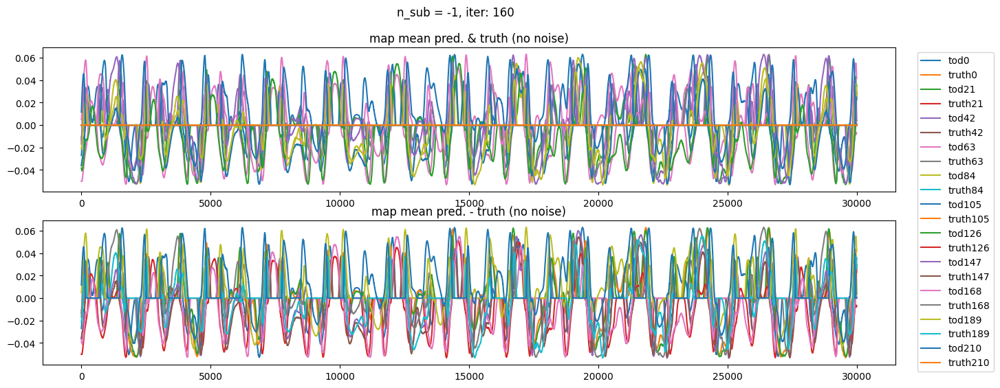

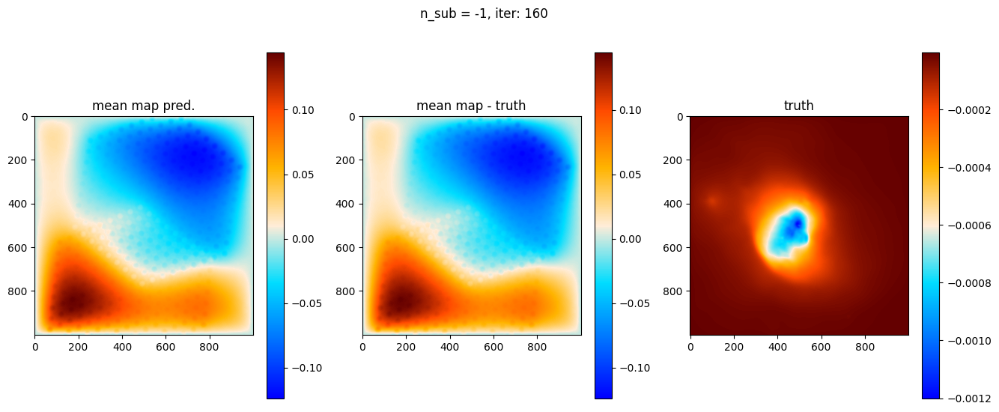

OPTIMIZE_KL: Starting 0161
SL: Iteration 0 ⛰:+2.2172e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4682e+05 Δ⛰:2.6640e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7977e+05 Δ⛰:3.2948e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8138e+05 Δ⛰:1.6127e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8633e+05 Δ⛰:4.9509e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8796e+05 Δ⛰:1.6348e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8796e+05 Δ⛰:1.2309e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.3569e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6912e+05 Δ⛰:1.3343e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7932e+05 Δ⛰:1.0196e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8404e+05 Δ⛰:4.7181e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8682e+05 Δ⛰:2.7794e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8919e+05 Δ⛰:2.3778e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8920e+05 Δ⛰:2.0235e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.5222e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3291e+05 Δ⛰:6.8513e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7476e+05 Δ⛰:4.1848e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7961

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279261475276746, 0.0015, 0.0001
	loglogvarslope: 2.1019940858028914, -2.45, 0.1
	zeromode std (LogNormal): 1.6899142055454725e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028067744014303848, 5.6e-05, 1e-06
	loglogvarslope: -2.5302844487133376, -2.5, 0.1
	zeromode std (LogNormal): 6.939807722178726e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+2.4136e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2594e+05 Δ⛰:2.4562e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8359e+05 Δ⛰:5.7649e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8416e+05 Δ⛰:5.6635e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8719e+05 Δ⛰:3.0312e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8938e+05 Δ⛰:2.1873e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8938e+05 Δ⛰:2.1296e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.0464e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3520e+05 Δ⛰:2.4816e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7521e+05 Δ⛰:4.0012e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8052e+05 Δ⛰:5.3082e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8616e+05 Δ⛰:5.6354e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8901e+05 Δ⛰:2.8513e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8901e+05 Δ⛰:2.2393e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-2.0854e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7328e+05 Δ⛰:2.6473e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8351e+05 Δ⛰:1.0235e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8436e+05 Δ⛰:8.4970e+02 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279214406998053, 0.0015, 0.0001
	loglogvarslope: 2.100799398485342, -2.45, 0.1
	zeromode std (LogNormal): 1.6906670683578155e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002806029066064826, 5.6e-05, 1e-06
	loglogvarslope: -2.53325214954057, -2.5, 0.1
	zeromode std (LogNormal): 6.947441611409789e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-9.5434e+03 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5534e+05 Δ⛰:4.4579e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7997e+05 Δ⛰:2.4629e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8159e+05 Δ⛰:1.6255e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8547e+05 Δ⛰:3.8742e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8708e+05 Δ⛰:1.6182e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8709e+05 Δ⛰:1.1192e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9109e+05 Δ⛰:3.9966e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9420e+05 Δ⛰:3.1117e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9689e+05 Δ⛰:2.6829e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9883e+05 Δ⛰:1.9400e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9883e+05 Δ⛰:7.5582e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.2603e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4580e+05 Δ⛰:1.3049e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7805e+05 Δ⛰:3.2253e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8157e+05 Δ⛰:3.5165e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8556e+05 Δ⛰:3.9902e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8724e+05 Δ⛰:1.6859e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279229219895801, 0.0015, 0.0001
	loglogvarslope: 2.1015062909537665, -2.45, 0.1
	zeromode std (LogNormal): 1.6904300978709265e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028005725241601422, 5.6e-05, 1e-06
	loglogvarslope: -2.5353954349650123, -2.5, 0.1
	zeromode std (LogNormal): 6.953029025486838e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+1.2428e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4966e+05 Δ⛰:1.6925e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7564e+05 Δ⛰:2.5974e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8198e+05 Δ⛰:6.3394e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8556e+05 Δ⛰:3.5854e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8724e+05 Δ⛰:1.6773e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8724e+05 Δ⛰:2.0282e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.4407e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.8800e+05 Δ⛰:4.3935e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8008e+05 Δ⛰:9.2075e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8613e+05 Δ⛰:6.0548e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8697e+05 Δ⛰:8.3670e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8745e+05 Δ⛰:4.7976e+02 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8745e+05 Δ⛰:7.6319e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+2.2454e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6233e+05 Δ⛰:2.7078e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7633e+05 Δ⛰:1.3998e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8228e+05 Δ⛰:5.9506e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.001627915916110436, 0.0015, 0.0001
	loglogvarslope: 2.101346671173973, -2.45, 0.1
	zeromode std (LogNormal): 1.691551163775865e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002777166493328267, 5.6e-05, 1e-06
	loglogvarslope: -2.551235742911892, -2.5, 0.1
	zeromode std (LogNormal): 6.963443242912035e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+8.9655e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6172e+05 Δ⛰:9.4272e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8052e+05 Δ⛰:1.8798e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8321e+05 Δ⛰:2.6914e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8679e+05 Δ⛰:3.5757e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9018e+05 Δ⛰:3.3950e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9021e+05 Δ⛰:2.0674e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9176e+05 Δ⛰:1.5574e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9353e+05 Δ⛰:1.7709e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9612e+05 Δ⛰:2.5904e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9884e+05 Δ⛰:2.7169e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9891e+05 Δ⛰:7.3756e+01 ➽:1.0201e+01
SL: Iteration 12 ⛰:-5.0075e+05 Δ⛰:1.8369e+03 ➽:1.0201e+01
SL: Iteration 13 ⛰:-5.0183e+05 Δ⛰:1.0781e+03 ➽:1.0201e+01
SL: Iteration 14 ⛰:-5.0353e+05 Δ⛰:1.6994e+03 ➽:1.0201e+01
SL: Iteration 15 ⛰:-5.0355e+05 Δ⛰:1.9600e+01 ➽:1.0201e+01
SL: Iteration 16 ⛰:-5.0371e+05 Δ⛰:1.6246e+02 ➽:1.0201e+01
SL: Iteration 17 ⛰:-5.0447e+05 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279119905287232, 0.0015, 0.0001
	loglogvarslope: 2.095011710273777, -2.45, 0.1
	zeromode std (LogNormal): 1.6921796541117944e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028225750873786403, 5.6e-05, 1e-06
	loglogvarslope: -2.5241672235049815, -2.5, 0.1
	zeromode std (LogNormal): 6.975078717429097e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-1.4735e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5966e+05 Δ⛰:3.1231e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8195e+05 Δ⛰:2.2293e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8254e+05 Δ⛰:5.9317e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8481e+05 Δ⛰:2.2676e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8740e+05 Δ⛰:2.5940e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8741e+05 Δ⛰:3.2933e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-4.3323e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6809e+05 Δ⛰:3.4858e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7806e+05 Δ⛰:9.9709e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8133e+05 Δ⛰:3.2688e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8625e+05 Δ⛰:4.9243e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8743e+05 Δ⛰:1.1819e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8748e+05 Δ⛰:4.5636e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9073e+05 Δ⛰:3.2482e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9450e+05 Δ⛰:3.7710e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9747e+05 Δ⛰:2.9743e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9954e+05 Δ⛰:2.0648e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279375572252138, 0.0015, 0.0001
	loglogvarslope: 2.103815808125969, -2.45, 0.1
	zeromode std (LogNormal): 1.6880906106880815e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002811453891659908, 5.6e-05, 1e-06
	loglogvarslope: -2.523389080648232, -2.5, 0.1
	zeromode std (LogNormal): 6.979872994302343e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+3.9369e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7230e+05 Δ⛰:3.9842e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8172e+05 Δ⛰:9.4218e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8586e+05 Δ⛰:4.1335e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8612e+05 Δ⛰:2.6234e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8809e+05 Δ⛰:1.9708e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8813e+05 Δ⛰:3.8601e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.8981e+05 Δ⛰:1.6877e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9317e+05 Δ⛰:3.3597e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9583e+05 Δ⛰:2.6551e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9812e+05 Δ⛰:2.2925e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9834e+05 Δ⛰:2.1295e+02 ➽:1.0201e+01
SL: Iteration 12 ⛰:-5.0052e+05 Δ⛰:2.1809e+03 ➽:1.0201e+01
SL: Iteration 13 ⛰:-5.0179e+05 Δ⛰:1.2714e+03 ➽:1.0201e+01
SL: Iteration 14 ⛰:-5.0290e+05 Δ⛰:1.1148e+03 ➽:1.0201e+01
SL: Iteration 15 ⛰:-5.0294e+05 Δ⛰:3.5107e+01 ➽:1.0201e+01
SL: Iteration 16 ⛰:-5.0370e+05 Δ⛰:7.5884e+02 ➽:1.0201e+01
SL: Iteration 17 ⛰:-5.0399e+05 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279227333483239, 0.0015, 0.0001
	loglogvarslope: 2.099406641303802, -2.45, 0.1
	zeromode std (LogNormal): 1.6904602740466573e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028282477822540383, 5.6e-05, 1e-06
	loglogvarslope: -2.5160504323981923, -2.5, 0.1
	zeromode std (LogNormal): 6.990455648856789e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+2.1934e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.2873e+05 Δ⛰:2.6221e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7621e+05 Δ⛰:4.7477e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8365e+05 Δ⛰:7.4430e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8503e+05 Δ⛰:1.3776e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8718e+05 Δ⛰:2.1475e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8718e+05 Δ⛰:1.3188e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.5732e+04 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4625e+05 Δ⛰:5.1198e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7958e+05 Δ⛰:3.3337e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8475e+05 Δ⛰:5.1701e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8532e+05 Δ⛰:5.6642e+02 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8774e+05 Δ⛰:2.4245e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8775e+05 Δ⛰:1.4676e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.5242e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.8303e+05 Δ⛰:5.3545e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7583e+05 Δ⛰:9.2798e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7872e+05 Δ⛰:2.8909e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279328523447977, 0.0015, 0.0001
	loglogvarslope: 2.103977778377107, -2.45, 0.1
	zeromode std (LogNormal): 1.6888423445814368e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028015603096327966, 5.6e-05, 1e-06
	loglogvarslope: -2.5321298966237094, -2.5, 0.1
	zeromode std (LogNormal): 6.995558494187289e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-4.4372e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5722e+05 Δ⛰:1.3503e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8462e+05 Δ⛰:2.7404e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8540e+05 Δ⛰:7.7864e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8879e+05 Δ⛰:3.3910e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9081e+05 Δ⛰:2.0198e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9086e+05 Δ⛰:4.1503e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9236e+05 Δ⛰:1.5031e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9584e+05 Δ⛰:3.4765e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9876e+05 Δ⛰:2.9211e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0051e+05 Δ⛰:1.7489e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-5.0051e+05 Δ⛰:1.6004e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.5537e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5058e+05 Δ⛰:2.0042e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7397e+05 Δ⛰:2.3392e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.7909e+05 Δ⛰:5.1211e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8741e+05 Δ⛰:8.3190e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8890e+05 Δ⛰:1.4913e+03

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279194754523717, 0.0015, 0.0001
	loglogvarslope: 2.098864763889649, -2.45, 0.1
	zeromode std (LogNormal): 1.6909815119563975e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028225320359837524, 5.6e-05, 1e-06
	loglogvarslope: -2.5215006296701077, -2.5, 0.1
	zeromode std (LogNormal): 7.000315181112742e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-1.2004e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5975e+05 Δ⛰:3.3971e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8016e+05 Δ⛰:2.0404e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8342e+05 Δ⛰:3.2600e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8843e+05 Δ⛰:5.0155e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9142e+05 Δ⛰:2.9909e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9142e+05 Δ⛰:1.6708e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:-3.6321e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5267e+05 Δ⛰:8.9453e+04 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8120e+05 Δ⛰:2.8535e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8265e+05 Δ⛰:1.4443e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8620e+05 Δ⛰:3.5514e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8799e+05 Δ⛰:1.7949e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8839e+05 Δ⛰:4.0320e+02 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9152e+05 Δ⛰:3.1249e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9522e+05 Δ⛰:3.7010e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9815e+05 Δ⛰:2.9289e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-5.0086e+05 Δ⛰:2.7079e+03 

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279322174913538, 0.0015, 0.0001
	loglogvarslope: 2.1030483403264606, -2.45, 0.1
	zeromode std (LogNormal): 1.6889438056553778e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028110678097028633, 5.6e-05, 1e-06
	loglogvarslope: -2.52569897384608, -2.5, 0.1
	zeromode std (LogNormal): 7.004451629197832e-10, 1e-08, 1e-07


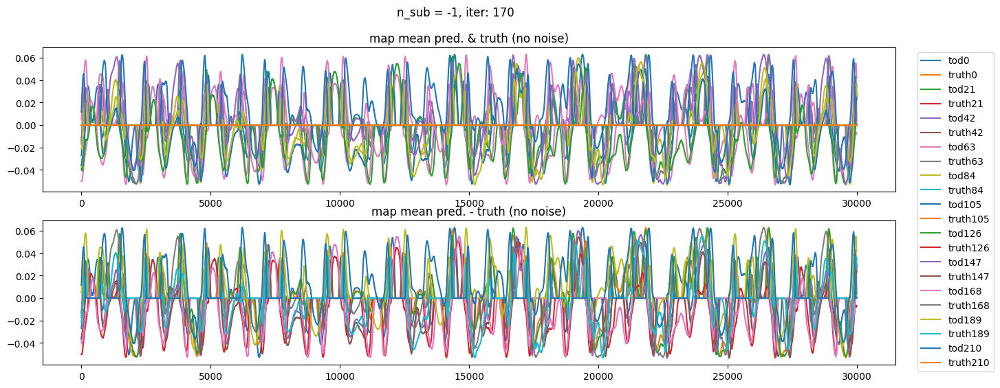

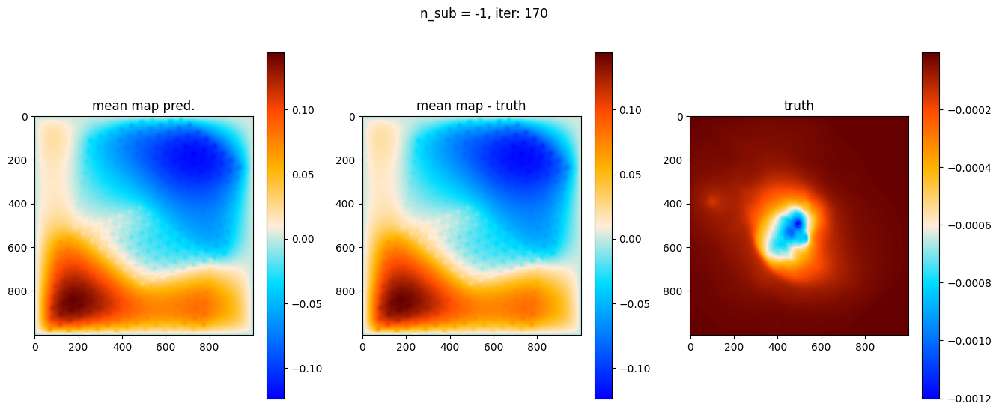

OPTIMIZE_KL: Starting 0171
SL: Iteration 0 ⛰:-2.6542e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7175e+05 Δ⛰:2.0634e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7999e+05 Δ⛰:8.2329e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8305e+05 Δ⛰:3.0613e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8618e+05 Δ⛰:3.1362e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8935e+05 Δ⛰:3.1678e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8936e+05 Δ⛰:4.5896e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+4.2865e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4520e+05 Δ⛰:8.7384e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7598e+05 Δ⛰:3.0784e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8042e+05 Δ⛰:4.4426e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8610e+05 Δ⛰:5.6730e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8784e+05 Δ⛰:1.7437e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8786e+05 Δ⛰:1.7791e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.9219e+05 Δ⛰:4.3280e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9523e+05 Δ⛰:3.0459e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9833e+05 Δ⛰:3.0919e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279226064482408, 0.0015, 0.0001
	loglogvarslope: 2.1007910744131397, -2.45, 0.1
	zeromode std (LogNormal): 1.6904805740425237e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002810309919969903, 5.6e-05, 1e-06
	loglogvarslope: -2.5293336448071533, -2.5, 0.1
	zeromode std (LogNormal): 7.022433548583882e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+9.3709e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.4110e+05 Δ⛰:1.2782e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8332e+05 Δ⛰:1.4222e+05 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8432e+05 Δ⛰:1.0019e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8869e+05 Δ⛰:4.3698e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9035e+05 Δ⛰:1.6564e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9035e+05 Δ⛰:2.1903e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.1145e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6524e+05 Δ⛰:1.1610e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8324e+05 Δ⛰:1.8007e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8377e+05 Δ⛰:5.2060e+02 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8567e+05 Δ⛰:1.9050e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8774e+05 Δ⛰:2.0723e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8774e+05 Δ⛰:1.4850e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+8.7028e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.4609e+05 Δ⛰:9.1489e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7836e+05 Δ⛰:3.2274e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8213e+05 Δ⛰:3.7687e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279276005593708, 0.0015, 0.0001
	loglogvarslope: 2.1013587418768527, -2.45, 0.1
	zeromode std (LogNormal): 1.689681859539657e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.0028188517460925825, 5.6e-05, 1e-06
	loglogvarslope: -2.521330969267955, -2.5, 0.1
	zeromode std (LogNormal): 7.033993283158241e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+2.8344e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.6067e+05 Δ⛰:7.4411e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7628e+05 Δ⛰:1.5606e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8115e+05 Δ⛰:4.8693e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8485e+05 Δ⛰:3.7071e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8793e+05 Δ⛰:3.0753e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8793e+05 Δ⛰:9.5338e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.3704e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3811e+05 Δ⛰:1.8085e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8299e+05 Δ⛰:4.4881e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8424e+05 Δ⛰:1.2505e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8638e+05 Δ⛰:2.1444e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8960e+05 Δ⛰:3.2220e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8961e+05 Δ⛰:3.2990e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+8.3413e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.5870e+05 Δ⛰:8.8000e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7990e+05 Δ⛰:2.1196e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8101e+05 Δ⛰:1.1086e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279263259477946, 0.0015, 0.0001
	loglogvarslope: 2.1028161604610407, -2.45, 0.1
	zeromode std (LogNormal): 1.6898856736737314e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002794373964065047, 5.6e-05, 1e-06
	loglogvarslope: -2.5396426479653704, -2.5, 0.1
	zeromode std (LogNormal): 7.04375261021089e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:+6.1255e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-3.4654e+05 Δ⛰:6.4721e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.8368e+05 Δ⛰:1.3713e+05 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8540e+05 Δ⛰:1.7215e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8900e+05 Δ⛰:3.6033e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.9077e+05 Δ⛰:1.7661e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.9077e+05 Δ⛰:2.1880e+00 ➽:1.0201e+01
SL: Iteration 0 ⛰:+9.5925e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3729e+05 Δ⛰:1.0030e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7976e+05 Δ⛰:4.2468e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8326e+05 Δ⛰:3.4955e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8789e+05 Δ⛰:4.6303e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8902e+05 Δ⛰:1.1340e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8902e+05 Δ⛰:9.7443e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+6.1972e+06 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7707e+05 Δ⛰:6.6742e+06 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7899e+05 Δ⛰:1.9237e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8678e+05 Δ⛰:7.7856e+03 ➽:1.0201

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0016279167180695208, 0.0015, 0.0001
	loglogvarslope: 2.099966309628506, -2.45, 0.1
	zeromode std (LogNormal): 1.6914227980716072e-11, 1e-05, 9.9e-06
map:
	fluctuations: 0.002800001129361305, 5.6e-05, 1e-06
	loglogvarslope: -2.537595975546185, -2.5, 0.1
	zeromode std (LogNormal): 7.048039050021512e-10, 1e-08, 1e-07


SL: Iteration 0 ⛰:-1.5455e+05 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.3671e+05 Δ⛰:2.8216e+05 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7867e+05 Δ⛰:4.1964e+04 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8038e+05 Δ⛰:1.7070e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8529e+05 Δ⛰:4.9082e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8734e+05 Δ⛰:2.0545e+03 ➽:1.0201e+01
SL: Iteration 6 ⛰:-4.8739e+05 Δ⛰:4.1919e+01 ➽:1.0201e+01
SL: Iteration 7 ⛰:-4.8999e+05 Δ⛰:2.6008e+03 ➽:1.0201e+01
SL: Iteration 8 ⛰:-4.9353e+05 Δ⛰:3.5407e+03 ➽:1.0201e+01
SL: Iteration 9 ⛰:-4.9636e+05 Δ⛰:2.8288e+03 ➽:1.0201e+01
SL: Iteration 10 ⛰:-4.9947e+05 Δ⛰:3.1153e+03 ➽:1.0201e+01
SL: Iteration 11 ⛰:-4.9947e+05 Δ⛰:6.9270e-01 ➽:1.0201e+01
SL: Iteration 0 ⛰:+1.7554e+07 Δ⛰:inf ➽:1.0201e+01
SL: Iteration 1 ⛰:-4.7787e+05 Δ⛰:1.8032e+07 ➽:1.0201e+01
SL: Iteration 2 ⛰:-4.7994e+05 Δ⛰:2.0674e+03 ➽:1.0201e+01
SL: Iteration 3 ⛰:-4.8353e+05 Δ⛰:3.5929e+03 ➽:1.0201e+01
SL: Iteration 4 ⛰:-4.8490e+05 Δ⛰:1.3656e+03 ➽:1.0201e+01
SL: Iteration 5 ⛰:-4.8704e+05 Δ⛰:2.1397e+03

In [ ]:
# Perform fit
# samples, state = fit.perform_fit(n_it=30, printevery=1)
samples, state = fit.perform_fit(n_it=1000, printevery=10)

# Show results:
fit.printfitresults(samples)
# fit.plotfitresults(samples) TODO: fix!
# fit.plotpowerspectrum(samples) TODO: fix!

# # Show reco comparison before expanding to full det:
# fit.plotrecos(samples)

# fit.make_atmosphere_det_gif(samples, figname=f"mustang_{fit.n_sub}_atmosphere_comp.gif", tmax=2500)
# # fit.make_atmosphere_det_gif(samples, figname=f"atlast_{fit.n_sub}_atmosphere_comp.gif", tmax=1000)